# libraries

In [2]:
library(plyr)
library(dplyr)
library(ggplot2)
library(ggalluvial)
library(reshape2)
library(stringr)

library(FactoMineR)
library(RColorBrewer)
library(plotly)
library(htmlwidgets)
library(tidyr)
library(ggforce)
library(data.table) 


Attaching package: ‘dplyr’


The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following objects are masked from ‘package:plyr’:

    arrange, mutate, rename, summarise


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout



Attaching package: ‘tidyr’


The following object is masked from ‘package:reshape2’:

    smiths



Attaching package: ‘data.table’


The following objects are masked from ‘package:reshape2’:

    dcast, melt


The following objects are masked from ‘package:dplyr’:

    between, first, last




In [3]:
library(permute)
library(lattice)
library(ade4)
library(vegan)
library(ape)


Attaching package: ‘ade4’


The following object is masked from ‘package:FactoMineR’:

    reconst


This is vegan 2.6-4


Attaching package: ‘ape’


The following object is masked from ‘package:dplyr’:

    where




In [4]:
library(MASS)


Attaching package: ‘MASS’


The following object is masked from ‘package:plotly’:

    select


The following object is masked from ‘package:dplyr’:

    select




In [5]:

library(pheatmap)

#library(ggformula)

library(gridExtra)

library(ggpubr)
library(ggExtra)


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine



Attaching package: ‘ggpubr’


The following object is masked from ‘package:ape’:

    rotate


The following object is masked from ‘package:plyr’:

    mutate




## to set the names for the following part you need to run "finding the name of signatures" at first 

In [6]:
# Prepare colours
# colours of ES : 'g__Streptococcus''g__Prevotella''g__Neisseria''g__Actinomyces''g__Rothia''g__Porphyromonas''g__GGB1144''g__Veillonella''g__Alloprevotella''g__Haemophilus'
all_es_names = c("SS_g__Streptococcus", "SS_g__Prevotella", "SS_g__Neisseria", "SS_g__Rothia", "SS_g__Actinomyces", "SS_g__Porphyromonas", "SS_g__Veillonella", "SS_g__GGB1144" , "SS_g__Alloprevotella" , "SS_g__Haemophilus" , "SS_g__Fusobacterium", "SS_g__Gemella")#, "SS_g__Corynebacterium","SS_g__Fusobacterium", "SS_Enterococcaceae;g__GGB10485" ,"SS_g__Isoptericola" )
# es2Col = c("#808000", "#FFEF00", "#C0C0C0", "#D55E00", "#023e8a", "#b52b5e") 
#es2Col = c("#009E73","#E69F00", "#483838", "#023e8a", "#D55E00","#b52b5e")
es2Col = c("#E69F00", "#009E73", "#483838", "#D55E00", "#023e8a", "#b52b5e", "#b59e8b", "#7f9c65", "#615C99", "#56B4E9", "#C0C0C0","#FFEF00" )
names(es2Col) = all_es_names


In [7]:
# genera appearing in at least 4% of one ES across all ES nb
all_genera_4pc = c("g__Actinomyces","g__GGB1844" ,"g__Peptostreptococcus","g__Rothia", "g__Isoptericola", "g__Porphyromonas", "g__Prevotella", "g__Gemella", "g__Granulicatella","g__Aggregatibacter", "g__GGB10485", "g__Streptococcus", "g__Eubacteriales_Family_XIII_Incertae_Sedis_unclassified", "g__Veillonella", "g__Parvimonas", "g__Fusobacterium", "g__Neisseria", "g__Haemophilus", "others")
# colours of genera 
#g4_colours = c("#FFFF33", "#ffa54d", "#ff7f00", "#FF9933", "#cc6600", "#994c00", "#ffb266", "#2e692c", "#3e8c3b", "#71bf6e", "#4daf4a", "#4b8bbf", "#d7e5f1", "#afcbe3", "#9bbfdc" , "#D3D3D3")
g4_colours = c("#FFFF33","#ffa54d","#FF9933","#CBEAA6", "#006D77" ,"#D3C2CE","#ffa54d", "#ff7f00", "#FF9933", "#cc6600", "#994c00", "#ffb266", "#2e692c", "#3e8c3b", "#71bf6e", "#4daf4a", "#4b8bbf", "#d7e5f1", "#afcbe3", "#9bbfdc", "#73a5cd", "#2c6593", "#377eb8", "#5295cb", "#0b1925", "#214c6e", "#16324a", "#A65628", "#a260ac", "#5b2f62", "#b783bf", "#984ea3", "#7a3e82", "#3d1f41", "#c195c8")#, "#d6b8da", "#e94849", "#D3D3D3")
names(g4_colours) = all_genera_4pc



In [8]:
all_phyla = c("p__Euryarchaeota","p__Actinobacteria", "p__Bacteroidetes", "p__Firmicutes", "p__Fusobacteria", "p__Proteobacteria" ,"p__Candidatus_Saccharibacteria" ,"others")
#phyla_cols = c("#CBEAA6", "#CBEAA6", "#CBEAA6", "#006D77", "#D3C2CE" , "#CBEAA6")
phyla_cols = c("#CBEAA6", "#CBEAA6", "#CBEAA6", "#006D77", "#D3C2CE", "#CBEAA6", "#CBEAA6", "#CBEAA6", "#CBEAA6", "#006494","#247BA0","#1B98E0","#0099E0", "#CBEAA6", "#CBEAA6", "#FF8A5B", "#CBEAA6", "#CBEAA6", "#CBEAA6", "#CBEAA6", "#CBEAA6", "#CBEAA6", "#1B98E0")
names(phyla_cols) = all_phyla

# Functions 

In [9]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/")

In [10]:
# Read and normalise abundance matric
read_normalise_abmatrix <- function(f) {
    # read abundance matrix
    mx = as.matrix(read.table(f, header=TRUE, row.names=1, sep="\t"))
    print(paste0("Data loaded: ", nrow(mx), " taxa, ", ncol(mx), " samples. "))
    # remove unknown bact
    #mx = mx[!rownames(mx) %in% c("?", "?;?;?;?;?;?","?;?;?;?;?","?;?;?;?","?;?;?","?;?"),]
    # print how many removed bact
    #print(paste0("After removing unknown taxa: ", nrow(mx) , " taxa, ", ncol(mx), " samples. "))
    # remove bact that were never observed
    #mx = mx[rowSums(mx > 0) > 0,]
    # print how many removed bact
    #print(paste0("After removing non-observed taxa: ", nrow(mx), " taxa, ", ncol(mx), " samples. "))
    # remove samples that were not observed
    #mx = mx[,colSums(mx > 0) > 0]
    # print how many removed samples
    #print(paste0("After removing unobserved samples: ", nrow(mx), " taxa, ", ncol(mx), " samples. "))
    # normalize by sum of all reads in a sample (i.e. column)
    #mx_norm = sweep(mx,2,colSums(mx),"/")
    head(mx)
    mx_norm <- mx
    head(mx_norm)
    return(mx_norm)
}

In [11]:
# retrieve the nth element of each item in a list
n_elem_list <- function(lst, n){
         sapply(lst, `[`, n)
   }


In [13]:
# Shorten the names of taxa by keeping only the genus if not duplicated in the name vector
shorten_genus <- function(genus, genera_list){
    shorten <- gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", genus, perl = TRUE)
    # print(paste("shorten ", shorten))
    # count how many times the shorten version of the genus appears in the vector
    if (grepl( ";", shorten, fixed = TRUE)) {
        nb_occ <- sum(str_count(genera_list, coll(shorten)))
    } else {
        nb_occ <- sum(str_count(genera_list, sprintf("\\b%s\\b", shorten)))
    } 
    # print(paste("nbocc ", nb_occ))
    # count how many times the shorten version of the genus appears in the shorten version of all x in the vector
    if (grepl( ";", shorten, fixed = TRUE)) {
        nb_occ2 <- sum(str_count(gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", genera_list), coll(shorten)))
    } else {
        nb_occ2 <- sum(str_count(gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", genera_list), sprintf("\\b%s\\b", shorten)))
    } 
    # print(paste("nbocc2 ", nb_occ2))
    shorten2= ifelse(nb_occ2 > 1, gsub(".*;([a-zA-Z0-9-\\?]+;[a-zA-Z0-9-\\?]+;[a-zA-Z0-9-\\?]+)$", "\\1", genus, perl = TRUE), shorten)
    # print(paste("shorten ", shorten))
    return(ifelse(nb_occ == 1, shorten, ifelse(nb_occ2 ==1, gsub(".*;([a-zA-Z0-9-]+;[a-zA-Z0-9-]+)$", "\\1", genus, perl = TRUE), shorten2)))
}

In [14]:
multiplot <- function(..., plotlist=NULL, file, cols=1, layout=NULL) {
    library(grid)
    # Make a list from the ... arguments and plotlist
    plots <- c(list(...), plotlist)
    numPlots = length(plots)
    # If layout is NULL, then use 'cols' to determine layout
    if (is.null(layout)) {
    # Make the panel
    # ncol: Number of columns of plots
    # nrow: Number of rows needed, calculated from # of cols
    layout <- matrix(seq(1, cols * ceiling(numPlots/cols)),
                        ncol = cols, nrow = ceiling(numPlots/cols))
    }
    if (numPlots==1) {
    print(plots[[1]])
    } else {
    # Set up the page
    grid.newpage()
    pushViewport(viewport(layout = grid.layout(nrow(layout), ncol(layout))))
    # Make each plot, in the correct location
    for (i in 1:numPlots) {
        # Get the i,j matrix positions of the regions that contain this subplot
        matchidx <- as.data.frame(which(layout == i, arr.ind = TRUE))  
        print(plots[[i]], vp = viewport(layout.pos.row = matchidx$row,
                                        layout.pos.col = matchidx$col))
        }
    }
}


In [15]:
# JensenShannon distance caculation
dist.JSD <- function(inMatrix, pseudocount=0.000001, ...) {
    KLD <- function(x,y) sum(x *log(x/y))
    JSD<- function(x,y) sqrt(0.5 * KLD(x, (x+y)/2) + 0.5 * KLD(y, (x+y)/2))
    matrixColSize <- length(colnames(inMatrix))
    matrixRowSize <- length(rownames(inMatrix))
    colnames <- colnames(inMatrix)
    resultsMatrix <- matrix(0, matrixColSize, matrixColSize)

    inMatrix = apply(inMatrix,1:2,function(x) ifelse (x==0,pseudocount,x))

    for(i in 1:matrixColSize) {
    for(j in 1:matrixColSize) { 
        resultsMatrix[i,j]=JSD(as.vector(inMatrix[,i]),
                                as.vector(inMatrix[,j]))
    }
    }
    colnames -> colnames(resultsMatrix) -> rownames(resultsMatrix)
    as.dist(resultsMatrix)->resultsMatrix
    attr(resultsMatrix, "method") <- "dist"
    return(resultsMatrix) 
}


In [16]:
# Plot the content of ES 
es_content <- function(W_mat, es2col) {
    # W_mat is p x r (p: features, r: signatures)
    # normalize W by col (sum of expression of all features in a sig = 1)
    W = sweep(W_mat,2,colSums(W_mat),"/") # W is now n x r (n: measured features (bact) in row, r: signatures in columns)
    cat(colSums(W))
    es2Col = c("#E69F00", "#483838", "#009E73", "#56B4E9", "#023e8a", "#B0437F", "#D55E00", "#D8EEFD", "#615C99", "#6C6F7F", "#FF9E51", "#FCACD8")
    es2col = es2col[colnames(W)]
    # plot
    par(las = 1, mar = c(5.1, 15.1, 2.1, 2.1));
    sigPickup=0.04 #originally 0.05
    m = W[rowSums(W >= sigPickup) > 0,]
    plot(0, pch = "", ylim = c(0, nrow(m)+1), xlim = c(0, ncol(m)+1), yaxt="n", axes = F, xlab = "", ylab ="") 
    axis(1, 1:ncol(m), colnames(m))
    rn = gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", row.names(m), perl = TRUE)
    axis(2, 1:nrow(m), rn, cex.axis=1.5)
    abline(h=1:nrow(m), col="gray", lty=3)
    for(i in 1:ncol(m)) {
    use = m[,i] > 0.01
    if (length(use)==0 || sum(use)==0){next}
    points(rep(i, nrow(m))[use], (1:nrow(m))[use], col = es2col[i], cex = 10*m[use,i], pch = 19)
    points(rep(i, nrow(m))[use], (1:nrow(m))[use], cex = 10*m[use,i])
    text(rep(i, nrow(m))[use] + max(m[,i])/4, (1:nrow(m))[use], paste0(round(100*m[use,i]), "%"), pos = 4, cex = 1.6, col = "black")
    }
}

In [17]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

In [18]:
res_dir0 <- "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [19]:
nmf_data_dir <- "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [20]:
min_rank <- 2
max_rank <- 10

# read input files: 

In [21]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/input_tsv/")

In [22]:
abmatrix_file = "all_controls_taxa.tsv"  # reading the abundance matrix

In [23]:
mx_norm <- read_normalise_abmatrix(abmatrix_file)

[1] "Data loaded: 279 taxa, 350 samples. "


In [24]:

head(mx_norm)
dim(mx_norm)

,ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0005968001,0.0000000,0.0000000,0.005260202,0.0000000,0.0000000,0.00000000,0.0000000,0.00125690,0.00000000
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.05382444,0.04336831,0.04499588,0.04303282,0.04722141,0.04634425,0.0479301,0.0497472,0.05176529,0.05129079,⋯,0.1366596137,0.0448105,0.1071999,0.098148339,0.1101339,0.1218446,0.07148459,0.1628886,0.06875319,0.07654338
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000


[1] 279 350

In [25]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/input_tsv/")

In [26]:
metadata_matrix = "all_controls_meta.tsv"

In [27]:
mdmx = as.data.frame(read.table(metadata_matrix, header=TRUE, sep="\t"))

In [28]:
head(mdmx)
dim(mdmx)
tail(mdmx)

,accession,sampleid,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
7,SAMEA4873293,ERR2764791,NA,Control,M,Germany,NA
8,SAMEA4873293,ERR2764792,NA,Control,M,Germany,NA
9,SAMEA4873293,ERR2764793,NA,Control,M,Germany,NA
10,SAMEA4873293,ERR2764790,NA,Control,M,Germany,NA
11,SAMEA4873294,ERR2764795,NA,Control,M,Germany,NA
12,SAMEA4873294,ERR2764796,NA,Control,M,Germany,NA


[1] 396   7

,accession,sampleid,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
548,SAMN28004673,SRR19117626,70,Control,M,Japan,NA
549,SAMN28004672,SRR19117625,70,Control,M,Japan,NA
550,SAMN28004671,SRR19117624,70,Control,M,Japan,NA
551,SAMN28004670,SRR19117623,70,Control,M,Japan,NA
552,SAMN28004669,SRR19117621,70,Control,F,Japan,NA
553,SAMN28004668,SRR19117620,70,Control,M,Japan,NA


In [29]:
table(mdmx$disease_status)
unique(mdmx$disease_status)


Control 
    396 

[1] "Control"

In [28]:
#it is only for checking healthy samples

In [31]:
controls <- mdmx[(mdmx$disease_status == "Control" & !is.na(mdmx$disease_status)), ]
head(controls)
dim(controls)
tail(controls)
unique(controls$disease_status)


,accession,sampleid,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
7,SAMEA4873293,ERR2764791,NA,Control,M,Germany,NA
8,SAMEA4873293,ERR2764792,NA,Control,M,Germany,NA
9,SAMEA4873293,ERR2764793,NA,Control,M,Germany,NA
10,SAMEA4873293,ERR2764790,NA,Control,M,Germany,NA
11,SAMEA4873294,ERR2764795,NA,Control,M,Germany,NA
12,SAMEA4873294,ERR2764796,NA,Control,M,Germany,NA


[1] 396   7

,accession,sampleid,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
548,SAMN28004673,SRR19117626,70,Control,M,Japan,NA
549,SAMN28004672,SRR19117625,70,Control,M,Japan,NA
550,SAMN28004671,SRR19117624,70,Control,M,Japan,NA
551,SAMN28004670,SRR19117623,70,Control,M,Japan,NA
552,SAMN28004669,SRR19117621,70,Control,F,Japan,NA
553,SAMN28004668,SRR19117620,70,Control,M,Japan,NA


[1] "Control"

In [33]:
colnames(mdmx)[colnames(mdmx) == "sampleid"] <- "SmplID"
head(mdmx)

,accession,SmplID,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
7,SAMEA4873293,ERR2764791,NA,Control,M,Germany,NA
8,SAMEA4873293,ERR2764792,NA,Control,M,Germany,NA
9,SAMEA4873293,ERR2764793,NA,Control,M,Germany,NA
10,SAMEA4873293,ERR2764790,NA,Control,M,Germany,NA
11,SAMEA4873294,ERR2764795,NA,Control,M,Germany,NA
12,SAMEA4873294,ERR2764796,NA,Control,M,Germany,NA


In [34]:
head(mx_norm)
dim(mx_norm)

,ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0005968001,0.0000000,0.0000000,0.005260202,0.0000000,0.0000000,0.00000000,0.0000000,0.00125690,0.00000000
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.05382444,0.04336831,0.04499588,0.04303282,0.04722141,0.04634425,0.0479301,0.0497472,0.05176529,0.05129079,⋯,0.1366596137,0.0448105,0.1071999,0.098148339,0.1101339,0.1218446,0.07148459,0.1628886,0.06875319,0.07654338
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,⋯,0.0000000000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.00000000,0.0000000,0.00000000,0.00000000


[1] 279 350

In [35]:
mdmx <- mdmx[mdmx$SmplID %in% colnames(mx_norm),]
head(mdmx)
dim(mdmx)

,accession,SmplID,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
9,SAMEA4873293,ERR2764793,NA,Control,M,Germany,NA
11,SAMEA4873294,ERR2764795,NA,Control,M,Germany,NA
12,SAMEA4873294,ERR2764796,NA,Control,M,Germany,NA
13,SAMEA4873294,ERR2764794,NA,Control,M,Germany,NA
18,SAMEA4873296,ERR2764803,NA,Control,M,Germany,NA
19,SAMEA4873296,ERR2764801,NA,Control,M,Germany,NA


[1] 350   7

In [36]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/input_tsv"

In [37]:
unique(mdmx$disease_status)

[1] "Control"

In [38]:
# colours of disease status categories : at first u need to modify meta data
age_cats = setNames(mdmx$disease_status, mdmx$SmplID ) #, mdmx$sex)
head(age_cats)
#age2col = c("#E8C547", "#0c1b33"  , "#ee4266", "#CBEAA6", "#006D77" ,"#D3C2CE", "#ff7f00", "#FF9933", "#cc6600")#, "#00F0B5")
#age2col_pch = c("14", "20" , "0" , "1" ,"26" , "2","7","11","12")

age2col <- c("#C0FF3E", "#0000EE", "#EE6A50", "#9A32CD","#458B00", "#EE2C2C", "#FF6EB4", "#2E8B57", "#63B8FF", "#bcbd22")


age2col_pch <- c("21", "22", "23", "24", "25", "26", "27", "28", "29","0")


ERR2764793 ERR2764795 ERR2764796 ERR2764794 ERR2764803 ERR2764801 
 "Control"  "Control"  "Control"  "Control"  "Control"  "Control"

In [39]:

names(age2col) = unique(age_cats)
names(age2col_pch) = unique(age_cats)


In [40]:

mdmx <- mdmx %>% mutate(sex = ifelse(is.na(sex), 0, sex))
unique(mdmx$sex)

[1] "M" "F" "0"

In [41]:
head(mdmx)

,accession,SmplID,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
9,SAMEA4873293,ERR2764793,NA,Control,M,Germany,NA
11,SAMEA4873294,ERR2764795,NA,Control,M,Germany,NA
12,SAMEA4873294,ERR2764796,NA,Control,M,Germany,NA
13,SAMEA4873294,ERR2764794,NA,Control,M,Germany,NA
18,SAMEA4873296,ERR2764803,NA,Control,M,Germany,NA
19,SAMEA4873296,ERR2764801,NA,Control,M,Germany,NA


In [42]:
selected_columns <- c("disease_status","race.country","BMI")

In [43]:
unique(mdmx$sex)
table(mdmx$sex)

[1] "M" "F" "0"


  0   F   M 
 11 148 191 

In [44]:
unique(mdmx$age)
table(mdmx$age)

[1] NA 65 63 69 68 61 62 67 52 64 70


 52  61  62  63  64  65  67  68  69  70 
  5   5   7  15   5  10  15   3   5 229 

In [45]:
sum(is.na(mdmx$age))

[1] 51

In [46]:
dim(mdmx)

[1] 350   7

In [47]:
unique(mdmx$race.country)
table(mdmx$race.country)

[1] "Germany"                  "France"                  
[3] NA                         "Brazil: Amazonas, Manaus"
[5] "Japan "


Brazil: Amazonas, Manaus                   France                  Germany 
                      11                       70                       31 
                  Japan  
                     229 

In [48]:
unique(mdmx$BMI)
table(mdmx$BMI)
sum(is.na(mdmx$BMI))

[1] NA 30 27 25 21 23 28 24 20


20 21 23 24 25 27 28 30 
 2 10 10  5 18  5  5 15 

[1] 280

In [49]:
sum(is.na(mdmx$race.country))

[1] 9

In [50]:
sex_cats = setNames(mdmx$sex, mdmx$SmplID ) 
head(sex_cats)
sex2col = c("#ee4266", "#00F0B5", "#8B8682")
names(sex2col) = unique(sex_cats)

ERR2764793 ERR2764795 ERR2764796 ERR2764794 ERR2764803 ERR2764801 
       "M"        "M"        "M"        "M"        "M"        "M"

In [39]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/input_tsv"

In [248]:
nmf_data_dir <- "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [52]:
nmf_data = list()
ranks = c(min_rank:max_rank)

for (rank in ranks){
    rank = as.character(rank)
    
    H_path = paste0(nmf_data_dir, '/', rank, '_H.tsv')
    W_path = paste0(nmf_data_dir, '/', rank, '_W.tsv')

    nmf_data[[rank]] <- list()

    current_H <- as.matrix(read.table(H_path, sep = '\t'))
    current_W <- as.matrix(read.table(W_path, sep = '\t'))

    colnames(current_H) <- colnames(mx_norm)
    rownames(current_W) <- rownames(mx_norm)

    nmf_data[[rank]][['H']] <- current_H
    nmf_data[[rank]][['W']] <- current_W
    }

## first move to the section "finding the name of signatures" then proceed to "ANALYSIS"

# ANALYSIS 

In [249]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

In [54]:
# retrieve the phyla of each genus
phyla_mx = n_elem_list(str_split(rownames(mx_norm), ";"),2)
names(phyla_mx) = rownames(mx_norm)
phyla_mx = as.factor(phyla_mx)



In [55]:

head(phyla_mx)

k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949 
                                                                                                 p__Euryarchaeota 
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter 
                                                                                                 p__Euryarchaeota 
           k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum 
                                                                                                p__Actinobacteria 
             k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces 
                                                                                                p__Actinobacteria 
             k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea 
                                                                                                p__Actinobacteria 
                 k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835 
                                                                                                p__Actinobacteria 
17 Levels: p__Actinobacteria p__Ascomycota ... p__Tenericutes

In [56]:
# PCoA of samples abundances
#print("Calculating Bray-Curtis distance matrix, this may take a while...")
mx_norm.bray <- vegdist(t(mx_norm), "bray") # bray-curtis distance


In [57]:
head(t(mx_norm))

,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Pauljensenia,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Peptidiphaga,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Schaalia,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Bifidobacteriales;f__Bifidobacteriaceae;g__Alloscardovia,⋯,k__Bacteria;p__Synergistetes;c__Synergistia;o__Synergistales;f__Synergistaceae;g__Fretibacterium,k__Bacteria;p__Synergistetes;c__Synergistia;o__Synergistales;f__Synergistaceae;g__GGB10852,k__Bacteria;p__Synergistetes;c__Synergistia;o__Synergistales;f__Synergistaceae;g__Pyramidobacter,k__Bacteria;p__Tenericutes;c__CFGB1781;o__OFGB1781;f__FGB1781;g__GGB4733,k__Bacteria;p__Tenericutes;c__CFGB40097;o__OFGB40097;f__FGB40097;g__GGB42243,k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__GGB4333,k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__Mycoplasma,k__Eukaryota;p__Ascomycota;c__Saccharomycetes;o__Saccharomycetales;f__Debaryomycetaceae;g__Candida,k__Eukaryota;p__Ascomycota;c__Saccharomycetes;o__Saccharomycetales;f__Saccharomycetaceae;g__Saccharomyces,k__Eukaryota;p__Basidiomycota;c__Malasseziomycetes;o__Malasseziales;f__Malasseziaceae;g__Malassezia
ERR2764793,0,0,0,0.05382444,0,0,0.012648409,5.680004e-05,0.018583113,0,⋯,0,0,0,2.390002e-05,0,0.0000000000,0.000000e+00,0,0,0
ERR2764795,0,0,0,0.04336831,0,0,0.009097303,1.252000e-04,0.008786903,0,⋯,0,0,0,1.505300e-03,0,0.0004263001,0.000000e+00,0,0,0
ERR2764796,0,0,0,0.04499588,0,0,0.009412695,1.869999e-05,0.006525497,0,⋯,0,0,0,1.305399e-03,0,0.0005182997,0.000000e+00,0,0,0
ERR2764794,0,0,0,0.04303282,0,0,0.009153104,1.340001e-04,0.006249002,0,⋯,0,0,0,1.319401e-03,0,0.0004656002,1.580001e-05,0,0,0
ERR2764803,0,0,0,0.04722141,0,0,0.002662001,0.000000e+00,0.003283601,0,⋯,0,0,0,0.000000e+00,0,0.0002640001,0.000000e+00,0,0,0
ERR2764801,0,0,0,0.04634425,0,0,0.002470298,0.000000e+00,0.003283497,0,⋯,0,0,0,0.000000e+00,0,0.0002047998,0.000000e+00,0,0,0


In [58]:
str(mx_norm.bray)

 'dist' num [1:61075] 0.086 0.0823 0.0861 0.1944 0.1945 ...
 - attr(*, "maxdist")= num 1
 - attr(*, "Size")= int 350
 - attr(*, "Labels")= chr [1:350] "ERR2764793" "ERR2764795" "ERR2764796" "ERR2764794" ...
 - attr(*, "Diag")= logi FALSE
 - attr(*, "Upper")= logi FALSE
 - attr(*, "method")= chr "bray"
 - attr(*, "call")= language vegdist(x = t(mx_norm), method = "bray")


In [59]:
head(mx_norm.bray)

[1] 0.08599181 0.08225290 0.08608884 0.19437263 0.19454008 0.20537119

In [60]:
mx_norm.b.pcoa <- stats::cmdscale(mx_norm.bray, k=(ncol(mx_norm)-1), eig=TRUE)

Warning message in stats::cmdscale(mx_norm.bray, k = (ncol(mx_norm) - 1), eig = TRUE):
“only 141 of the first 349 eigenvalues are > 0”


In [61]:
head(scores(mx_norm.b.pcoa, choices=c(1,3)))

,Dim1,Dim3
ERR2764793,-0.2135201,-0.1105617
ERR2764795,-0.2082384,-0.1413411
ERR2764796,-0.2038437,-0.1431439
ERR2764794,-0.1995037,-0.1444496
ERR2764803,-0.1359387,-0.1642499
ERR2764801,-0.1381193,-0.1658845


In [62]:

head(scores(mx_norm.b.pcoa, choices=c(1,2)))

,Dim1,Dim2
ERR2764793,-0.2135201,0.1156160
ERR2764795,-0.2082384,0.1256955
ERR2764796,-0.2038437,0.1267125
ERR2764794,-0.1995037,0.1288556
ERR2764803,-0.1359387,0.1438407
ERR2764801,-0.1381193,0.1427970


In [63]:
pcoa <- as.data.frame(scores(mx_norm.b.pcoa, choices=c(1,2)))
head(pcoa)

,Dim1,Dim2
,<dbl>,<dbl>
ERR2764793,-0.2135201,0.1156160
ERR2764795,-0.2082384,0.1256955
ERR2764796,-0.2038437,0.1267125
ERR2764794,-0.1995037,0.1288556
ERR2764803,-0.1359387,0.1438407
ERR2764801,-0.1381193,0.1427970


In [64]:
pcoa <- tibble::rownames_to_column(pcoa, "Samples")
head(pcoa)

,Samples,Dim1,Dim2
,<chr>,<dbl>,<dbl>
1,ERR2764793,-0.2135201,0.1156160
2,ERR2764795,-0.2082384,0.1256955
3,ERR2764796,-0.2038437,0.1267125
4,ERR2764794,-0.1995037,0.1288556
5,ERR2764803,-0.1359387,0.1438407
6,ERR2764801,-0.1381193,0.1427970


In [65]:
total_variance <- sum(mx_norm.b.pcoa$eig)

In [66]:
head(total_variance)

[1] 35.33789

In [67]:
variance_explained <- (mx_norm.b.pcoa$eig / total_variance) * 100
head(variance_explained)

[1] 28.432167 21.239144 11.237521  6.330108  5.240776  3.759752

In [68]:
head(mdmx)

,accession,SmplID,age,disease_status,sex,race.country,BMI
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
9,SAMEA4873293,ERR2764793,NA,Control,M,Germany,NA
11,SAMEA4873294,ERR2764795,NA,Control,M,Germany,NA
12,SAMEA4873294,ERR2764796,NA,Control,M,Germany,NA
13,SAMEA4873294,ERR2764794,NA,Control,M,Germany,NA
18,SAMEA4873296,ERR2764803,NA,Control,M,Germany,NA
19,SAMEA4873296,ERR2764801,NA,Control,M,Germany,NA


In [69]:
ad_x <- mdmx[c(2,3,5)]
head(ad_x)

,SmplID,age,sex
,<chr>,<int>,<chr>
9,ERR2764793,NA,M
11,ERR2764795,NA,M
12,ERR2764796,NA,M
13,ERR2764794,NA,M
18,ERR2764803,NA,M
19,ERR2764801,NA,M


In [70]:
rownames(ad_x) <- ad_x[,1]
head(ad_x)

,SmplID,age,sex
,<chr>,<int>,<chr>
ERR2764793,ERR2764793,NA,M
ERR2764795,ERR2764795,NA,M
ERR2764796,ERR2764796,NA,M
ERR2764794,ERR2764794,NA,M
ERR2764803,ERR2764803,NA,M
ERR2764801,ERR2764801,NA,M


In [71]:
mds_data_ait <- merge(x=ad_x, y=pcoa, by.x="SmplID" , by.y="Samples")
head(mds_data_ait)
dim(mds_data_ait)

,SmplID,age,sex,Dim1,Dim2
,<chr>,<int>,<chr>,<dbl>,<dbl>
1,ERR2764793,NA,M,-0.2135201,0.1156160
2,ERR2764794,NA,M,-0.1995037,0.1288556
3,ERR2764795,NA,M,-0.2082384,0.1256955
4,ERR2764796,NA,M,-0.2038437,0.1267125
5,ERR2764801,NA,M,-0.1381193,0.1427970
6,ERR2764802,NA,M,-0.1152274,0.1526626


[1] 350   5

In [72]:
table(mds_data_ait$sex)


  0   F   M 
 11 148 191 

In [73]:
#table(mds_data_ait$sex)
adonis2(mx_norm.bray ~ sex , data=mds_data_ait, perm=999, na.action=na.omit)

,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
sex,2,0.637805,0.01804876,3.189018,0.001
Residual,347,34.700081,0.98195124,NA,NA
Total,349,35.337886,1.00000000,NA,NA


In [75]:
unique(mdmx$disease_status)
table(mdmx$disease_status)
unique(mdmx$sex)
unique(mdmx$age)

[1] "Control"


Control 
    350 

[1] "M" "F" "0"

[1] NA 65 63 69 68 61 62 67 52 64 70

species scores not available



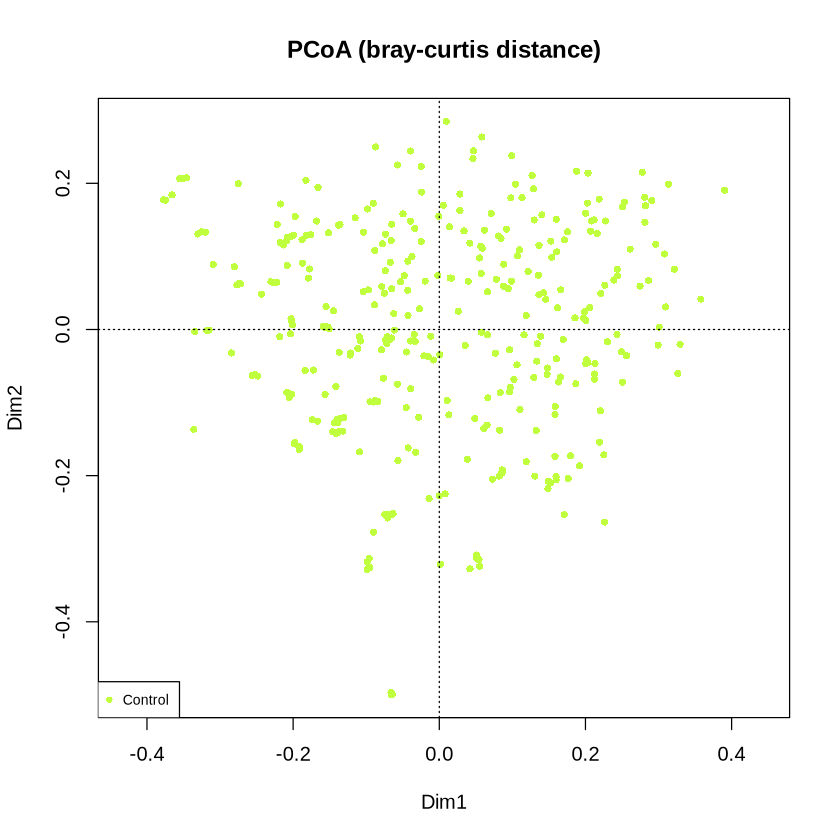

In [76]:
# PcoA plot coloured by health
#pdf(paste0(res_dir0, "/pcoa_abundance_col_by_health.pdf"), width = 9, height = 7 ) 
ordiplot(scores(mx_norm.b.pcoa, choices=c(1,2)), type="none", main="PCoA (bray-curtis distance)")
points(scores(mx_norm.b.pcoa, choices=c(1,2)), col = age2col[age_cats[rownames(scores(mx_norm.b.pcoa, choices=c(1,2)))]], pch=16, cex=0.8)
abline(h=0, lty=3)
abline(v=0, lty=3)
legend("bottomleft", legend=unique(age_cats), pch=16, col=age2col[unique(age_cats)],cex =0.7)
#ordiellipse(mx_norm.b.pcoa, groups = age_cats, conf = 0.95, col=age2col[unique(age_cats)])
#dev.off()

species scores not available



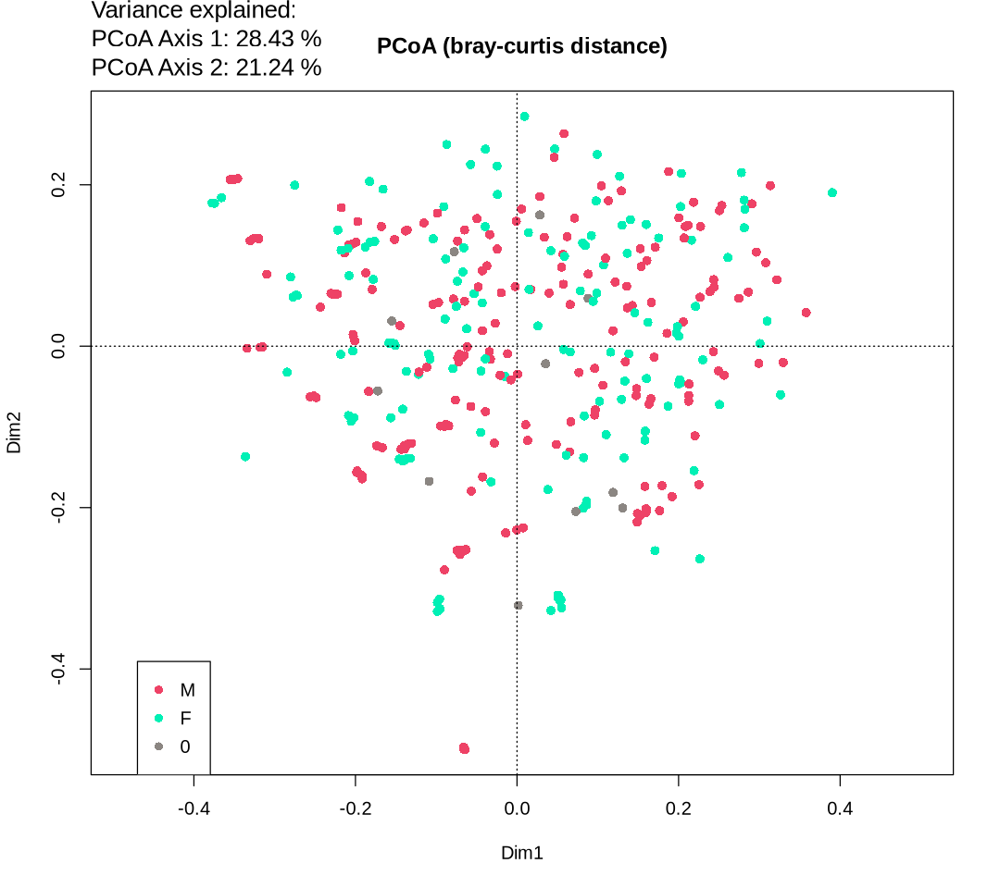

In [77]:
# PcoA plot coloured by sex
#pdf(paste0(res_dir0, "/pcoa_abundance_col_by_health.pdf"), width = 9, height = 7 ) 
options(repr.plot.width=9 , repr.plot.height= 8)
ordiplot(scores(mx_norm.b.pcoa, choices=c(1,2)), type="none", main="PCoA (bray-curtis distance)" , cex= 1.5 )
points(scores(mx_norm.b.pcoa, choices=c(1,2)), col = sex2col[sex_cats[rownames(scores(mx_norm.b.pcoa, choices=c(1,2)))]], pch=16, cex=1.1)
abline(h=0, lty=3)
abline(v=0, lty=3 )
legend("bottomleft", legend=unique(sex_cats), pch=16, col=sex2col[unique(sex_cats)] )
total_variance <- sum(mx_norm.b.pcoa$eig)
variance_explained <- (mx_norm.b.pcoa$eig / total_variance) * 100
mtext(paste("Variance explained:\nPCoA Axis 1:", round(variance_explained[1], 2), "%\nPCoA Axis 2:", round(variance_explained[2], 2), "%"), side = 3, line = 0.5, adj = 0, cex = 1.3)

#dev.off()

In [78]:
all_genera = rownames(mx_norm)
all_samples = as.data.frame(colnames(mx_norm))
names(all_samples) = c("sample")
all_samples_prob <- all_samples


In [59]:
str(all_samples)

'data.frame':	350 obs. of  1 variable:
 $ sample: chr  "ERR2764793" "ERR2764795" "ERR2764796" "ERR2764794" ...


In [79]:
head(all_samples)

,sample
,<chr>
1,ERR2764793
2,ERR2764795
3,ERR2764796
4,ERR2764794
5,ERR2764803
6,ERR2764801


In [61]:
str(all_genera)
head(all_genera)

 chr [1:279] "k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949" ...


[1] "k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949"          
[2] "k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter"
[3] "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum"           
[4] "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces"             
[5] "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea"             
[6] "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835"

In [80]:
# retrieve the sample names
outg <- str_split(as.character(all_genera),';') 

all_genera_df = as.data.frame(do.call(rbind, outg))
names(all_genera_df) = c("k","p","c","o","f","g")
all_genera_df$full = all_genera
all_genera_df = all_genera_df[,c("full","k","p","c","o","f","g")]

In [81]:
head(all_genera_df)

,full,k,p,c,o,f,g
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,k__Archaea,p__Euryarchaeota,c__Methanobacteria,o__Methanobacteriales,f__Methanobacteriaceae,g__GGB50949
2,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,k__Archaea,p__Euryarchaeota,c__Methanobacteria,o__Methanobacteriales,f__Methanobacteriaceae,g__Methanobrevibacter
3,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,k__Bacteria,p__Actinobacteria,c__Actinomycetia,o__Actinomycetales,f__Actinomycetaceae,g__Actinobaculum
4,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,k__Bacteria,p__Actinobacteria,c__Actinomycetia,o__Actinomycetales,f__Actinomycetaceae,g__Actinomyces
5,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,k__Bacteria,p__Actinobacteria,c__Actinomycetia,o__Actinomycetales,f__Actinomycetaceae,g__Fannyhessea
6,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,k__Bacteria,p__Actinobacteria,c__Actinomycetia,o__Actinomycetales,f__Actinomycetaceae,g__GGB9835


In [64]:
str(all_genera_df)

'data.frame':	279 obs. of  7 variables:
 $ full: chr  "k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949" "k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter" "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum" "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces" ...
 $ k   : chr  "k__Archaea" "k__Archaea" "k__Bacteria" "k__Bacteria" ...
 $ p   : chr  "p__Euryarchaeota" "p__Euryarchaeota" "p__Actinobacteria" "p__Actinobacteria" ...
 $ c   : chr  "c__Methanobacteria" "c__Methanobacteria" "c__Actinomycetia" "c__Actinomycetia" ...
 $ o   : chr  "o__Methanobacteriales" "o__Methanobacteriales" "o__Actinomycetales" "o__Actinomycetales" ...
 $ f   : chr  "f__Methanobacteriaceae" "f__Methanobacteriaceae" "f__Actinomycetaceae" "f__Actinomycetaceae" ...
 $ g   : chr  "g__GGB50949

In [133]:
# initialise the df with ES assignments of genera
df <- dplyr::select(all_genera_df, full, p ) #df <- all_genera_df[,c("full","p")]


In [134]:
str(df)
head(df)

'data.frame':	279 obs. of  2 variables:
 $ full: chr  "k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949" "k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter" "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum" "k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces" ...
 $ p   : chr  "p__Euryarchaeota" "p__Euryarchaeota" "p__Actinobacteria" "p__Actinobacteria" ...


,full,p
,<chr>,<chr>
1,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,p__Euryarchaeota
2,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,p__Euryarchaeota
3,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria
4,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,p__Actinobacteria
5,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,p__Actinobacteria
6,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,p__Actinobacteria


In [135]:
# initialise the df with probabilitity of ES assignments of genera
#df_prob <- dplyr::select(all_genera_df, full) #
df_prob <- all_genera_df[,c("full"), drop=FALSE]
head(df_prob)

,full
,<chr>
1,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949
2,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter
3,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum
4,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces
5,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea
6,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835


In [250]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

## make sure you have found the name of signatures at first. 

In [251]:
for (es_nb in ranks){

    # Get H and W matrices
    W = nmf_data[[as.character(es_nb)]][['W']]
    H = nmf_data[[as.character(es_nb)]][['H']]

    res_dir = paste0(res_dir0, "/", es_nb, "/")
    
    dir.create(file.path(res_dir), showWarnings = FALSE)
    dir.create(file.path(paste0(res_dir, "/compo")), showWarnings = FALSE)

    W_norm = W/rowSums(W) # W is n x r (n: measured features (bact) in row, r: signatures in columns)
    W_norm_byES = sweep(W,2,colSums(W),"/") # W is n x r (n: measured features (bact) in row, r: signatures in columns)
    W_norm[is.nan(W_norm)] <- 0
    H_norm = sweep(H,2,colSums(H),"/")
    

    rownames(W_norm_byES) <- lapply(rownames(W_norm_byES), shorten_genus, genera=rownames(W_norm_byES))

    # Identify the ES
           
    W_norm_byES_no0 <- W_norm_byES[rowSums(W_norm_byES) != 0, ]
    
    # Function to find indices of top n maximum values
        find_top_n_indices <- function(vec, n) {
          max_indices <- order(vec, decreasing = TRUE)
          return(max_indices[1:n])
            }

        # Apply the function to each column of W_norm_byES_no0
        max_indices <- apply(W_norm_byES_no0, 2, function(x) find_top_n_indices(x, 2))

        # Extract the row names corresponding to the maximum and second maximum values
        main_genera_by_es <- lapply(max_indices, function(indices) rownames(W_norm_byES_no0)[indices])

        # Create a data frame with maximum and second maximum values
        max_df <- data.frame(Maximum = rownames(W_norm_byES_no0)[max_indices[1,]],
                     Second_Maximum = rownames(W_norm_byES_no0)[max_indices[2,]])

        # Check for duplicate row names in the first column and replace them with values from the second column
            dup_row_names <- duplicated(max_df$Maximum)
            max_df$Maximum[dup_row_names] <- max_df$Second_Maximum[dup_row_names]

                main_genera_by_es <- max_df$Maximum

             shortened_main_genera = c()
            for (elem in main_genera_by_es){
                if (elem == "g__Streptococcus"){
                shortened_main_genera = c(shortened_main_genera, "g__Streptococcus")
                } else if(elem == "g__Prevotella"){
                shortened_main_genera = c(shortened_main_genera, "g__Prevotella")
                } else if(elem == "g__Neisseria"){
                shortened_main_genera = c(shortened_main_genera, "g__Neisseria")
                }else if(elem == "g__GGB10485"){
                shortened_main_genera = c(shortened_main_genera, "Enterococcaceae;g__GGB10485")
                }else{
                    shortened_main_genera = c(shortened_main_genera, substring(
                                gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", 
                                    elem, 
                                perl = TRUE),
                            1, 17))
                    }
                }
    es_names = paste0("SS_", shortened_main_genera)
 colnames(W_norm) = colnames(W) = colnames(W_norm_byES)= colnames(W_norm_byES_no0) = es_names
    rownames(H_norm) = rownames(H) = es_names
                # Export the H and W matrices
    write.table(H, file=paste0(res_dir, "H_trial", es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE)
    write.table(W, file=paste0(res_dir, "W_trial", es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE)
    # write.table(all_genera_df, file=paste0(res_dir0, "allgenera", es_nb , ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE)
        
    # plot the contents of each ES
    pdf(paste0(res_dir, es_nb, "contents_trial.pdf"), width = 25, height = 12)
    es_content(W, es2Col)
    dev.off()

                # summary of signatures contents
    sigPickup=0.01
    sigbact_mat = 100* W[rowSums(W >= sigPickup) > 0,]
    rownames(sigbact_mat) = gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", row.names(sigbact_mat), perl = TRUE)
    sigbact_mat = as.data.frame(sigbact_mat)
    library(data.table)
    setDT(sigbact_mat, keep.rownames = TRUE)[]
    # get a character for each sig stating its contents in bacteria
    sig_et_contents = list()
    for (sign in es_names) {
        # order by column matching this sign
        sigbact_mat = sigbact_mat[order(sigbact_mat[[sign]],decreasing = TRUE),]
        # select content: bact > 1% in sign
        signame = paste(sigbact_mat[sigbact_mat[[sign]]>1,]$rn, collapse = " - ") # not ordered by prevalence here
        sig_et_contents[[sign]] <- signame
        #sig_et_contents[[sign]] <- paste("<span style='font-size:20px;'>", signame, "</span>", sep = "")
    }
    capture.output(sig_et_contents, file = paste0(res_dir, es_nb,"_sig_contents_trial.txt"))


         # pie plots of the contents of each sig, leaving what is below 4% in "others"
    sigPickup=0.04 
    for (sig in es_names){
        compo = as.data.frame(W_norm_byES[, sig, drop=FALSE])
        compo$genus = rownames(compo)
        names(compo) = c("percentage", "genus")
        compo = compo[,c("genus","percentage")]
        compo = compo[compo$percentage >= sigPickup,]
        compo = compo[order(compo$percentage, decreasing = TRUE),]
        compo$genus_simp = unlist(lapply(compo$genus, shorten_genus, genera=compo$genus))
        compo <- rbind(compo, c("others", 1-sum(compo$percentage), "others"))
        compo$colors = g4_colours[unlist(compo$genus_simp)]
        all_genera_4pc = c(all_genera_4pc, compo$genus)
        write.table(compo, file=paste0(res_dir,"trialnorm_compo_", sig,"_" , es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE)

        
        p <- plot_ly(compo, labels = ~genus_simp, values = ~percentage, type = 'pie',textposition = 'outside',textinfo = 'label', sort = TRUE, marker = list(colors=~colors)) %>% #  textinfo = 'label+value'
        layout(xaxis = list(showgrid = FALSE, zeroline = FALSE, showticklabels = FALSE),
                yaxis = list(showgrid = FALSE, zeroline = FALSE, showticklabels = FALSE),
                showlegend = F) %>% #,
                #margin = list(b = 180, l = 50, r = 50, t = 10)) 
                add_trace(showlegend = FALSE)
        
        setwd(res_dir)
        #namefig = paste0(sig, "_es_", es_nb, "_compo.pdf")
        #orca(p, namefig, width=400, height=300)
        # Generate the file name
            namefig <- paste0(sig, "_es_", es_nb, "_compo_trial.html")

            # Save the plot as an HTML file
           htmlwidgets::saveWidget(p, file = namefig)
        
    } 

                sigPickup <- 0.04
            for (sig in es_names) {
    compo <- as.data.frame(W_norm_byES[, sig, drop = FALSE])
    compo$genus <- rownames(compo)
    names(compo) <- c("percentage", "genus")
    compo <- compo[, c("genus", "percentage")]
    compo <- compo[compo$percentage >= sigPickup, ]
    compo <- compo[order(compo$percentage, decreasing = TRUE), ]
    compo$genus_simp <- unlist(lapply(compo$genus, shorten_genus, genera = compo$genus))
    compo <- rbind(compo, c("others", 1 - sum(compo$percentage), "others"))
                compo$percentage <- as.numeric(compo$percentage)
    compo$percentage <- round(compo$percentage * 100, 2)  # Scale percentages to 100 and round to 2 decimal places
    compo$colors <- g4_colours[unlist(compo$genus_simp)]
    all_genera_4pc <- c(all_genera_4pc, compo$genus)
    write.table(compo, file = paste0(res_dir, "trialnorm_barplot_compo_", sig, "_", es_nb, ".tsv"), sep = "\t", row.names = TRUE, col.names = TRUE, quote = FALSE)
    
    p <- plot_ly(compo, x = ~genus_simp, y = ~percentage, type = 'bar', marker = list(color = ~colors)) %>%
        layout(xaxis = list(title = "Genus"), yaxis = list(title = "Percentage of genera in the signature (%)", range = c(0, 100), showlegend = FALSE , textfont = list(size = 20)))
    
    setwd(res_dir)
    namefig <- paste0(sig, "_es_", es_nb, "_compo_barplot.html")
    htmlwidgets::saveWidget(p, file = namefig)
}



                  # ES assignments of genera

    W_norm_no0 <- W_norm[rowSums(W_norm) != 0, ]
 
    assignments = as.data.frame(apply(W_norm_no0,1,function(x) which(x==max(x))))
# ES assignments of samples
    sample_assignments = as.data.frame(apply(H_norm,2,function(x) which(x==max(x)))) 
  
    names(assignments) = names(sample_assignments) = c("prediction")

    # associate the name of ES to the assignment
    assignments$prediction_nm = es_names[assignments$prediction]
    sample_assignments$prediction_nm = es_names[sample_assignments$prediction]                                         
   

      # add genus or sample as a column to the df
    assignments$genus <- rownames(assignments)
    sample_assignments$sample <- rownames(sample_assignments)                                        
                                             
    
    # retrieve assignment probability
    prob = as.data.frame(apply(W_norm_no0,1,max)) 
    sample_prob = as.data.frame(apply(H_norm,2,max)) 
    names(prob) =  names(sample_prob) = c("probability")
    prob$genus <- rownames(prob)
    sample_prob$sample <- rownames(sample_prob)
    print(es_nb)
    print(summary(prob))
    print(summary(sample_prob))


    assigned_sample_color = es2Col[sample_assignments$prediction_nm]
    names(assigned_sample_color) = sample_assignments$sample

    es_pointshape=c(0,1,17,3,4,18,6,8,13,9,2,10)
    names(es_pointshape) = all_es_names
    sample_shape = es_pointshape[sample_assignments$prediction_nm] 
    names(sample_shape) = sample_assignments$sample 
    write.table(assignments, file=paste0(res_dir, "assignments_trial", es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE) 
    write.table(sample_assignments, file=paste0(res_dir, "sample_assignments_trial", es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE) 
 
                                                 
        # PcoA plot -dim1- dim2
pdf(paste0(res_dir, es_nb, "pcoa_abundance_col_by_es_trial_dim1_dim2.pdf"), width = 10, height = 10 ) 

# Create the ordination plot
        ordiplot(scores(mx_norm.b.pcoa, choices=c(1,2)), type="none", main="PCoA (bray-curtis distance)")
points(scores(mx_norm.b.pcoa, choices=c(1,2)), col = assigned_sample_color[rownames(scores(mx_norm.b.pcoa, choices=c(1,2)))], pch=sample_shape, cex=0.7)
abline(h=0, lty=3)
abline(v=0, lty=3)
legend("topleft", legend=es_names, pch=es_pointshape[es_names], col=es2Col[es_names])

# Annotate plot with variance explained
total_variance <- sum(mx_norm.b.pcoa$eig)
variance_explained <- (mx_norm.b.pcoa$eig / total_variance) * 100
mtext(paste("Variance explained:\nPCoA Axis 1:", round(variance_explained[1], 2), "%\nPCoA Axis 2:", round(variance_explained[2], 2), "%"), side = 3, line = 0.5, adj = 0, cex = 0.8)

ordiellipse(mx_norm.b.pcoa, groups = sample_assignments$prediction_nm, conf = 0.95, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])

        # Add a pie chart in the margin
        par(fig= c(0.72,0.97,0.1,0.2), new=TRUE, mar=c(0,0,0,0))
        pie(summary(as.factor(sample_assignments$prediction_nm)), labels=NA, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])

        # Close the PDF device
dev.off()
             


                          
           # PcoA plot -dim1-dim3                                             
            # Set up the PDF output
 pdf(paste0(res_dir, es_nb, "pcoa_abundance_col_by_es_trial_dim1_dim3.pdf"), width = 10, height = 10 ) 

# Create the ordination plot
        ordiplot(scores(mx_norm.b.pcoa, choices=c(1,3)), type="none", main="PCoA (bray-curtis distance)")
points(scores(mx_norm.b.pcoa, choices=c(1,3)), col = assigned_sample_color[rownames(scores(mx_norm.b.pcoa, choices=c(1,3)))], pch=sample_shape, cex=0.7)
abline(h=0, lty=3)
abline(v=0, lty=3)
legend("topleft", legend=es_names, pch=es_pointshape[es_names], col=es2Col[es_names])

# Annotate plot with variance explained
total_variance <- sum(mx_norm.b.pcoa$eig)
variance_explained <- (mx_norm.b.pcoa$eig / total_variance) * 100
mtext(paste("Variance explained:\nPCoA Axis 1:", round(variance_explained[1], 2), "%\nPCoA Axis 3:", round(variance_explained[3], 2), "%"), side = 3, line = 0.5, adj = 0, cex = 0.8)

ordiellipse(mx_norm.b.pcoa, groups = sample_assignments$prediction_nm, conf = 0.95, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])

        # Add a pie chart in the margin
        par(fig= c(0.72,0.97,0.1,0.2), new=TRUE, mar=c(0,0,0,0))
        pie(summary(as.factor(sample_assignments$prediction_nm)), labels=NA, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])

        # Close the PDF device
dev.off()



    varname = paste0("x", es_nb)
    # add the ES assignment of genera to df + their proba in another df
    df[[varname]] <- assignments[match(df$full, assignments$genus), "prediction_nm"]
    df_prob[[varname]] <- prob[match(df$full, prob$genus), "probability"]
    # add the ES assignment of samples to df + their proba in another df
    all_samples[[varname]] <- sample_assignments[match(all_samples$sample, sample_assignments$sample), "prediction_nm"]
    all_samples_prob[[varname]] <- sample_prob[match(all_samples_prob$sample, sample_prob$sample), "probability"]

    write.table(all_samples_prob, file=paste0(res_dir, "allsampleprob", es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE) 

write.table(df, file=paste0(res_dir, "df_trial", es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE) 
write.table(df_prob, file=paste0(res_dir, "df_prob_trial", es_nb, ".tsv"), sep="\t", row.names=TRUE, col.names=TRUE, quote = FALSE) 

         

                            
 }   

       

1 1[1] 2
  probability        genus          
 Min.   :0.5008   Length:222        
 1st Qu.:0.7772   Class :character  
 Median :0.9687   Mode  :character  
 Mean   :0.8778                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.5006   Length:350        
 1st Qu.:0.6011   Class :character  
 Median :0.7488   Mode  :character  
 Mean   :0.7480                     
 3rd Qu.:0.8715                     
 Max.   :1.0000                     


species scores not available

species scores not available



1 1 1[1] 3
  probability        genus          
 Min.   :0.4426   Length:222        
 1st Qu.:0.7004   Class :character  
 Median :0.8916   Mode  :character  
 Mean   :0.8364                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.3605   Length:350        
 1st Qu.:0.4976   Class :character  
 Median :0.6048   Mode  :character  
 Mean   :0.6275                     
 3rd Qu.:0.7346                     
 Max.   :1.0000                     


species scores not available

species scores not available



1 1 1 1[1] 4
  probability        genus          
 Min.   :0.4141   Length:222        
 1st Qu.:0.6147   Class :character  
 Median :0.8447   Mode  :character  
 Mean   :0.7991                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.2756   Length:350        
 1st Qu.:0.4487   Class :character  
 Median :0.5440   Mode  :character  
 Mean   :0.5655                     
 3rd Qu.:0.6515                     
 Max.   :0.9990                     


species scores not available

species scores not available



1 1 1 1 1[1] 5
  probability        genus          
 Min.   :0.3506   Length:222        
 1st Qu.:0.5924   Class :character  
 Median :0.8066   Mode  :character  
 Mean   :0.7766                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.2479   Length:350        
 1st Qu.:0.3844   Class :character  
 Median :0.4670   Mode  :character  
 Mean   :0.4830                     
 3rd Qu.:0.5659                     
 Max.   :0.9717                     


species scores not available

species scores not available



1 1 1 1 1 1[1] 6
  probability        genus          
 Min.   :0.3337   Length:222        
 1st Qu.:0.5903   Class :character  
 Median :0.8009   Mode  :character  
 Mean   :0.7709                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.2225   Length:350        
 1st Qu.:0.3352   Class :character  
 Median :0.4032   Mode  :character  
 Mean   :0.4302                     
 3rd Qu.:0.4942                     
 Max.   :0.9665                     


species scores not available

species scores not available



1 1 1 1 1 1 1[1] 7
  probability        genus          
 Min.   :0.3549   Length:222        
 1st Qu.:0.5702   Class :character  
 Median :0.7595   Mode  :character  
 Mean   :0.7669                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.1966   Length:350        
 1st Qu.:0.3214   Class :character  
 Median :0.3811   Mode  :character  
 Mean   :0.4158                     
 3rd Qu.:0.4816                     
 Max.   :0.9485                     


species scores not available

species scores not available



1 1 1 1 1 1 1 1[1] 8
  probability        genus          
 Min.   :0.3052   Length:222        
 1st Qu.:0.5960   Class :character  
 Median :0.7780   Mode  :character  
 Mean   :0.7648                     
 3rd Qu.:0.9996                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.1917   Length:350        
 1st Qu.:0.2950   Class :character  
 Median :0.3458   Mode  :character  
 Mean   :0.3793                     
 3rd Qu.:0.4497                     
 Max.   :0.7497                     


species scores not available

species scores not available



1 1 1 1 1 1 1 1 1[1] 9
  probability        genus          
 Min.   :0.2463   Length:222        
 1st Qu.:0.5499   Class :character  
 Median :0.7774   Mode  :character  
 Mean   :0.7544                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.1934   Length:350        
 1st Qu.:0.2785   Class :character  
 Median :0.3285   Mode  :character  
 Mean   :0.3674                     
 3rd Qu.:0.4358                     
 Max.   :0.8565                     


species scores not available

species scores not available



1 1 1 1 1 1 1 1 1 1[1] 10
  probability        genus          
 Min.   :0.2219   Length:222        
 1st Qu.:0.5872   Class :character  
 Median :0.8290   Mode  :character  
 Mean   :0.7780                     
 3rd Qu.:1.0000                     
 Max.   :1.0000                     
  probability        sample         
 Min.   :0.1779   Length:350        
 1st Qu.:0.2753   Class :character  
 Median :0.3213   Mode  :character  
 Mean   :0.3559                     
 3rd Qu.:0.4121                     
 Max.   :0.8754                     


species scores not available

species scores not available



In [138]:
rownames(mx_norm) <- lapply(rownames(mx_norm), shorten_genus, genera=rownames(mx_norm))

# order the ES assignment of genera dataframe by phylum
df <- df[order(df$p),]

In [139]:
head(df)

,full,p,x2,x3,x4,x5,x6,x7,x8,x9,x10
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
3,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Rothia,SS_g__Prevotella,SS_g__Prevotella,SS_g__Gemella,SS_g__Alloprevotella
4,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,p__Actinobacteria,SS_g__Streptococcus,SS_g__Streptococcus,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Actinomyces
5,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,p__Actinobacteria,NA,NA,NA,NA,NA,NA,NA,NA,NA
6,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,p__Actinobacteria,SS_g__Prevotella,SS_g__Prevotella,SS_g__Prevotella,SS_g__Prevotella,SS_g__Prevotella,SS_g__Haemophilus,SS_g__Fusobacterium,SS_g__Haemophilus,SS_g__Alloprevotella
7,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Pauljensenia,p__Actinobacteria,SS_g__Prevotella,SS_g__Prevotella,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Actinomyces,SS_g__Prevotella,SS_g__Prevotella,SS_g__Gemella,SS_g__Alloprevotella
8,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Peptidiphaga,p__Actinobacteria,SS_g__Streptococcus,SS_g__Streptococcus,SS_g__Streptococcus,SS_g__Streptococcus,SS_g__Neisseria,SS_g__Neisseria,SS_g__Neisseria,SS_g__Gemella,SS_g__Alloprevotella


In [140]:
df_melt <- df %>%
  tidyr::pivot_longer(cols = c(x2,x3,x4,x5,x6,x7,x8,x9,x10), names_to = "variable", values_to = "value")                                              
#df_melt = reshape2::melt(data = df1, id.vars = c("p", "full"), measure.vars = c("x2", "x3", "x4", "x5", "x6"))
names(df_melt) = c("genus","phylum", "ES_number", "ES")

In [141]:
head(df_melt)

genus,phylum,ES_number,ES
<chr>,<chr>,<chr>,<chr>
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x2,SS_g__Streptococcus
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x3,SS_g__Prevotella
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x4,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x5,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x6,SS_g__Rothia
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x7,SS_g__Prevotella


In [142]:
na_count <- sum(is.na(df$x2))

In [143]:
na_count

[1] 57

In [144]:
head(df_prob)

,full,x2,x3,x4,x5,x6,x7,x8,x9,x10
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,NA,NA,NA,NA,NA,NA,NA,NA,NA
2,k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,NA,NA,NA,NA,NA,NA,NA,NA,NA
3,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.5164256,0.5313217,0.6846794,0.4616298,0.3403322,0.4975776,0.3972403,0.8243814,0.8485744
4,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.6137369,0.4448394,0.6829230,0.7306917,0.8044003,0.8205151,0.8040097,0.7493166,0.7776299
5,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,NA,NA,NA,NA,NA,NA,NA,NA,NA
6,k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.9977598,0.9999998,1.0000000,0.8828657,1.0000000,0.6524134,0.7476089,0.4843723,0.5253587


In [145]:
df_prob_melt <- df_prob %>%
  tidyr::pivot_longer(cols = c( x2,x3,x4,x5,x6,x7,x8,x9,x10), names_to = "variable", values_to = "value")

names(df_prob_melt) = c("name", "ES_number", "prob")
df_prob_melt$type = "genera"

In [146]:
head(df_prob_melt,10)

name,ES_number,prob,type
<chr>,<chr>,<dbl>,<chr>
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x2,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x3,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x4,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x5,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x6,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x7,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x8,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x9,NA,genera
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,x10,NA,genera


In [147]:
all_samples_prob_melt <- all_samples_prob %>%
  tidyr::pivot_longer(cols = c( x2,x3,x4,x5,x6,x7,x8,x9,x10), names_to = "variable", values_to = "value")                                              
#all_samples_prob_melt = reshape2::melt(data = all_samples_prob, id.vars = c("sample"), measure.vars = c("x2", "x3", "x4", "x5", "x6"))
names(all_samples_prob_melt) = c("name", "ES_number", "prob")
all_samples_prob_melt$type = "samples"

In [148]:
head(all_samples_prob_melt)

name,ES_number,prob,type
<chr>,<chr>,<dbl>,<chr>
ERR2764793,x2,0.7043438,samples
ERR2764793,x3,0.6672127,samples
ERR2764793,x4,0.7344168,samples
ERR2764793,x5,0.5482894,samples
ERR2764793,x6,0.5140306,samples
ERR2764793,x7,0.4643250,samples


In [149]:
# merge the probability dataframes for genera and samples, "type" distinguish them
all_melt_prob = rbind(all_samples_prob_melt, df_prob_melt)
all_melt_prob$ES_number = gsub("^x", "", all_melt_prob$ES_number)
all_melt_prob$ES_number = factor(all_melt_prob$ES_number, levels = as.character(2:10))


In [150]:
head(all_melt_prob)
tail(all_melt_prob)

name,ES_number,prob,type
<chr>,<fct>,<dbl>,<chr>
ERR2764793,2,0.7043438,samples
ERR2764793,3,0.6672127,samples
ERR2764793,4,0.7344168,samples
ERR2764793,5,0.5482894,samples
ERR2764793,6,0.5140306,samples
ERR2764793,7,0.4643250,samples


name,ES_number,prob,type
<chr>,<fct>,<dbl>,<chr>
k__Eukaryota;p__Basidiomycota;c__Malasseziomycetes;o__Malasseziales;f__Malasseziaceae;g__Malassezia,5,NA,genera
k__Eukaryota;p__Basidiomycota;c__Malasseziomycetes;o__Malasseziales;f__Malasseziaceae;g__Malassezia,6,NA,genera
k__Eukaryota;p__Basidiomycota;c__Malasseziomycetes;o__Malasseziales;f__Malasseziaceae;g__Malassezia,7,NA,genera
k__Eukaryota;p__Basidiomycota;c__Malasseziomycetes;o__Malasseziales;f__Malasseziaceae;g__Malassezia,8,NA,genera
k__Eukaryota;p__Basidiomycota;c__Malasseziomycetes;o__Malasseziales;f__Malasseziaceae;g__Malassezia,9,NA,genera
k__Eukaryota;p__Basidiomycota;c__Malasseziomycetes;o__Malasseziales;f__Malasseziaceae;g__Malassezia,10,NA,genera


In [151]:
dim(all_melt_prob)

[1] 5661    4

In [152]:
head(df_melt)

genus,phylum,ES_number,ES
<chr>,<chr>,<chr>,<chr>
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x2,SS_g__Streptococcus
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x3,SS_g__Prevotella
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x4,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x5,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x6,SS_g__Rothia
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,x7,SS_g__Prevotella


In [153]:
# remove the x prefix to the number of ES
df_melt$ES_number = gsub("^x", "", df_melt$ES_number)
df_melt$ES_number = factor(df_melt$ES_number, levels = as.character(2:10))

In [154]:
head(df_melt)
dim(df_melt)
tail(df_melt)

genus,phylum,ES_number,ES
<chr>,<chr>,<fct>,<chr>
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,2,SS_g__Streptococcus
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,3,SS_g__Prevotella
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,4,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,5,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,6,SS_g__Rothia
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,7,SS_g__Prevotella


[1] 2511    4

genus,phylum,ES_number,ES
<chr>,<chr>,<fct>,<chr>
k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__Mycoplasma,p__Tenericutes,5,SS_g__Prevotella
k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__Mycoplasma,p__Tenericutes,6,SS_g__Prevotella
k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__Mycoplasma,p__Tenericutes,7,SS_g__Haemophilus
k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__Mycoplasma,p__Tenericutes,8,SS_g__Fusobacterium
k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__Mycoplasma,p__Tenericutes,9,SS_g__Gemella
k__Bacteria;p__Tenericutes;c__Mollicutes;o__Mycoplasmatales;f__Mycoplasmataceae;g__Mycoplasma,p__Tenericutes,10,SS_g__Alloprevotella


In [155]:
options(repr.plot.width=20 , repr.plot.height= 12)

In [156]:
# plot the probabilities
m = ggplot(data=all_melt_prob, aes(x = type, y = prob, fill = type), show.legend = FALSE) +
        geom_boxplot() + #width=0.1, alpha=0.4
        facet_grid(~ ES_number, labeller = label_wrap_gen(width=10),  switch="both") +
        labs(y= "Probability of assignment", x="Number of saliva_signatures", fill="Type of SS assignment") +
        theme_classic() +
        theme(panel.grid = element_blank(),
            axis.text.x = element_blank(), #element_text(angle = 45, hjust = 1),
            # legend.position = "none",
            panel.border = element_rect(colour = "black", fill=NA),
            axis.text=element_text(size=15),
            axis.ticks.x = element_blank(),
            legend.text=element_text(size=12),
            legend.title=element_text(size=12),
            axis.title=element_text(size=15),
            strip.text.x=element_text(size=15)
            )

        

Warning message:
“Removed 513 rows containing non-finite outside the scale range (`stat_boxplot()`).”


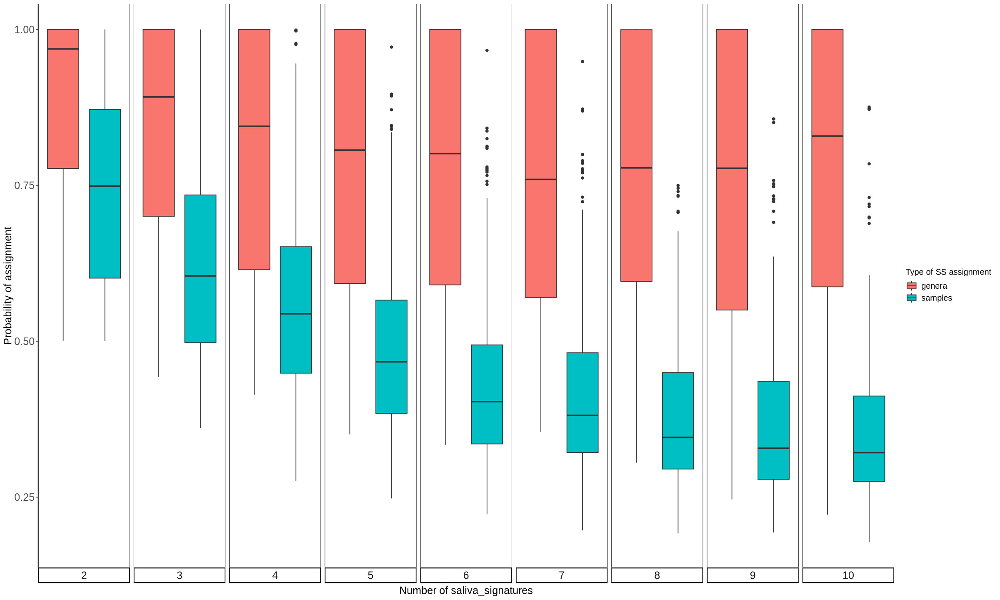

In [157]:
m

In [158]:
head(df_melt)

genus,phylum,ES_number,ES
<chr>,<chr>,<fct>,<chr>
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,2,SS_g__Streptococcus
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,3,SS_g__Prevotella
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,4,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,5,SS_g__Actinomyces
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,6,SS_g__Rothia
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,p__Actinobacteria,7,SS_g__Prevotella


In [159]:
# plot the change in ES assignment for genera depending on ES number


library(ggplot2)
library(ggforce)

p=ggplot(df_melt,
       aes(x = as.factor(ES_number), stratum = ES, alluvium = genus,
           fill = as.factor(ES), label = ES)) +
  geom_flow(stat = "alluvium", lode.guidance = "frontback") +
  geom_stratum(width = 1/5, discern = TRUE) +
  scale_fill_manual(values = es2Col) +
  ggtitle("Evolution of genus association to ES",
          "with the chosen number of ES") +
  theme_minimal() +
  theme(panel.grid = element_blank(),
        axis.line = element_blank(),
        legend.position = "bottom",
        panel.border = element_rect(colour = "black", fill = NA),
        axis.text = element_text(size = 15),
        legend.text = element_text(size = 12),
        legend.title = element_text(size = 12),
        axis.title = element_text(size = 15),
        strip.text.x = element_text(size = 15))


Warning message in setup_data(...):
“Data is already in lodes format, so `discern` will be ignored.”


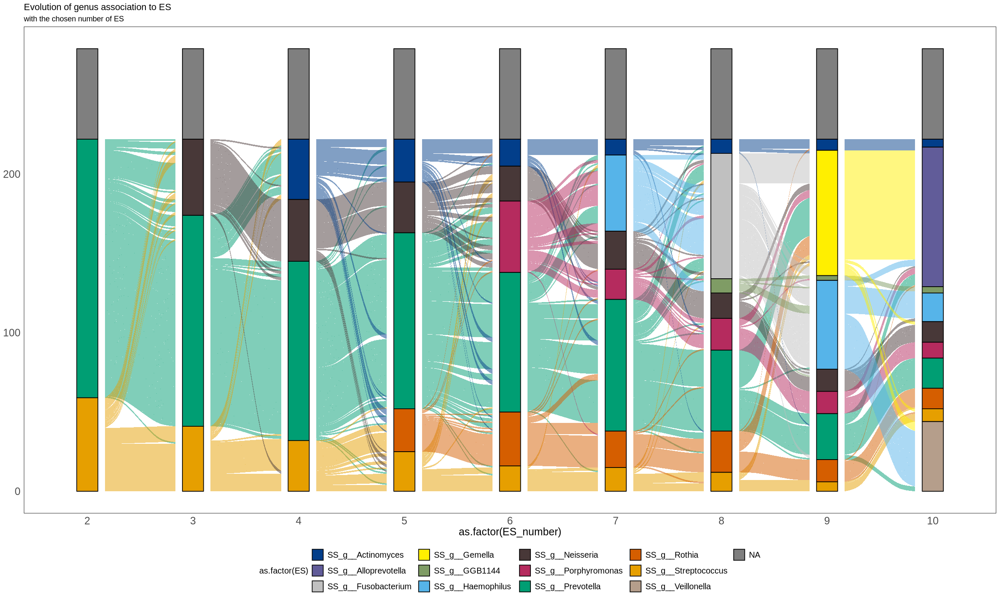

In [160]:
p

In [161]:
sum(is.na(df_melt$ES))
sum(is.na(df_melt$ES_number))
sum(is.na(df_melt$genus))
sum(is.na(df_melt$phylum))

[1] 513

[1] 0

[1] 0

[1] 0

Warning message in setup_data(...):
“Data is already in lodes format, so `discern` will be ignored.”


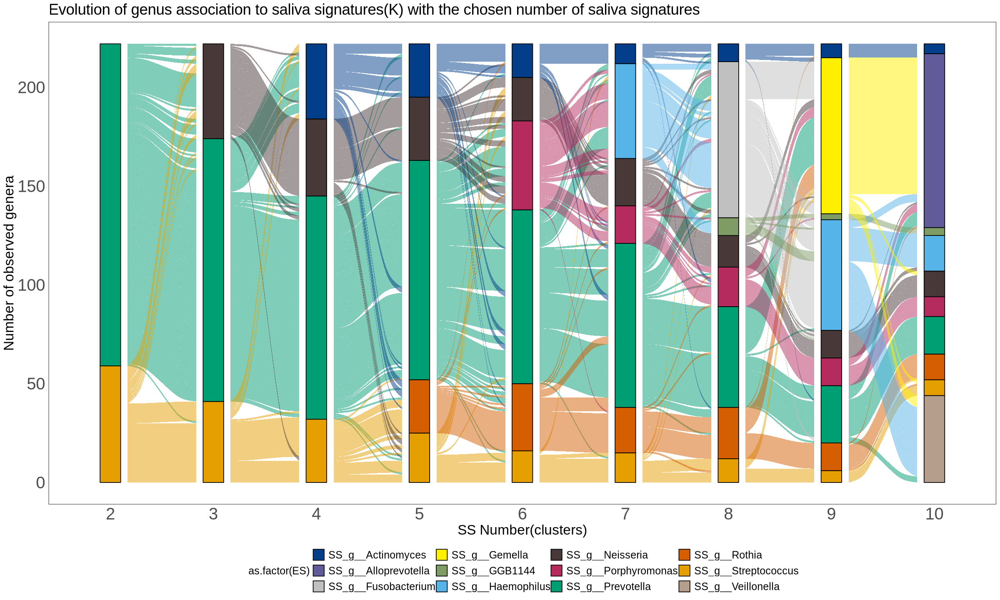

In [163]:


# Filter out rows with NA values
df_filtered <- df_melt %>% filter(!is.na(ES))

# Create the plot with the filtered dataframe
p1 <- ggplot(df_filtered,
       aes(x = as.factor(ES_number), stratum = ES, alluvium = genus,
           fill = as.factor(ES), label = ES)) +
  geom_flow(stat = "alluvium", lode.guidance = "frontback") +
  geom_stratum(width = 1/5, discern = TRUE) +
  scale_fill_manual(values = es2Col) +
  ggtitle("Evolution of genus association to saliva signatures(K) with the chosen number of saliva signatures") +
labs(x = "SS Number(clusters)", y = "Number of observed genera") +
  theme_minimal() +
  theme(panel.grid = element_blank(),
        axis.line = element_blank(),
        legend.position = "bottom",
        panel.border = element_rect(colour = "black", fill = NA),
        axis.text = element_text(size = 24),  # Increase text size for axis
        legend.text = element_text(size = 15),  # Increase text size for legend
        legend.title = element_text(size = 15),  # Increase text size for legend title
        axis.title = element_text(size = 20),  # Increase text size for axis title
        strip.text.x = element_text(size = 20),  # Increase text size for x-axis strip
        plot.title = element_text(size = 22))  # Increase text size for plot title

# Print the plot
print(p1)


In [ ]:
getwd()

In [ ]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

In [ ]:
pdf(paste0(res_dir0, "/probability_of_ES_all_10k.pdf"), width = 20, height = 14)
m
dev.off()

In [ ]:
pdf(paste0(res_dir0, "/alluvial_ES_genera_trial_10k_NONA.pdf"), width = 20, height = 14)
p1
dev.off()

In [ ]:
# plot the probabilities
m = ggplot(data=all_melt_prob, aes(x = type, y = prob, fill = type), show.legend = FALSE) +
        geom_boxplot() + #width=0.1, alpha=0.4
        facet_grid(~ ES_number, labeller = label_wrap_gen(width=10),  switch="both") +
        labs(y= "Probability of assignment", x="Number of enterosignatures", fill="Type of ES assignment") +
        theme_classic() +
        theme(panel.grid = element_blank(),
            axis.text.x = element_blank(), #element_text(angle = 45, hjust = 1),
            # legend.position = "none",
            panel.border = element_rect(colour = "black", fill=NA),
            axis.text=element_text(size=15),
            axis.ticks.x = element_blank(),
            legend.text=element_text(size=12),
            legend.title=element_text(size=12),
            axis.title=element_text(size=15),
            strip.text.x=element_text(size=15)
            )

pdf_file_1 = paste0(res_dir0, "/probability_assignment_genera_samples.pdf")                                      
   pdf(pdf_file_1, width = 9, height = 7 ) 
    m
dev.off()

# Finding the name of signatures 
## run the "Functions" and "read input files" at first
## then with this step you can find the name of signatures before "ANALYSIS"  

In [164]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/10"

In [292]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

In [453]:
es_nb = 6
 


In [294]:
 # Get H and W matrices
    W = nmf_data[[as.character(es_nb)]][['W']]
    H = nmf_data[[as.character(es_nb)]][['H']]


In [295]:
head(W)
head(H)

,V1,V2,V3,V4,V5,V6
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,0.0000000000,0.000000000,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,0.0000000000,0.000000000,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.0008419212,0.006402680,0.005053788,7.035763e-03,9.974770e-03,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.1817434622,0.092222686,0.146778541,1.730332e+00,2.451473e-09,6.663451e-06
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,0.0000000000,0.000000000,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.0000000000,0.004167554,0.000000000,3.107907e-13,0.000000e+00,0.000000e+00


ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
6.262844e-02,0.0685218435,0.0693731900,0.0703123317,0.085529233,0.084349225,0.089841942,3.591154e-02,3.387526e-02,3.702631e-02,⋯,0.086116409,1.008377e-01,4.784551e-02,0.055519945,0.034922550,5.228788e-02,1.358714e-02,0.044761708,6.601179e-02,1.392740e-01
1.154117e-01,0.1154595384,0.1140583051,0.1136243794,0.095440672,0.096484456,0.091904634,1.455823e-01,1.468679e-01,1.439759e-01,⋯,0.003960199,4.703179e-58,9.589067e-02,0.089694246,0.008637733,4.177668e-02,6.068642e-02,0.068543897,6.360026e-02,7.371645e-176
1.788755e-02,0.0155935464,0.0155928218,0.0156592555,0.007766294,0.007923645,0.006956252,3.502706e-03,3.561537e-03,3.663995e-03,⋯,0.089581283,8.683717e-02,1.716172e-19,0.003764807,0.183598648,8.417279e-02,1.359755e-126,0.006420323,5.958699e-02,6.822280e-02
1.436998e-02,0.0073569249,0.0081900722,0.0071463368,0.009597135,0.009333654,0.009785790,1.264278e-02,1.349198e-02,1.316852e-02,⋯,0.058279417,1.402186e-02,5.249717e-02,0.047227876,0.038673363,6.495226e-02,3.003575e-02,0.090376490,1.634921e-02,1.241982e-02
2.058829e-12,0.0001495624,0.0002775317,0.0003486867,0.002183425,0.001735186,0.002268379,3.785848e-68,4.830251e-75,8.564590e-74,⋯,0.015520708,1.068184e-02,1.002930e-02,0.045635009,0.014660876,2.371671e-02,1.789129e-01,0.042155386,5.994376e-47,1.512244e-22
1.422535e-02,0.0147128905,0.0147251803,0.0149171132,0.026049578,0.026703799,0.025870073,2.378580e-02,2.386626e-02,2.399493e-02,⋯,0.019470101,5.702421e-02,4.014607e-02,0.002837369,0.004979358,1.118794e-59,2.812610e-119,0.010607215,4.527746e-02,3.140930e-02


In [296]:
 W_norm = W/rowSums(W) # W is n x r (n: measured features (bact) in row, r: signatures in columns)
    W_norm_byES = sweep(W,2,colSums(W),"/") # W is n x r (n: measured features (bact) in row, r: signatures in columns)
    W_norm[is.nan(W_norm)] <- 0
    H_norm = sweep(H,2,colSums(H),"/")
    

   

In [297]:
head(W_norm)
head(H_norm)

,V1,V2,V3,V4,V5,V6
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.02872577,0.21845499,0.1724317,2.400553e-01,3.403322e-01,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.08448926,0.04287267,0.0682347,8.044003e-01,1.139646e-09,3.097719e-06
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.00000000,1.00000000,0.0000000,7.457388e-11,0.000000e+00,0.000000e+00


ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
2.789399e-01,0.3089432038,0.312186549,0.316710654,0.377501947,0.372353500,0.39643076,1.621837e-01,1.528233e-01,1.669132e-01,⋯,0.31552780,3.743008e-01,1.941713e-01,0.22690909,0.12233244,1.959035e-01,4.797342e-02,0.17028400,2.631779e-01,5.541569e-01
5.140306e-01,0.5205703447,0.513274201,0.511802847,0.421248245,0.425923591,0.40553247,6.574787e-01,6.625730e-01,6.490381e-01,⋯,0.01451004,1.745780e-57,3.891529e-01,0.36657888,0.03025767,1.565219e-01,2.142714e-01,0.26075701,2.535636e-01,2.933101e-175
7.966910e-02,0.0703063423,0.070169315,0.070534612,0.034278235,0.034978351,0.03069471,1.581892e-02,1.606736e-02,1.651716e-02,⋯,0.32822299,3.223322e-01,6.964736e-19,0.01538670,0.64313946,3.153645e-01,4.801017e-126,0.02442441,2.375633e-01,2.714515e-01
6.400226e-02,0.0331700350,0.036856174,0.032189531,0.042359050,0.041202734,0.04318015,5.709731e-02,6.086710e-02,5.936319e-02,⋯,0.21353394,5.204794e-02,2.130492e-01,0.19301954,0.13547140,2.433523e-01,1.060501e-01,0.34381330,6.518154e-02,4.941720e-02
9.169788e-12,0.0006743294,0.001248921,0.001570604,0.009637022,0.007659854,0.01000930,1.709764e-67,2.179098e-74,3.860885e-73,⋯,0.05686738,3.965006e-02,4.070191e-02,0.18650952,0.05135652,8.885781e-02,6.317051e-01,0.16036894,2.389857e-46,6.017063e-22
6.335808e-02,0.0663357449,0.066264839,0.067191751,0.114975500,0.117881970,0.11415262,1.074214e-01,1.076692e-01,1.081683e-01,⋯,0.07133783,2.116690e-01,1.629247e-01,0.01159628,0.01744251,4.191712e-59,9.930753e-119,0.04035233,1.805136e-01,1.249744e-01


In [298]:
 rownames(W_norm_byES) <- lapply(rownames(W_norm_byES), shorten_genus, genera=rownames(W_norm_byES))

   

In [299]:
head(W_norm_byES)

,V1,V2,V3,V4,V5,V6
g__GGB50949,0.0000000000,0.0000000000,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00
g__Methanobrevibacter,0.0000000000,0.0000000000,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00
g__Actinobaculum,0.0001836402,0.0013048324,0.001497536,2.302079e-03,3.253899e-03,0.000000e+00
g__Actinomyces,0.0396419569,0.0187944954,0.043493358,5.661590e-01,7.997023e-10,2.250243e-06
g__Fannyhessea,0.0000000000,0.0000000000,0.000000000,0.000000e+00,0.000000e+00,0.000000e+00
g__GGB9835,0.0000000000,0.0008493254,0.000000000,1.016897e-13,0.000000e+00,0.000000e+00


In [300]:
W_norm_byES_no0 <- W_norm_byES[rowSums(W_norm_byES) != 0, ]
head(W_norm_byES_no0)
dim(W_norm_byES_no0)

,V1,V2,V3,V4,V5,V6
g__Actinobaculum,0.0001836402,0.0013048324,1.497536e-03,2.302079e-03,3.253899e-03,0.000000e+00
g__Actinomyces,0.0396419569,0.0187944954,4.349336e-02,5.661590e-01,7.997023e-10,2.250243e-06
g__GGB9835,0.0000000000,0.0008493254,0.000000e+00,1.016897e-13,0.000000e+00,0.000000e+00
g__Pauljensenia,0.0006285408,0.0009883835,0.000000e+00,2.251708e-03,5.528084e-04,0.000000e+00
g__Peptidiphaga,0.0003446604,0.0000000000,1.494138e-03,9.047131e-04,6.191340e-04,0.000000e+00
g__Schaalia,0.0034859425,0.0019348315,1.453127e-09,2.335793e-03,0.000000e+00,7.966415e-03


[1] 222   6

In [301]:
 # Identify the ES
           
    W_norm_byES_no0 <- W_norm_byES[rowSums(W_norm_byES) != 0, ]
    
    # Function to find indices of top n maximum values
        find_top_n_indices <- function(vec, n) {
          max_indices <- order(vec, decreasing = TRUE)
          return(max_indices[1:n])
            }

       

In [302]:
 # Apply the function to each column of W_norm_byES_no0
        max_indices <- apply(W_norm_byES_no0, 2, function(x) find_top_n_indices(x, 2))
head(max_indices)
        # Extract the row names corresponding to the maximum and second maximum values
        main_genera_by_es <- lapply(max_indices, function(indices) rownames(W_norm_byES_no0)[indices])
main_genera_by_es
       

V1,V2,V3,V4,V5,V6
106,43,181,2,16,36
157,157,16,16,106,181


[[1]]
[1] "g__Streptococcus"

[[2]]
[1] "g__Veillonella"

[[3]]
[1] "g__Prevotella"

[[4]]
[1] "g__Veillonella"

[[5]]
[1] "g__Neisseria"

[[6]]
[1] "g__Rothia"

[[7]]
[1] "g__Actinomyces"

[[8]]
[1] "g__Rothia"

[[9]]
[1] "g__Rothia"

[[10]]
[1] "g__Streptococcus"

[[11]]
[1] "g__Porphyromonas"

[[12]]
[1] "g__Neisseria"

In [303]:
 # Create a data frame with maximum and second maximum values
        max_df <- data.frame(Maximum = rownames(W_norm_byES_no0)[max_indices[1,]],
                     Second_Maximum = rownames(W_norm_byES_no0)[max_indices[2,]])

        

In [304]:
head(max_df,10)

,Maximum,Second_Maximum
,<chr>,<chr>
1,g__Streptococcus,g__Veillonella
2,g__Prevotella,g__Veillonella
3,g__Neisseria,g__Rothia
4,g__Actinomyces,g__Rothia
5,g__Rothia,g__Streptococcus
6,g__Porphyromonas,g__Neisseria


In [305]:
# Check for duplicate row names in the first column and replace them with values from the second column
            dup_row_names <- duplicated(max_df$Maximum)
            max_df$Maximum[dup_row_names] <- max_df$Second_Maximum[dup_row_names]

                head(max_df,10)

,Maximum,Second_Maximum
,<chr>,<chr>
1,g__Streptococcus,g__Veillonella
2,g__Prevotella,g__Veillonella
3,g__Neisseria,g__Rothia
4,g__Actinomyces,g__Rothia
5,g__Rothia,g__Streptococcus
6,g__Porphyromonas,g__Neisseria


In [306]:
main_genera_by_es <- max_df$Maximum


In [307]:
main_genera_by_es

[1] "g__Streptococcus" "g__Prevotella"    "g__Neisseria"     "g__Actinomyces"  
[5] "g__Rothia"        "g__Porphyromonas"

In [308]:
 
    shortened_main_genera = c()
    for (elem in main_genera_by_es){
        if (elem == "g__Streptococcus"){
            shortened_main_genera = c(shortened_main_genera, "g__Streptococcus")
        } else if(elem == "g__Prevotella"){
            shortened_main_genera = c(shortened_main_genera, "g__Prevotella")
        } else if(elem == "g__Neisseria"){
            shortened_main_genera = c(shortened_main_genera, "g__Neisseria")
        }else{
            shortened_main_genera = c(shortened_main_genera, substring(
                                gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", 
                                    elem, 
                                perl = TRUE),
                            1, 17))
        }
    }
    es_names = paste0("SS_", shortened_main_genera)


In [309]:
es_names

[1] "SS_g__Streptococcus" "SS_g__Prevotella"    "SS_g__Neisseria"    
[4] "SS_g__Actinomyces"   "SS_g__Rothia"        "SS_g__Porphyromonas"

In [310]:

    colnames(W_norm) = colnames(W) = colnames(W_norm_byES)= colnames(W_norm_byES_no0) = es_names
    rownames(H_norm) = rownames(H) = es_names

In [311]:
head(W_norm)

,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.02872577,0.21845499,0.1724317,2.400553e-01,3.403322e-01,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.08448926,0.04287267,0.0682347,8.044003e-01,1.139646e-09,3.097719e-06
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.00000000,1.00000000,0.0000000,7.457388e-11,0.000000e+00,0.000000e+00


In [312]:
head(H_norm)

,ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
SS_g__Streptococcus,2.789399e-01,0.3089432038,0.312186549,0.316710654,0.377501947,0.372353500,0.39643076,1.621837e-01,1.528233e-01,1.669132e-01,⋯,0.31552780,3.743008e-01,1.941713e-01,0.22690909,0.12233244,1.959035e-01,4.797342e-02,0.17028400,2.631779e-01,5.541569e-01
SS_g__Prevotella,5.140306e-01,0.5205703447,0.513274201,0.511802847,0.421248245,0.425923591,0.40553247,6.574787e-01,6.625730e-01,6.490381e-01,⋯,0.01451004,1.745780e-57,3.891529e-01,0.36657888,0.03025767,1.565219e-01,2.142714e-01,0.26075701,2.535636e-01,2.933101e-175
SS_g__Neisseria,7.966910e-02,0.0703063423,0.070169315,0.070534612,0.034278235,0.034978351,0.03069471,1.581892e-02,1.606736e-02,1.651716e-02,⋯,0.32822299,3.223322e-01,6.964736e-19,0.01538670,0.64313946,3.153645e-01,4.801017e-126,0.02442441,2.375633e-01,2.714515e-01
SS_g__Actinomyces,6.400226e-02,0.0331700350,0.036856174,0.032189531,0.042359050,0.041202734,0.04318015,5.709731e-02,6.086710e-02,5.936319e-02,⋯,0.21353394,5.204794e-02,2.130492e-01,0.19301954,0.13547140,2.433523e-01,1.060501e-01,0.34381330,6.518154e-02,4.941720e-02
SS_g__Rothia,9.169788e-12,0.0006743294,0.001248921,0.001570604,0.009637022,0.007659854,0.01000930,1.709764e-67,2.179098e-74,3.860885e-73,⋯,0.05686738,3.965006e-02,4.070191e-02,0.18650952,0.05135652,8.885781e-02,6.317051e-01,0.16036894,2.389857e-46,6.017063e-22
SS_g__Porphyromonas,6.335808e-02,0.0663357449,0.066264839,0.067191751,0.114975500,0.117881970,0.11415262,1.074214e-01,1.076692e-01,1.081683e-01,⋯,0.07133783,2.116690e-01,1.629247e-01,0.01159628,0.01744251,4.191712e-59,9.930753e-119,0.04035233,1.805136e-01,1.249744e-01


## stackbar for the proportion of signatures (optimal k)

In [313]:
h_df <- as.data.frame(H_norm)
head(h_df)

,ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SS_g__Streptococcus,2.789399e-01,0.3089432038,0.312186549,0.316710654,0.377501947,0.372353500,0.39643076,1.621837e-01,1.528233e-01,1.669132e-01,⋯,0.31552780,3.743008e-01,1.941713e-01,0.22690909,0.12233244,1.959035e-01,4.797342e-02,0.17028400,2.631779e-01,5.541569e-01
SS_g__Prevotella,5.140306e-01,0.5205703447,0.513274201,0.511802847,0.421248245,0.425923591,0.40553247,6.574787e-01,6.625730e-01,6.490381e-01,⋯,0.01451004,1.745780e-57,3.891529e-01,0.36657888,0.03025767,1.565219e-01,2.142714e-01,0.26075701,2.535636e-01,2.933101e-175
SS_g__Neisseria,7.966910e-02,0.0703063423,0.070169315,0.070534612,0.034278235,0.034978351,0.03069471,1.581892e-02,1.606736e-02,1.651716e-02,⋯,0.32822299,3.223322e-01,6.964736e-19,0.01538670,0.64313946,3.153645e-01,4.801017e-126,0.02442441,2.375633e-01,2.714515e-01
SS_g__Actinomyces,6.400226e-02,0.0331700350,0.036856174,0.032189531,0.042359050,0.041202734,0.04318015,5.709731e-02,6.086710e-02,5.936319e-02,⋯,0.21353394,5.204794e-02,2.130492e-01,0.19301954,0.13547140,2.433523e-01,1.060501e-01,0.34381330,6.518154e-02,4.941720e-02
SS_g__Rothia,9.169788e-12,0.0006743294,0.001248921,0.001570604,0.009637022,0.007659854,0.01000930,1.709764e-67,2.179098e-74,3.860885e-73,⋯,0.05686738,3.965006e-02,4.070191e-02,0.18650952,0.05135652,8.885781e-02,6.317051e-01,0.16036894,2.389857e-46,6.017063e-22
SS_g__Porphyromonas,6.335808e-02,0.0663357449,0.066264839,0.067191751,0.114975500,0.117881970,0.11415262,1.074214e-01,1.076692e-01,1.081683e-01,⋯,0.07133783,2.116690e-01,1.629247e-01,0.01159628,0.01744251,4.191712e-59,9.930753e-119,0.04035233,1.805136e-01,1.249744e-01


In [314]:
summary(colSums(h_df))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      1       1       1       1       1       1 

In [315]:
# library(data.table) 
#transpose data frame
h_t <- transpose(h_df)

#rename row and column names
rownames(h_t) <- colnames(h_df)
colnames(h_t) <- rownames(h_df)
head(h_t)

,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR2764793,0.2789399,0.5140306,0.07966910,0.06400226,9.169788e-12,0.06335808
ERR2764795,0.3089432,0.5205703,0.07030634,0.03317003,6.743294e-04,0.06633574
ERR2764796,0.3121865,0.5132742,0.07016931,0.03685617,1.248921e-03,0.06626484
ERR2764794,0.3167107,0.5118028,0.07053461,0.03218953,1.570604e-03,0.06719175
ERR2764803,0.3775019,0.4212482,0.03427824,0.04235905,9.637022e-03,0.11497550
ERR2764801,0.3723535,0.4259236,0.03497835,0.04120273,7.659854e-03,0.11788197


In [316]:
df_flip <- tibble::rownames_to_column(h_t, "Samples")
head(df_flip)

,Samples,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ERR2764793,0.2789399,0.5140306,0.07966910,0.06400226,9.169788e-12,0.06335808
2,ERR2764795,0.3089432,0.5205703,0.07030634,0.03317003,6.743294e-04,0.06633574
3,ERR2764796,0.3121865,0.5132742,0.07016931,0.03685617,1.248921e-03,0.06626484
4,ERR2764794,0.3167107,0.5118028,0.07053461,0.03218953,1.570604e-03,0.06719175
5,ERR2764803,0.3775019,0.4212482,0.03427824,0.04235905,9.637022e-03,0.11497550
6,ERR2764801,0.3723535,0.4259236,0.03497835,0.04120273,7.659854e-03,0.11788197


In [317]:
df_x <- df_flip %>%
  mutate(group = case_when(
    startsWith(Samples, "ERR276") ~ "PRJEB28422",
    startsWith(Samples, "SRR2176") ~ "PRJNA883997",
    startsWith(Samples, "ERR1474") ~ "PRJEB14383",
    startsWith(Samples, "SRR14122") ~ "PRJNA717815",
    startsWith(Samples, "SRR19117") ~ "PRJNA832909",
      startsWith(Samples, "SRR2351") ~ "PRJNA934596",
    TRUE ~ "PRJNA48479"
  ))
head(df_x)
dim(df_x)

,Samples,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas,group
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,ERR2764793,0.2789399,0.5140306,0.07966910,0.06400226,9.169788e-12,0.06335808,PRJEB28422
2,ERR2764795,0.3089432,0.5205703,0.07030634,0.03317003,6.743294e-04,0.06633574,PRJEB28422
3,ERR2764796,0.3121865,0.5132742,0.07016931,0.03685617,1.248921e-03,0.06626484,PRJEB28422
4,ERR2764794,0.3167107,0.5118028,0.07053461,0.03218953,1.570604e-03,0.06719175,PRJEB28422
5,ERR2764803,0.3775019,0.4212482,0.03427824,0.04235905,9.637022e-03,0.11497550,PRJEB28422
6,ERR2764801,0.3723535,0.4259236,0.03497835,0.04120273,7.659854e-03,0.11788197,PRJEB28422


[1] 350   8

In [318]:
table(df_x$group)


 PRJEB28422  PRJNA48479 PRJNA717815 PRJNA832909 
        101           9          11         229 

In [319]:
#library(tidyr)
df_long <- tidyr::pivot_longer(df_flip, cols = -Samples, names_to = "signatures", values_to = "Abundance")


In [320]:
df_long$Abundance <- as.numeric(df_long$Abundance)
head(df_long)

Samples,signatures,Abundance
<chr>,<chr>,<dbl>
ERR2764793,SS_g__Streptococcus,2.789399e-01
ERR2764793,SS_g__Prevotella,5.140306e-01
ERR2764793,SS_g__Neisseria,7.966910e-02
ERR2764793,SS_g__Actinomyces,6.400226e-02
ERR2764793,SS_g__Rothia,9.169788e-12
ERR2764793,SS_g__Porphyromonas,6.335808e-02


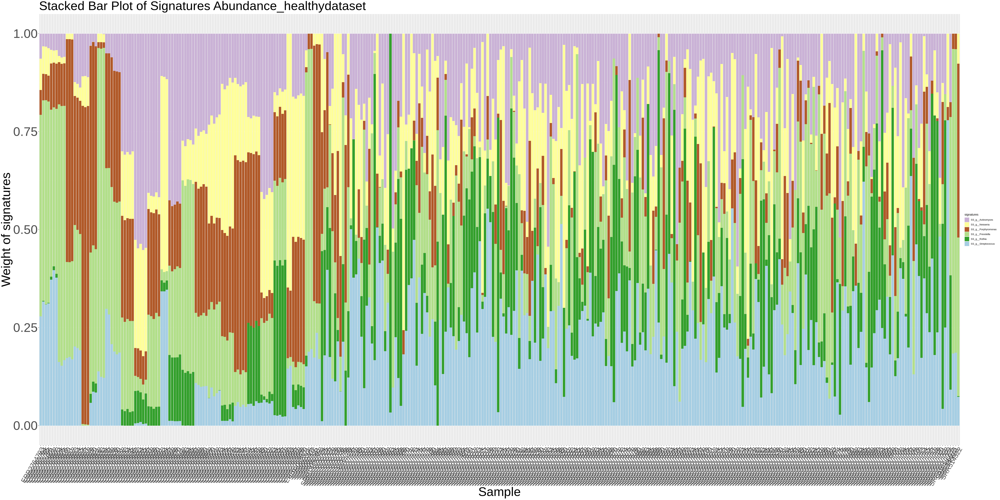

In [321]:
#custom_palette <- topo.colors(7)
#custom_palette <- rainbow(6)
#custom_palette <- heat.colors(6)
#custom_palette <- cm.colors(7)
custom_palette <- c("#cab2d6", "#ffff99", "#b15928", "#b2df8a", "#33a02c",
                    "#a6cee3", "#1f78b4")
options(repr.plot.width=50 , repr.plot.height= 25)
ggplot(df_long, aes(x = Samples, y = Abundance, fill = signatures)) +
  geom_bar(stat = "identity") +
  labs(title = "Stacked Bar Plot of Signatures Abundance_healthydataset ",
       x = "Sample",
       y = "Weight of signatures") +
scale_fill_manual(values = custom_palette) + 
  theme(axis.text.x = element_text(angle = 60, hjust = 1, size = 24),  # Increase text size for x-axis
        axis.text.y = element_text(size = 45),  # Increase text size for y-axis
        axis.title = element_text(size = 45),  # Increase text size for axis titles
        plot.title = element_text(size = 45))  # Increase text size for plot title


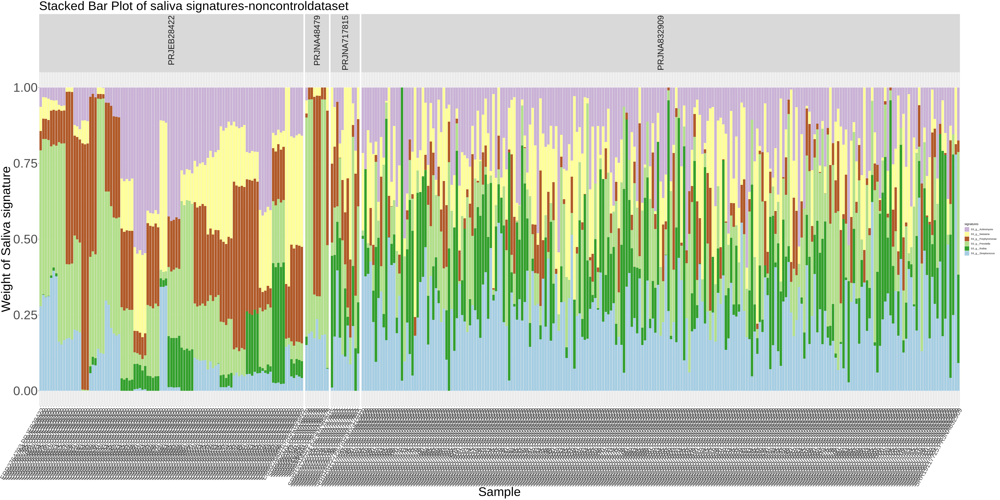

In [322]:
ggplot(df_flip_gr, aes(x = interaction(Samples, group), y = Abundance, fill = signatures)) +
  geom_bar(stat = "identity", position = "stack") +
  labs(title = "Stacked Bar Plot of saliva signatures-noncontroldataset",
       x = "Sample",
       y = "Weight of Saliva signature") +
  scale_fill_manual(values = custom_palette) + 
theme(axis.text.x = element_text(angle = 60, hjust = 1, size = 24),  # Increase text size for x-axis
        axis.text.y = element_text(size = 45),  # Increase text size for y-axis
        axis.title = element_text(size = 45),  # Increase text size for axis titles
        plot.title = element_text(size = 45), 
        strip.text.x = element_text(angle = 90, hjust = 1, size = 30)) + # Rotate and align facet labels with larger size
  facet_grid(~ group, scales = "free_x", space = "free_x")

In [198]:
df_long_gr <- df_long %>%
  mutate(group = case_when(
    startsWith(Samples, "ERR276") ~ "PRJEB28422",
    startsWith(Samples, "SRR2176") ~ "PRJNA883997",
    startsWith(Samples, "ERR1474") ~ "PRJEB14383",
    startsWith(Samples, "SRR14122") ~ "PRJNA717815",
    startsWith(Samples, "SRR19117") ~ "PRJNA832909",
      startsWith(Samples, "SRR2351") ~ "PRJNA934596",
    TRUE ~ "PRJNA48479"
  ))

# Group the dataframe based on the 'group' column
df_flip_gr <- df_long_gr %>% group_by(group)
df_flip_gr <- df_flip_gr %>% relocate(group, .after = Samples)
head(df_flip_gr,10)
dim(df_flip_gr)

Samples,group,signatures,Abundance
<chr>,<chr>,<chr>,<dbl>
ERR2764793,PRJEB28422,SS_g__Streptococcus,2.789399e-01
ERR2764793,PRJEB28422,SS_g__Prevotella,5.140306e-01
ERR2764793,PRJEB28422,SS_g__Neisseria,7.966910e-02
ERR2764793,PRJEB28422,SS_g__Actinomyces,6.400226e-02
ERR2764793,PRJEB28422,SS_g__Rothia,9.169788e-12
ERR2764793,PRJEB28422,SS_g__Porphyromonas,6.335808e-02
ERR2764795,PRJEB28422,SS_g__Streptococcus,3.089432e-01
ERR2764795,PRJEB28422,SS_g__Prevotella,5.205703e-01
ERR2764795,PRJEB28422,SS_g__Neisseria,7.030634e-02


[1] 2100    4

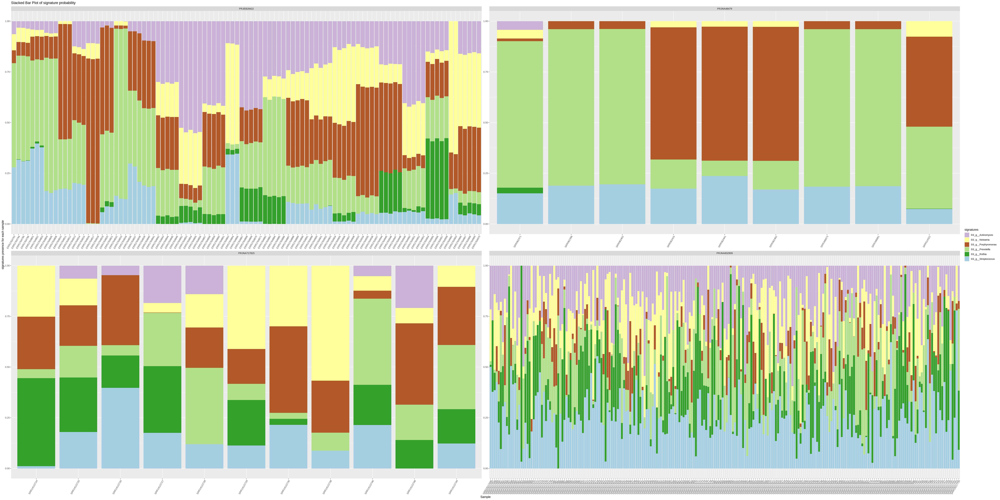

In [199]:
options(repr.plot.width=50 , repr.plot.height= 25)
ggplot(df_flip_gr, aes(x = Samples, y = Abundance, fill = signatures)) +
  geom_bar(stat = "identity") +
  labs(title = "Stacked Bar Plot of signature probability ",
       x = "Sample",
       y = "signatures presence for each sample") +
scale_fill_manual(values = custom_palette) + 
  theme(axis.text.x = element_text(angle = 60, hjust = 1)) +
  facet_wrap(~ group, scales = "free")

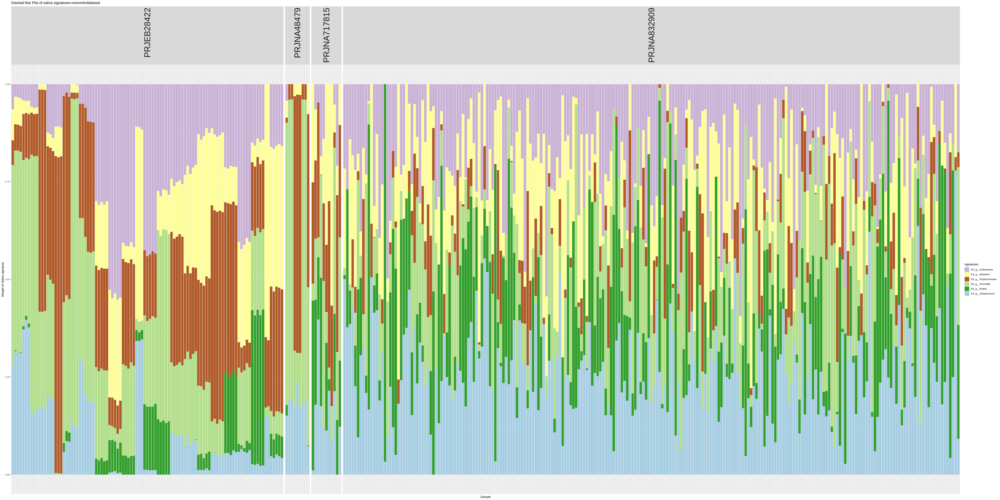

In [200]:
ggplot(df_flip_gr, aes(x = interaction(Samples, group), y = Abundance, fill = signatures)) +
  geom_bar(stat = "identity", position = "stack") +
  labs(title = "Stacked Bar Plot of saliva signatures-noncontroldataset",
       x = "Sample",
       y = "Weight of Saliva signature") +
  scale_fill_manual(values = custom_palette) + 
  theme(axis.text.x = element_blank(), # Hide the x-axis text
        axis.ticks.x = element_blank(), # Hide the x-axis ticks
        strip.text.x = element_text(angle = 90, hjust = 1, size = 30)) + # Rotate and align facet labels with larger size
  facet_grid(~ group, scales = "free_x", space = "free_x")

In [122]:
pdf("signature_stack_350healthy.pdf",width = 40, height = 25)
ggplot(df_flip_gr, aes(x = Samples, y = Abundance, fill = signatures)) +
  geom_bar(stat = "identity") +
  labs(title = "Stacked Bar Plot of signature probability ",
       x = "Sample",
       y = "signatures presence for each sample") +
scale_fill_manual(values = custom_palette) + 
  theme(axis.text.x = element_text(angle = 60, hjust = 1)) +
  facet_wrap(~ group, scales = "free")
dev.off()

png 
  2

In [206]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [208]:
pdf("signature_stackbars_350healthy_proj.pdf",width = 40, height = 25)
ggplot(df_flip_gr, aes(x = interaction(Samples, group), y = Abundance, fill = signatures)) +
  geom_bar(stat = "identity", position = "stack") +
  labs(title = "Stack Bar Plot of the Saliva Signatures for healthy dataset",
       x = "Sample",
       y = "Weight of Saliva signature") +
  scale_fill_manual(values = custom_palette) + 
theme(axis.text.x = element_text(angle = 60, hjust = 1, size = 24),  # Increase text size for x-axis
        axis.text.y = element_text(size = 45),  # Increase text size for y-axis
        axis.title = element_text(size = 45),  # Increase text size for axis titles
        plot.title = element_text(size = 45), 
        strip.text.x = element_text(angle = 90, hjust = 1, size = 30)) + # Rotate and align facet labels with larger size
  facet_grid(~ group, scales = "free_x", space = "free_x")
dev.off()

png 
  2

## the composition of genera in each signature 

In [133]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [323]:
# summary of signatures contents
    sigPickup=0.01
    sigbact_mat = 100* W[rowSums(W >= sigPickup) > 0,]
    rownames(sigbact_mat) = gsub(".*;([^\\;?]+[;\\?]*)$", "\\1", row.names(sigbact_mat), perl = TRUE)
    

In [324]:
 str(sigbact_mat)
head(sigbact_mat)

 num [1:65, 1:6] 1.82e+01 1.60 3.74e-14 1.92e-01 5.62e-02 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:65] "g__Actinomyces" "g__Schaalia" "g__Bifidobacterium" "g__Parascardovia" ...
  ..$ : chr [1:6] "SS_g__Streptococcus" "SS_g__Prevotella" "SS_g__Neisseria" "SS_g__Actinomyces" ...


,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas
g__Actinomyces,1.817435e+01,9.222269e+00,1.467785e+01,173.03321658,2.451473e-07,0.0006663451
g__Schaalia,1.598173e+00,9.494022e-01,4.903918e-07,0.71388026,0.000000e+00,2.3590261122
g__Bifidobacterium,3.741724e-14,3.997173e-01,0.000000e+00,0.13273071,1.077747e+00,0.0000000000
g__Parascardovia,1.917810e-01,5.521648e-07,0.000000e+00,0.00000000,1.436920e+00,0.0000000000
g__Scardovia,5.620327e-02,4.342442e-02,0.000000e+00,0.00749737,1.023386e+00,0.0000000000
g__Corynebacterium,3.542041e+00,0.000000e+00,3.206127e+00,1.69033946,1.233008e+00,0.0000000000


In [325]:
sigbact_mat = as.data.frame(sigbact_mat)
    library(data.table)
    setDT(sigbact_mat, keep.rownames = TRUE)[]
   

rn,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
g__Actinomyces,1.817435e+01,9.222269e+00,1.467785e+01,1.730332e+02,2.451473e-07,6.663451e-04
g__Schaalia,1.598173e+00,9.494022e-01,4.903918e-07,7.138803e-01,0.000000e+00,2.359026e+00
g__Bifidobacterium,3.741724e-14,3.997173e-01,0.000000e+00,1.327307e-01,1.077747e+00,0.000000e+00
g__Parascardovia,1.917810e-01,5.521648e-07,0.000000e+00,0.000000e+00,1.436920e+00,0.000000e+00
g__Scardovia,5.620327e-02,4.342442e-02,0.000000e+00,7.497370e-03,1.023386e+00,0.000000e+00
g__Corynebacterium,3.542041e+00,0.000000e+00,3.206127e+00,1.690339e+00,1.233008e+00,0.000000e+00
g__Cellulomonas,0.000000e+00,1.194535e+00,9.782781e-02,2.344688e-02,3.363880e+00,1.640352e-01
g__Rothia,7.485320e-01,0.000000e+00,8.706419e+01,4.530468e+01,1.312510e+02,2.320378e-14
g__Isoptericola,0.000000e+00,5.725224e-03,0.000000e+00,0.000000e+00,1.009642e+01,0.000000e+00


In [326]:
es_names

[1] "SS_g__Streptococcus" "SS_g__Prevotella"    "SS_g__Neisseria"    
[4] "SS_g__Actinomyces"   "SS_g__Rothia"        "SS_g__Porphyromonas"

In [351]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [352]:
 # get a character for each sig stating its contents in bacteria
    sig_et_contents = list()
    for (sign in es_names) {
        # order by column matching this sign
        sigbact_mat = sigbact_mat[order(sigbact_mat[[sign]],decreasing = TRUE),]
        # select content: bact > 1% in sign
        signame = paste(sigbact_mat[sigbact_mat[[sign]]>1,]$rn, collapse = " - ") # not ordered by prevalence here
        sig_et_contents[[sign]] <- signame
    }
    


In [355]:
sigPickup=0.04 

In [356]:
es_names

[1] "SS_g__Streptococcus" "SS_g__Prevotella"    "SS_g__Neisseria"    
[4] "SS_g__Actinomyces"   "SS_g__Rothia"        "SS_g__Porphyromonas"

In [357]:
compo = as.data.frame(W_norm_byES[, "SS_g__Streptococcus", drop=FALSE])
compo$genus = rownames(compo)
names(compo) = c("percentage", "genus")
 compo = compo[,c("genus","percentage")]

In [359]:
compo = compo[compo$percentage >= sigPickup,]
compo = compo[order(compo$percentage, decreasing = TRUE),]
head(compo)

,genus,percentage
,<chr>,<dbl>
g__Streptococcus,g__Streptococcus,0.52816037
g__Veillonella,g__Veillonella,0.09316708
g__Gemella,g__Gemella,0.08118881
g__Granulicatella,g__Granulicatella,0.04682954


In [360]:
compo$genus_simp = unlist(lapply(compo$genus, shorten_genus, genera=compo$genus))
compo <- rbind(compo, c("others", 1-sum(compo$percentage), "others"))
head(compo)


,genus,percentage,genus_simp
,<chr>,<chr>,<chr>
g__Streptococcus,g__Streptococcus,0.528160374751062,g__Streptococcus
g__Veillonella,g__Veillonella,0.0931670835939321,g__Veillonella
g__Gemella,g__Gemella,0.0811888103591855,g__Gemella
g__Granulicatella,g__Granulicatella,0.046829542766406,g__Granulicatella
5,others,0.250654188529415,others


In [362]:
compo$percentage <- as.numeric(compo$percentage)

In [363]:
compo$percentage <- round(compo$percentage * 100, 2)

In [364]:
compo$colors = g4_colours[unlist(compo$genus_simp)]
        all_genera_4pc = c(all_genera_4pc, compo$genus)

In [365]:
p <- plot_ly(compo, x = ~genus_simp, y = ~percentage, type = 'bar', marker = list(color = ~colors)) %>%
        layout(xaxis = list(title = "Genus"), yaxis = list(title = "Percentage"), showlegend = FALSE)
    p

HTML widgets cannot be represented in plain text (need html)

In [366]:
library(plotly)

p <- plot_ly(compo, 
             labels = ~genus_simp, 
             values = ~percentage, 
             type = 'pie',
             textposition = 'outside',
             textinfo = 'label',
             sort = TRUE, 
             marker = list(colors=~colors)) %>%
  layout(xaxis = list(showgrid = FALSE, zeroline = FALSE, showticklabels = FALSE),
         yaxis = list(showgrid = FALSE, zeroline = FALSE, showticklabels = FALSE),
         showlegend = FALSE,
         margin = list(b = 180, l = 50, r = 50, t = 10)) %>%
  add_trace(showlegend = FALSE)



In [367]:
p

HTML widgets cannot be represented in plain text (need html)

In [368]:
#dropping 0 from W_norm matrix
W_norm_no0 <- W_norm[rowSums(W_norm) != 0, ]
head(W_norm_no0)
dim(W_norm_no0)

,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.02872577,0.21845499,1.724317e-01,2.400553e-01,3.403322e-01,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.08448926,0.04287267,6.823470e-02,8.044003e-01,1.139646e-09,3.097719e-06
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.00000000,1.00000000,0.000000e+00,7.457388e-11,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Pauljensenia,0.17670036,0.29739445,0.000000e+00,4.219913e-01,1.039139e-01,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Peptidiphaga,0.14001559,0.00000000,4.467984e-01,2.450097e-01,1.681763e-01,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Schaalia,0.28434809,0.16891828,8.725083e-08,1.270140e-01,0.000000e+00,4.197195e-01


[1] 222   6

In [369]:
# ES assignments of genera
    assignments = as.data.frame(apply(W_norm_no0,1,function(x) which(x==max(x))))
# ES assignments of samples
    sample_assignments = as.data.frame(apply(H_norm,2,function(x) which(x==max(x)))) 
    

In [372]:
 names(assignments) = names(sample_assignments) = c("prediction")

In [376]:
# associate the name of ES to the assignment
    assignments$prediction_nm = es_names[assignments$prediction]
    sample_assignments$prediction_nm = es_names[sample_assignments$prediction]

In [378]:
 # add genus or sample as a column to the df
    assignments$genus <- rownames(assignments)
    sample_assignments$sample <- rownames(sample_assignments)

In [382]:
 # retrieve assignment probability
    prob = as.data.frame(apply(W_norm_no0,1,max)) 
    head(prob)
dim(prob)

,"apply(W_norm_no0, 1, max)"
,<dbl>
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.3403322
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.8044003
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,1.0000000
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Pauljensenia,0.4219913
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Peptidiphaga,0.4467984
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Schaalia,0.4197195


[1] 222   1

In [383]:
sample_prob = as.data.frame(apply(H_norm,2,max)) 
    head(sample_prob)

,"apply(H_norm, 2, max)"
,<dbl>
ERR2764793,0.5140306
ERR2764795,0.5205703
ERR2764796,0.5132742
ERR2764794,0.5118028
ERR2764803,0.4212482
ERR2764801,0.4259236


In [384]:
names(prob) =  names(sample_prob) = c("probability")
    prob$genus <- rownames(prob)
    sample_prob$sample <- rownames(sample_prob)

In [387]:
assigned_sample_color = es2Col[sample_assignments$prediction_nm]
  

In [389]:
  names(assigned_sample_color) = sample_assignments$sample

In [392]:
merged_data <- merge(sample_assignments, mdmx, by.x = "sample", by.y = "SmplID", all.x = TRUE)

# Assign NA to rows where there is no match
merged_data$disease_status <- ifelse(is.na(merged_data$disease_status), NA, merged_data$disease_status)
tail(merged_data)
unique(merged_data$disease_status)


,sample,prediction,prediction_nm,accession,age,disease_status,sex,race.country,BMI
,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>
345,SRR19117722,5,SS_g__Rothia,SAMN28004576,70,Control,M,Japan,NA
346,SRR19117723,1,SS_g__Streptococcus,SAMN28004577,70,Control,F,Japan,NA
347,SRR19117725,2,SS_g__Prevotella,SAMN28004659,70,Control,F,Japan,NA
348,SRR346673,2,SS_g__Prevotella,SAMN00035910,NA,Control,M,NA,NA
349,SRR346681,2,SS_g__Prevotella,SAMN00035910,NA,Control,M,NA,NA
350,SRR514322,6,SS_g__Porphyromonas,SAMN00146343,NA,Control,F,NA,NA


[1] "Control"

In [393]:
#merged_data <- merged_data %>% mutate(sex = ifelse(is.na(sex), 0, sex))
unique(merged_data$sex)
dim(merged_data)
table(merged_data$sex)

[1] "M" "F" "0"

[1] 350   9


  0   F   M 
 11 148 191 

In [394]:
table(merged_data$age)


 52  61  62  63  64  65  67  68  69  70 
  5   5   7  15   5  10  15   3   5 229 

In [395]:
sample_assignments$disease_status <- mdmx[match(mdmx$SmplID, sample_assignments$sample), "disease_status"]
sample_assignments$sex <- mdmx[match(mdmx$SmplID, sample_assignments$sample), "sex"]
head(sample_assignments)
table(sample_assignments$sex)

,prediction,prediction_nm,sample,disease_status,sex
,<int>,<chr>,<chr>,<chr>,<chr>
ERR2764793,2,SS_g__Prevotella,ERR2764793,Control,M
ERR2764795,2,SS_g__Prevotella,ERR2764795,Control,M
ERR2764796,2,SS_g__Prevotella,ERR2764796,Control,M
ERR2764794,2,SS_g__Prevotella,ERR2764794,Control,M
ERR2764803,2,SS_g__Prevotella,ERR2764803,Control,M
ERR2764801,2,SS_g__Prevotella,ERR2764801,Control,M



  0   F   M 
 11 148 191 

In [396]:
head(assigned_sample_color)
tail(sample_assignments)

ERR2764793 ERR2764795 ERR2764796 ERR2764794 ERR2764803 ERR2764801 
 "#009E73"  "#009E73"  "#009E73"  "#009E73"  "#009E73"  "#009E73"

,prediction,prediction_nm,sample,disease_status,sex
,<int>,<chr>,<chr>,<chr>,<chr>
SRR19117626,3,SS_g__Neisseria,SRR19117626,Control,M
SRR19117625,3,SS_g__Neisseria,SRR19117625,Control,M
SRR19117624,5,SS_g__Rothia,SRR19117624,Control,M
SRR19117623,4,SS_g__Actinomyces,SRR19117623,Control,M
SRR19117621,1,SS_g__Streptococcus,SRR19117621,Control,F
SRR19117620,1,SS_g__Streptococcus,SRR19117620,Control,M


In [397]:
sample_assignments$disease_status <- as.factor(sample_assignments$disease_status)
sample_assignments$sex <- as.factor(sample_assignments$sex)
#sample_assignments$region <- as.factor(sample_assignments$region)

In [398]:
all_es_names

[1] "SS_g__Streptococcus"  "SS_g__Prevotella"     "SS_g__Neisseria"     
 [4] "SS_g__Rothia"         "SS_g__Actinomyces"    "SS_g__Porphyromonas" 
 [7] "SS_g__Veillonella"    "SS_g__GGB1144"        "SS_g__Alloprevotella"
[10] "SS_g__Haemophilus"    "SS_g__Fusobacterium"  "SS_g__Gemella"

In [399]:
unique(sample_assignments$sex)

[1] M F 0
Levels: 0 F M

In [400]:
es_pointshape=c(0, 19 ,2)#,6,8,13,9,2,10) 0:square=female , 4: cross =male
names(es_pointshape)= unique(sample_assignments$sex)
sample_shape = es_pointshape[sample_assignments$sex] 
    names(sample_shape) = sample_assignments$sample 

In [405]:
mds_data <- merge(x=sample_assignments, y=pcoa, by.x="sample" , by.y="Samples")
head(mds_data)
dim(mds_data)

,sample,prediction,prediction_nm,disease_status,sex,Dim1,Dim2
,<chr>,<int>,<chr>,<fct>,<fct>,<dbl>,<dbl>
1,ERR2764793,2,SS_g__Prevotella,Control,M,-0.2135201,0.1156160
2,ERR2764794,2,SS_g__Prevotella,Control,M,-0.1995037,0.1288556
3,ERR2764795,2,SS_g__Prevotella,Control,M,-0.2082384,0.1256955
4,ERR2764796,2,SS_g__Prevotella,Control,M,-0.2038437,0.1267125
5,ERR2764801,2,SS_g__Prevotella,Control,M,-0.1381193,0.1427970
6,ERR2764802,2,SS_g__Prevotella,Control,M,-0.1152274,0.1526626


[1] 350   7

In [406]:
#table(mds_data_ait$sex)
adonis2(mx_norm.bray ~ prediction_nm , data=mds_data, perm=999, na.action=na.omit)

,Df,SumOfSqs,R2,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
prediction_nm,5,3.047502,0.08623894,6.493207,0.001
Residual,344,32.290384,0.91376106,NA,NA
Total,349,35.337886,1.00000000,NA,NA


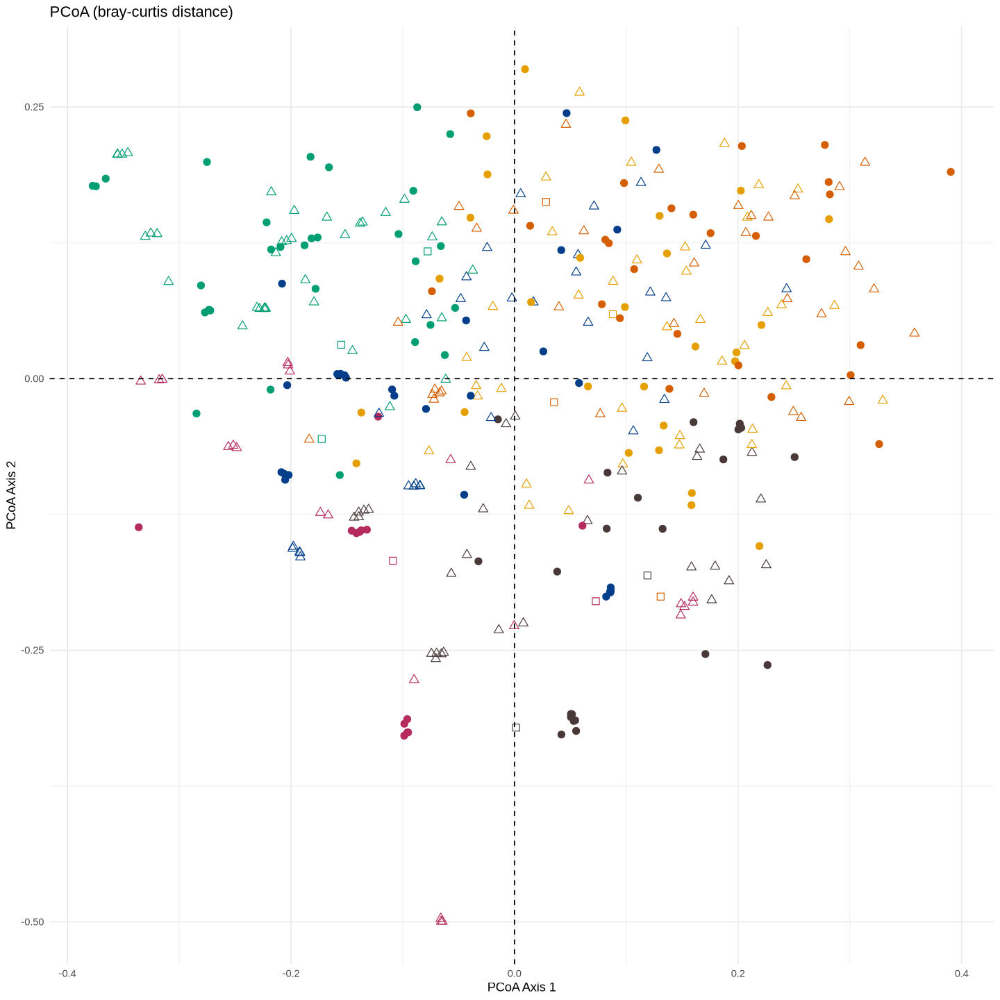

In [407]:
options(repr.plot.width=12, repr.plot.height= 12)
p <- ggplot() +
  geom_point(data = as.data.frame(scores(mx_norm.b.pcoa, choices = c(1, 2))),
             aes(x = Dim1, y = Dim2, color = assigned_sample_color[rownames(scores(mx_norm.b.pcoa, choices = c(1, 2)))]),
             shape = sample_shape, size = 2.5) +
  geom_hline(yintercept = 0, linetype = "dashed") +
  geom_vline(xintercept = 0, linetype = "dashed") +
  labs(title = "PCoA (bray-curtis distance)",
       x = "PCoA Axis 1", y = "PCoA Axis 2") +
  scale_color_identity() +
  theme_minimal()


# Print the plot
print(p)


species scores not available



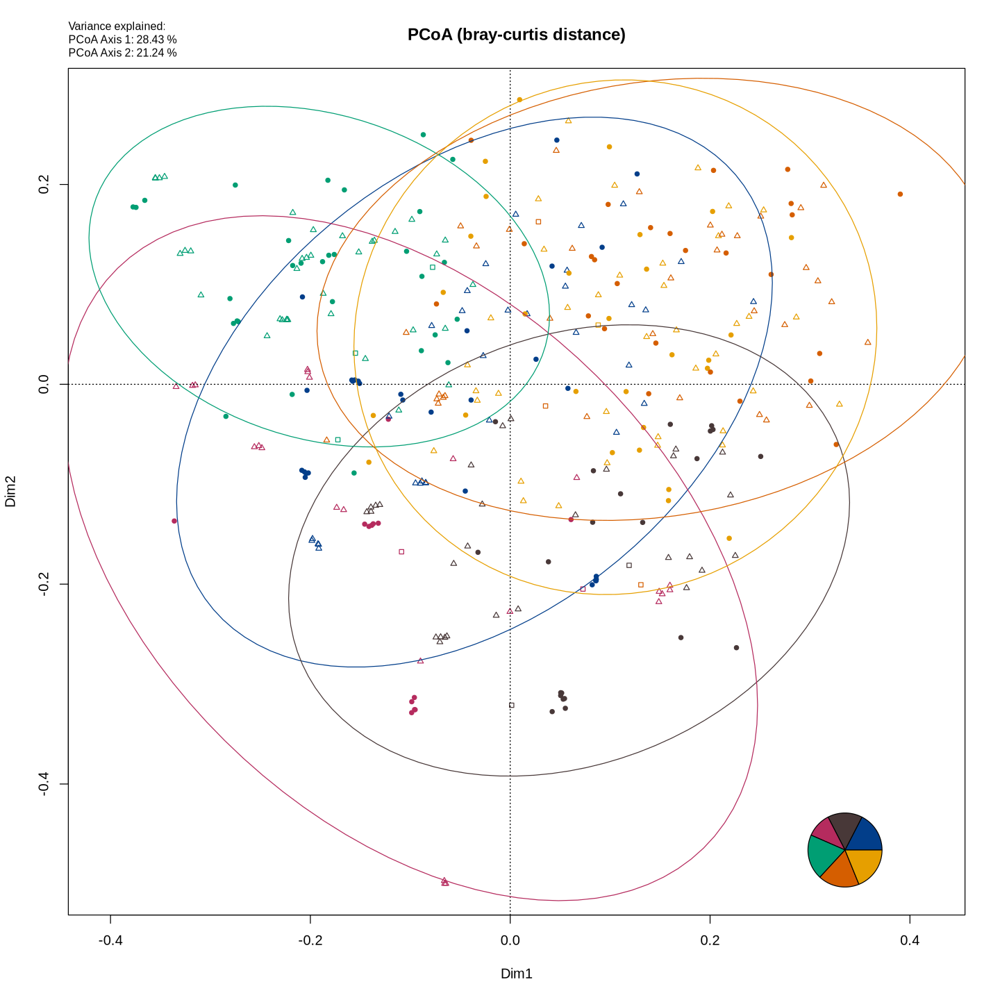

In [408]:
# Create the ordination plot
ordiplot(scores(mx_norm.b.pcoa, choices=c(1,2)), type="none", main="PCoA (bray-curtis distance)")
points(scores(mx_norm.b.pcoa, choices=c(1,2)), col = assigned_sample_color[rownames(scores(mx_norm.b.pcoa, choices=c(1,2)))], pch=sample_shape, cex=0.7)
abline(h=0, lty=3)
abline(v=0, lty=3)

# Extract unique colors and their corresponding labels
unique_colors <- unique(assigned_sample_color)
legend_labels <- unique(sample_assignments$prediction_nm)

# Create legend based on colors
#legend("topleft", legend=legend_labels, col=unique_colors, pch=rep(16, length(unique_colors)), cex=1.3)

# Annotate plot with variance explained
total_variance <- sum(mx_norm.b.pcoa$eig)
variance_explained <- (mx_norm.b.pcoa$eig / total_variance) * 100
mtext(paste("Variance explained:\nPCoA Axis 1:", round(variance_explained[1], 2), "%\nPCoA Axis 2:", round(variance_explained[2], 2), "%"), side = 3, line = 0.5, adj = 0, cex = 0.8)

ordiellipse(mx_norm.b.pcoa, groups = sample_assignments$prediction_nm, conf = 0.95, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])

# Add a pie chart in the margin
par(fig= c(0.72,0.97,0.1,0.2), new=TRUE, mar=c(0,0,0,0))
pie(summary(as.factor(sample_assignments$prediction_nm)), labels=NA, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])


species scores not available



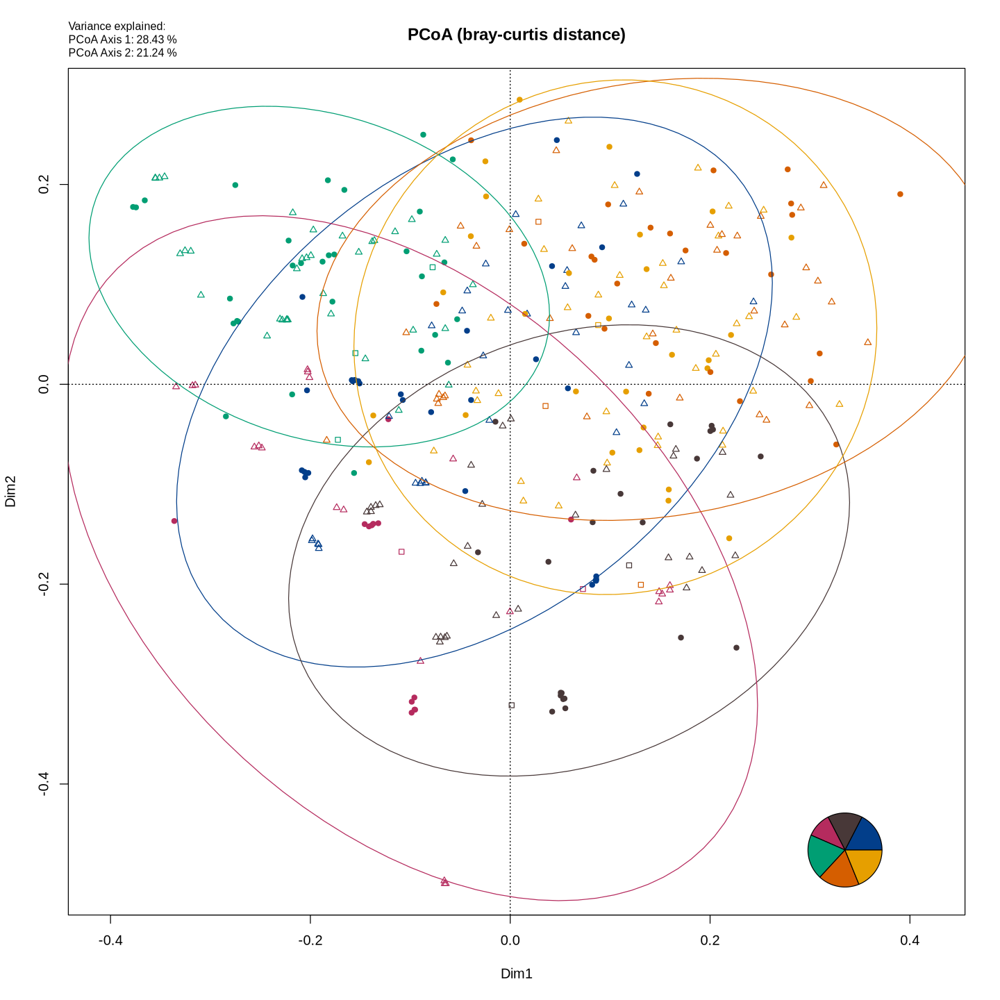

In [409]:
# Create the ordination plot
ordiplot(scores(mx_norm.b.pcoa, choices=c(1,2)), type="none", main="PCoA (bray-curtis distance)")
points(scores(mx_norm.b.pcoa, choices=c(1,2)), col = assigned_sample_color[rownames(scores(mx_norm.b.pcoa, choices=c(1,2)))], pch=sample_shape, cex=0.8)

abline(h=0, lty=3)
abline(v=0, lty=3)

# Extract unique colors and their corresponding labels
unique_colors <- unique(assigned_sample_color)
legend_labels <- unique(sample_assignments$prediction_nm)

# Create legend based on colors
#legend("topleft", legend=legend_labels, col=unique_colors, pch=rep(1, length(unique_colors)), cex=0.6)

# Annotate plot with variance explained
total_variance <- sum(mx_norm.b.pcoa$eig)
variance_explained <- (mx_norm.b.pcoa$eig / total_variance) * 100
mtext(paste("Variance explained:\nPCoA Axis 1:", round(variance_explained[1], 2), "%\nPCoA Axis 2:", round(variance_explained[2], 2), "%"), side = 3, line = 0.5, adj = 0, cex = 0.8)

#ordiellipse(mx_norm.b.pcoa, groups = sample_assignments$disease_status, conf = 0.95), col = age2col[names(summary(as.factor(sample_assignments$disease_status)))])
ordiellipse(mx_norm.b.pcoa, groups = sample_assignments$prediction_nm, conf = 0.95, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])

# Add a pie chart in the margin
par(fig= c(0.72,0.97,0.1,0.2), new=TRUE, mar=c(0,0,0,0))
pie(summary(as.factor(sample_assignments$prediction_nm)), labels=NA, col = es2Col[names(summary(as.factor(sample_assignments$prediction_nm)))])

# Add legend for point shapes based on disease status
#legend("bottomright", legend = names(es_pointshape), pch = es_pointshape, cex = 0.5, title = "Disease Status")


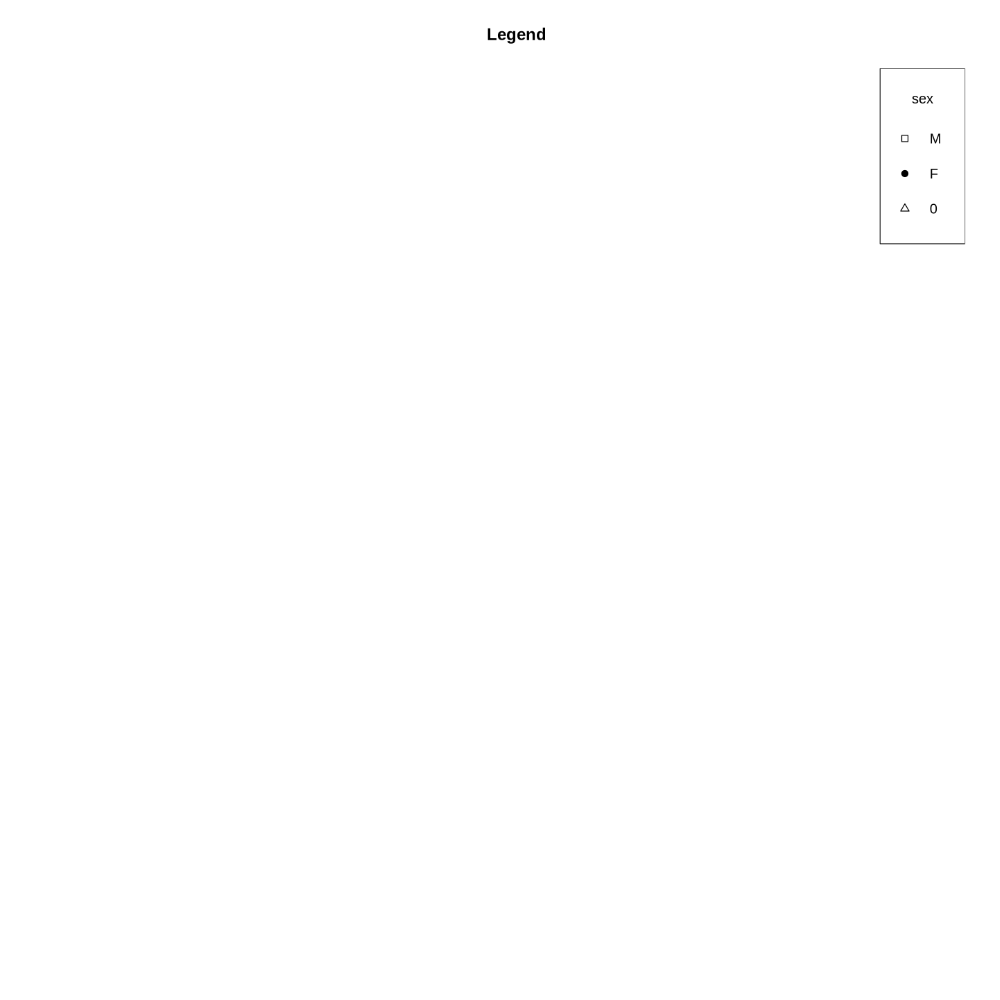

In [410]:
# Create an empty plot for the legend
plot(1, type="n", axes=FALSE, xlab="", ylab="", main="Legend")

# Add legend for point shapes based on disease status
legend("topright", legend = names(es_pointshape), pch = es_pointshape, cex = 1, title = "sex")


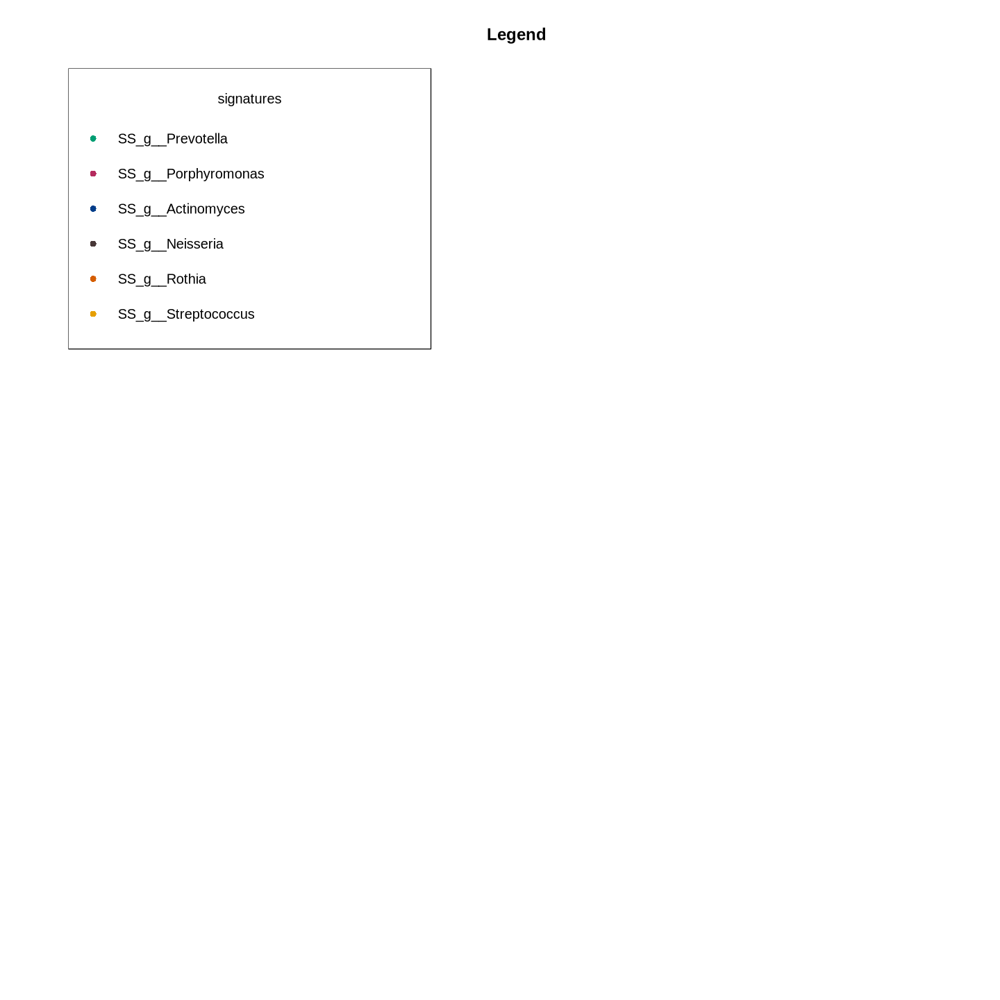

In [411]:
# Create an empty plot for the legend
plot(1, type="n", axes=FALSE, xlab="", ylab="", main="Legend")

# Add legend for point shapes based on disease status
legend("topleft", legend=legend_labels, col=unique_colors, pch=rep(16, length(unique_colors)), cex=1 , title= "signatures")


# SS diversity analysis (based on optimal number of signature)

In [452]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

In [454]:
es_nb = 6
 # Get H and W matrices
    W = nmf_data[[as.character(es_nb)]][['W']]
    H = nmf_data[[as.character(es_nb)]][['H']]
 W_norm = W/rowSums(W) # W is n x r (n: measured features (bact) in row, r: signatures in columns)
    W_norm_byES = sweep(W,2,colSums(W),"/") # W is n x r (n: measured features (bact) in row, r: signatures in columns)
    W_norm[is.nan(W_norm)] <- 0
    H_norm = sweep(H,2,colSums(H),"/")
    

In [414]:
head(H_norm)
head(W_norm)

,ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
SS_g__Streptococcus,2.789399e-01,0.3089432038,0.312186549,0.316710654,0.377501947,0.372353500,0.39643076,1.621837e-01,1.528233e-01,1.669132e-01,⋯,0.31552780,3.743008e-01,1.941713e-01,0.22690909,0.12233244,1.959035e-01,4.797342e-02,0.17028400,2.631779e-01,5.541569e-01
SS_g__Prevotella,5.140306e-01,0.5205703447,0.513274201,0.511802847,0.421248245,0.425923591,0.40553247,6.574787e-01,6.625730e-01,6.490381e-01,⋯,0.01451004,1.745780e-57,3.891529e-01,0.36657888,0.03025767,1.565219e-01,2.142714e-01,0.26075701,2.535636e-01,2.933101e-175
SS_g__Neisseria,7.966910e-02,0.0703063423,0.070169315,0.070534612,0.034278235,0.034978351,0.03069471,1.581892e-02,1.606736e-02,1.651716e-02,⋯,0.32822299,3.223322e-01,6.964736e-19,0.01538670,0.64313946,3.153645e-01,4.801017e-126,0.02442441,2.375633e-01,2.714515e-01
SS_g__Actinomyces,6.400226e-02,0.0331700350,0.036856174,0.032189531,0.042359050,0.041202734,0.04318015,5.709731e-02,6.086710e-02,5.936319e-02,⋯,0.21353394,5.204794e-02,2.130492e-01,0.19301954,0.13547140,2.433523e-01,1.060501e-01,0.34381330,6.518154e-02,4.941720e-02
SS_g__Rothia,9.169788e-12,0.0006743294,0.001248921,0.001570604,0.009637022,0.007659854,0.01000930,1.709764e-67,2.179098e-74,3.860885e-73,⋯,0.05686738,3.965006e-02,4.070191e-02,0.18650952,0.05135652,8.885781e-02,6.317051e-01,0.16036894,2.389857e-46,6.017063e-22
SS_g__Porphyromonas,6.335808e-02,0.0663357449,0.066264839,0.067191751,0.114975500,0.117881970,0.11415262,1.074214e-01,1.076692e-01,1.081683e-01,⋯,0.07133783,2.116690e-01,1.629247e-01,0.01159628,0.01744251,4.191712e-59,9.930753e-119,0.04035233,1.805136e-01,1.249744e-01


,SS_g__Streptococcus,SS_g__Prevotella,SS_g__Neisseria,SS_g__Actinomyces,SS_g__Rothia,SS_g__Porphyromonas
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__GGB50949,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobrevibacter,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinobaculum,0.02872577,0.21845499,0.1724317,2.400553e-01,3.403322e-01,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces,0.08448926,0.04287267,0.0682347,8.044003e-01,1.139646e-09,3.097719e-06
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__Fannyhessea,0.00000000,0.00000000,0.0000000,0.000000e+00,0.000000e+00,0.000000e+00
k__Bacteria;p__Actinobacteria;c__Actinomycetia;o__Actinomycetales;f__Actinomycetaceae;g__GGB9835,0.00000000,1.00000000,0.0000000,7.457388e-11,0.000000e+00,0.000000e+00


In [415]:
H_norm <- 100*H_norm
W_norm <- 100*W_norm


In [416]:
W_norm <- as.data.frame(W_norm)
H_norm <- as.data.frame(H_norm)

In [417]:
head(H_norm)

,ERR2764793,ERR2764795,ERR2764796,ERR2764794,ERR2764803,ERR2764801,ERR2764802,ERR2764804,ERR2764805,ERR2764806,⋯,SRR19117632,SRR19117630,SRR19117628,SRR19117627,SRR19117626,SRR19117625,SRR19117624,SRR19117623,SRR19117621,SRR19117620
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SS_g__Streptococcus,2.789399e+01,30.89432038,31.2186549,31.6710654,37.7501947,37.2353500,39.643076,1.621837e+01,1.528233e+01,1.669132e+01,⋯,31.552780,3.743008e+01,1.941713e+01,22.690909,12.233244,1.959035e+01,4.797342e+00,17.028400,2.631779e+01,5.541569e+01
SS_g__Prevotella,5.140306e+01,52.05703447,51.3274201,51.1802847,42.1248245,42.5923591,40.553247,6.574787e+01,6.625730e+01,6.490381e+01,⋯,1.451004,1.745780e-55,3.891529e+01,36.657888,3.025767,1.565219e+01,2.142714e+01,26.075701,2.535636e+01,2.933101e-173
SS_g__Neisseria,7.966910e+00,7.03063423,7.0169315,7.0534612,3.4278235,3.4978351,3.069471,1.581892e+00,1.606736e+00,1.651716e+00,⋯,32.822299,3.223322e+01,6.964736e-17,1.538670,64.313946,3.153645e+01,4.801017e-124,2.442441,2.375633e+01,2.714515e+01
SS_g__Actinomyces,6.400226e+00,3.31700350,3.6856174,3.2189531,4.2359050,4.1202734,4.318015,5.709731e+00,6.086710e+00,5.936319e+00,⋯,21.353394,5.204794e+00,2.130492e+01,19.301954,13.547140,2.433523e+01,1.060501e+01,34.381330,6.518154e+00,4.941720e+00
SS_g__Rothia,9.169788e-10,0.06743294,0.1248921,0.1570604,0.9637022,0.7659854,1.000930,1.709764e-65,2.179098e-72,3.860885e-71,⋯,5.686738,3.965006e+00,4.070191e+00,18.650952,5.135652,8.885781e+00,6.317051e+01,16.036894,2.389857e-44,6.017063e-20
SS_g__Porphyromonas,6.335808e+00,6.63357449,6.6264839,6.7191751,11.4975500,11.7881970,11.415262,1.074214e+01,1.076692e+01,1.081683e+01,⋯,7.133783,2.116690e+01,1.629247e+01,1.159628,1.744251,4.191712e-57,9.930753e-117,4.035233,1.805136e+01,1.249744e+01


In [418]:
rownames(W_norm) <- lapply(rownames(W_norm), shorten_genus, genera=rownames(W_norm))

In [419]:
if (dim(W_norm)[2] == 6){
    ordered_es_names <- c("SS_g__Streptococcus", "SS_g__Prevotella", "SS_g__Neisseria", "SS_g__Rothia", "SS_g__Porphyromonas", "SS_g__Actinomyces")
    W_norm <- W_norm[,ordered_es_names]
} else{
    ordered_es_names <- colnames(W_norm)
}



In [420]:
ordered_es_names
es_names

[1] "SS_g__Streptococcus" "SS_g__Prevotella"    "SS_g__Neisseria"    
[4] "SS_g__Rothia"        "SS_g__Porphyromonas" "SS_g__Actinomyces"

[1] "SS_g__Streptococcus" "SS_g__Prevotella"    "SS_g__Neisseria"    
[4] "SS_g__Actinomyces"   "SS_g__Rothia"        "SS_g__Porphyromonas"

In [421]:
# assign samples to main ES
 W_norm_no0 <- W_norm[rowSums(W_norm) != 0, ]
 
assignments = as.data.frame(apply(W_norm_no0,1,function(x) which(x==max(x))))

In [422]:
head(assignments)

,"apply(W_norm_no0, 1, function(x) which(x == max(x)))"
,<int>
g__Actinobaculum,4
g__Actinomyces,6
g__GGB9835,2
g__Pauljensenia,6
g__Peptidiphaga,3
g__Schaalia,5


In [423]:
# ES assignments of samples
    sample_assignments = as.data.frame(apply(H_norm,2,function(x) which(x==max(x)))) 
  
   head(sample_assignments)


,"apply(H_norm, 2, function(x) which(x == max(x)))"
,<int>
ERR2764793,2
ERR2764795,2
ERR2764796,2
ERR2764794,2
ERR2764803,2
ERR2764801,2


In [424]:
 names(assignments) = names(sample_assignments) = c("prediction")

In [425]:
assignments$prediction_nm = es_names[assignments$prediction]
sample_assignments$prediction_nm = es_names[sample_assignments$prediction]

In [426]:
# add genus or sample as a column to the df
assignments$genus <- rownames(assignments)
sample_assignments$sample <- rownames(sample_assignments)

In [427]:
head(assignments)
head(sample_assignments)

,prediction,prediction_nm,genus
,<int>,<chr>,<chr>
g__Actinobaculum,4,SS_g__Actinomyces,g__Actinobaculum
g__Actinomyces,6,SS_g__Porphyromonas,g__Actinomyces
g__GGB9835,2,SS_g__Prevotella,g__GGB9835
g__Pauljensenia,6,SS_g__Porphyromonas,g__Pauljensenia
g__Peptidiphaga,3,SS_g__Neisseria,g__Peptidiphaga
g__Schaalia,5,SS_g__Rothia,g__Schaalia


,prediction,prediction_nm,sample
,<int>,<chr>,<chr>
ERR2764793,2,SS_g__Prevotella,ERR2764793
ERR2764795,2,SS_g__Prevotella,ERR2764795
ERR2764796,2,SS_g__Prevotella,ERR2764796
ERR2764794,2,SS_g__Prevotella,ERR2764794
ERR2764803,2,SS_g__Prevotella,ERR2764803
ERR2764801,2,SS_g__Prevotella,ERR2764801


In [428]:
# retrieve assignment probability
    prob = as.data.frame(apply(W_norm_no0,1,max)) 
    sample_prob = as.data.frame(apply(H_norm,2,max)) 
    names(prob) =  names(sample_prob) = c("probability")
    prob$genus <- rownames(prob)
    sample_prob$sample <- rownames(sample_prob)
    

In [429]:
head(prob$genus)
length(prob$genus)


[1] "g__Actinobaculum" "g__Actinomyces"   "g__GGB9835"       "g__Pauljensenia" 
[5] "g__Peptidiphaga"  "g__Schaalia"

[1] 222

In [430]:
assignments$"proba" <- prob[match(assignments$genus, prob$genus), "probability"]
head(assignments)

,prediction,prediction_nm,genus,proba
,<int>,<chr>,<chr>,<dbl>
g__Actinobaculum,4,SS_g__Actinomyces,g__Actinobaculum,34.03322
g__Actinomyces,6,SS_g__Porphyromonas,g__Actinomyces,80.44003
g__GGB9835,2,SS_g__Prevotella,g__GGB9835,100.00000
g__Pauljensenia,6,SS_g__Porphyromonas,g__Pauljensenia,42.19913
g__Peptidiphaga,3,SS_g__Neisseria,g__Peptidiphaga,44.67984
g__Schaalia,5,SS_g__Rothia,g__Schaalia,41.97195


In [431]:
#assignments$"proba" <- prob[match(assignments$genus, prob$genus), "probability"]
sample_assignments$"proba" <- sample_prob[match(sample_assignments$sample, sample_prob$sample), "probability"]

In [432]:
library(dplyr)
sample_assignments %>% 
  group_by(prediction_nm) %>% 
  summarize(mean = mean(proba, na.rm = TRUE),
            median = median(proba, na.rm = TRUE),
            sd = sd(proba, na.rm = TRUE),
            min = min(proba, na.rm = TRUE),
            max = max(proba, na.rm = TRUE))

prediction_nm,mean,median,sd,min,max
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SS_g__Actinomyces,39.15468,39.34441,9.104872,24.10945,59.41298
SS_g__Neisseria,42.09113,37.98439,12.537292,25.23490,75.64256
SS_g__Porphyromonas,48.64819,44.30483,13.801383,32.63473,81.26002
SS_g__Prevotella,45.80601,41.81039,15.219471,24.00946,84.17770
SS_g__Rothia,45.09896,41.72350,13.892447,25.41177,96.64581
SS_g__Streptococcus,39.20210,37.79863,9.807153,22.24983,77.93132


In [433]:
sample_assignments %>%  
  summarize(mean = mean(proba, na.rm = TRUE),
            median = median(proba, na.rm = TRUE),
            sd = sd(proba, na.rm = TRUE),
            min = min(proba, na.rm = TRUE),
            max = max(proba, na.rm = TRUE))

mean,median,sd,min,max
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
43.02024,40.31873,12.90194,22.24983,96.64581


In [434]:
sample_assignments$"type" <- "sample"
assignments$"type" <- "taxa"

In [435]:
head(sample_assignments)
head(assignments)

,prediction,prediction_nm,sample,proba,type
,<int>,<chr>,<chr>,<dbl>,<chr>
ERR2764793,2,SS_g__Prevotella,ERR2764793,51.40306,sample
ERR2764795,2,SS_g__Prevotella,ERR2764795,52.05703,sample
ERR2764796,2,SS_g__Prevotella,ERR2764796,51.32742,sample
ERR2764794,2,SS_g__Prevotella,ERR2764794,51.18028,sample
ERR2764803,2,SS_g__Prevotella,ERR2764803,42.12482,sample
ERR2764801,2,SS_g__Prevotella,ERR2764801,42.59236,sample


,prediction,prediction_nm,genus,proba,type
,<int>,<chr>,<chr>,<dbl>,<chr>
g__Actinobaculum,4,SS_g__Actinomyces,g__Actinobaculum,34.03322,taxa
g__Actinomyces,6,SS_g__Porphyromonas,g__Actinomyces,80.44003,taxa
g__GGB9835,2,SS_g__Prevotella,g__GGB9835,100.00000,taxa
g__Pauljensenia,6,SS_g__Porphyromonas,g__Pauljensenia,42.19913,taxa
g__Peptidiphaga,3,SS_g__Neisseria,g__Peptidiphaga,44.67984,taxa
g__Schaalia,5,SS_g__Rothia,g__Schaalia,41.97195,taxa


In [436]:
names(sample_assignments)[names(sample_assignments) == 'sample'] <- 'id'
names(assignments)[names(assignments) == 'genus'] <- 'id'

In [437]:
ordered_es_names

[1] "SS_g__Streptococcus" "SS_g__Prevotella"    "SS_g__Neisseria"    
[4] "SS_g__Rothia"        "SS_g__Porphyromonas" "SS_g__Actinomyces"

In [438]:
all_assign <- rbind(assignments, sample_assignments)
head(all_assign)
dim(all_assign)
unique(all_assign$type)

,prediction,prediction_nm,id,proba,type
,<int>,<chr>,<chr>,<dbl>,<chr>
g__Actinobaculum,4,SS_g__Actinomyces,g__Actinobaculum,34.03322,taxa
g__Actinomyces,6,SS_g__Porphyromonas,g__Actinomyces,80.44003,taxa
g__GGB9835,2,SS_g__Prevotella,g__GGB9835,100.00000,taxa
g__Pauljensenia,6,SS_g__Porphyromonas,g__Pauljensenia,42.19913,taxa
g__Peptidiphaga,3,SS_g__Neisseria,g__Peptidiphaga,44.67984,taxa
g__Schaalia,5,SS_g__Rothia,g__Schaalia,41.97195,taxa


[1] 572   5

[1] "taxa"   "sample"

In [439]:
all_assign$prediction_nm <- factor(all_assign$prediction_nm, levels = ordered_es_names)

In [440]:
sample_assignments$prediction_nm <- factor(sample_assignments$prediction_nm, levels = ordered_es_names)
assignments$prediction_nm <- factor(assignments$prediction_nm, levels = ordered_es_names)


In [441]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

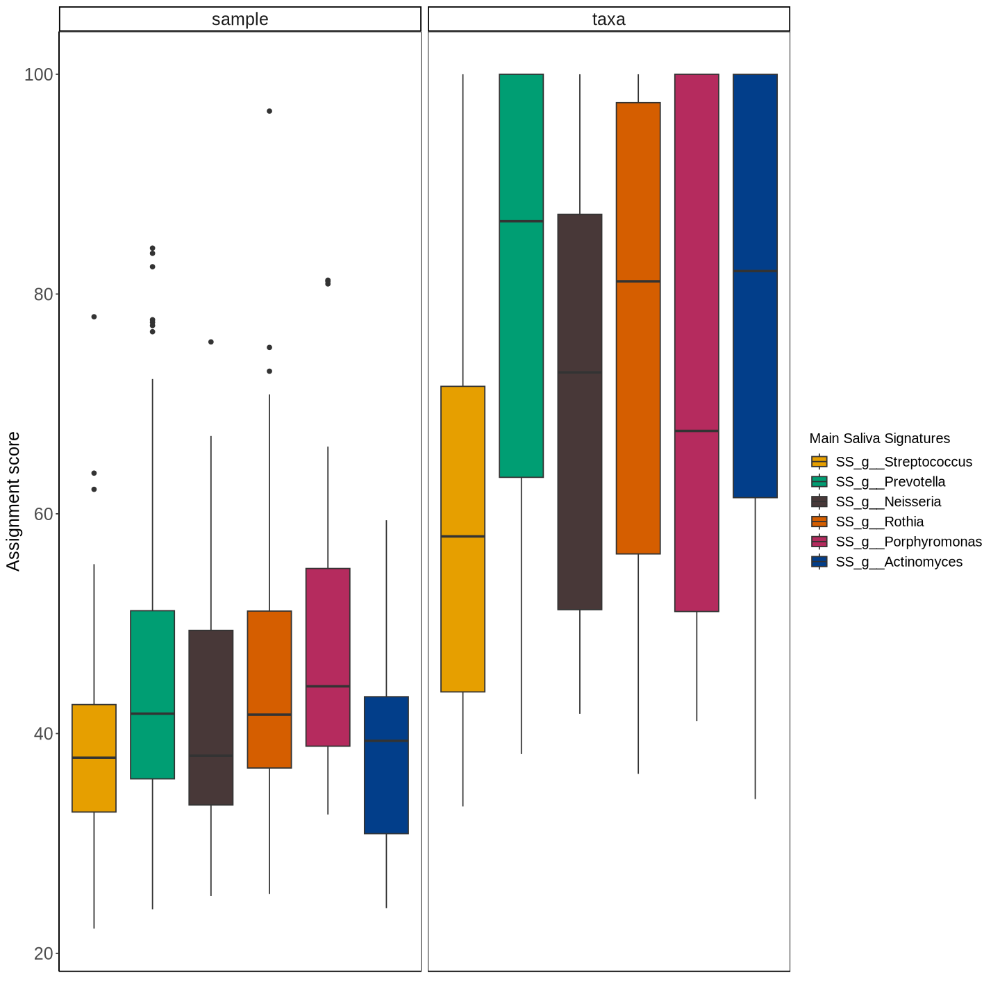

In [442]:
# figure
f = ggplot(all_assign, aes(x=prediction_nm, y=proba, fill=prediction_nm))+
    geom_boxplot()+ #width=0.1, alpha=0.4
    facet_grid(~ type, labeller = label_wrap_gen(width=12)) +
    theme_classic() +
    scale_fill_manual(values=es2Col) + 
    labs(y= "Assignment score", x="", fill="Main Saliva Signatures") +
    theme(panel.grid = element_blank(),
        axis.text.x = element_blank(), #element_text(angle = 45, hjust = 1),
        # legend.position = "none",
        panel.border = element_rect(colour = "black", fill=NA),
        axis.text=element_text(size=15),
        axis.ticks.x = element_blank(),
        legend.text=element_text(size=12),
        legend.title=element_text(size=12),
        axis.title=element_text(size=15),
        strip.text.x=element_text(size=15)
        )

f

In [325]:
pdf("sample-taxa-350.pdf", width = 10, height = 8)
print(f)
dev.off()

png 
  2

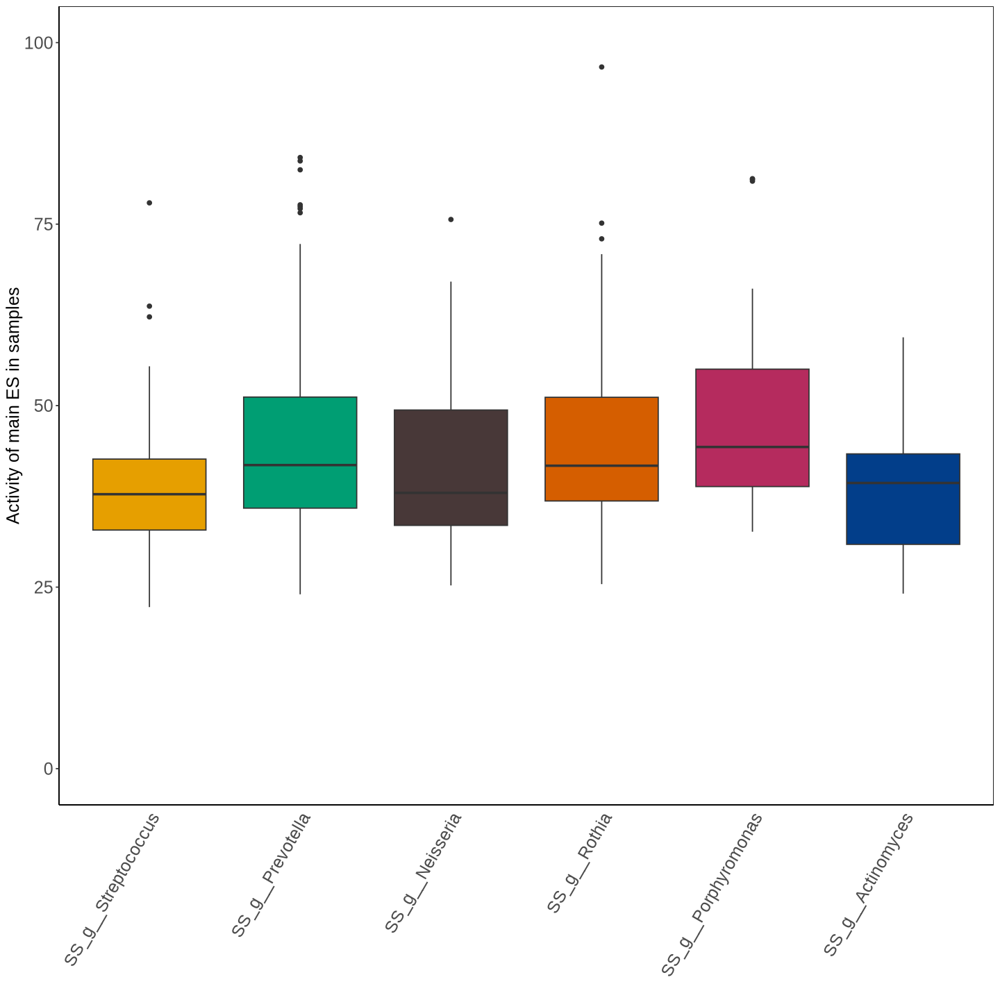

In [252]:
f1 = ggplot(sample_assignments, aes(x=prediction_nm, y=proba, fill=prediction_nm))+
    geom_boxplot()+ #width=0.1, alpha=0.4
    theme_classic() +
    scale_fill_manual(values=es2Col) + 
    labs(y= "Activity of main ES in samples", x="", fill="Main ES") +
    theme(panel.grid = element_blank(),
        axis.text.x = element_text(angle = 60, hjust = 1),
        legend.position = "none",
        panel.border = element_rect(colour = "black", fill=NA),
        axis.text=element_text(size=15),
        axis.ticks.x = element_blank(),
        legend.text=element_text(size=12),
        legend.title=element_text(size=12),
        axis.title=element_text(size=15),
        strip.text.x=element_text(size=15)
        )+
        ylim(0, 100)
f1

Warning message in `[.data.table`(df.outliers, , list(x.outliers = unlist(x.outliers), :
“Item 2 of j's result for group 1 is zero length. This will be filled with 3 NAs to match the longest column in this result. Later groups may have a similar problem but only the first is reported to save filling the warning buffer.”


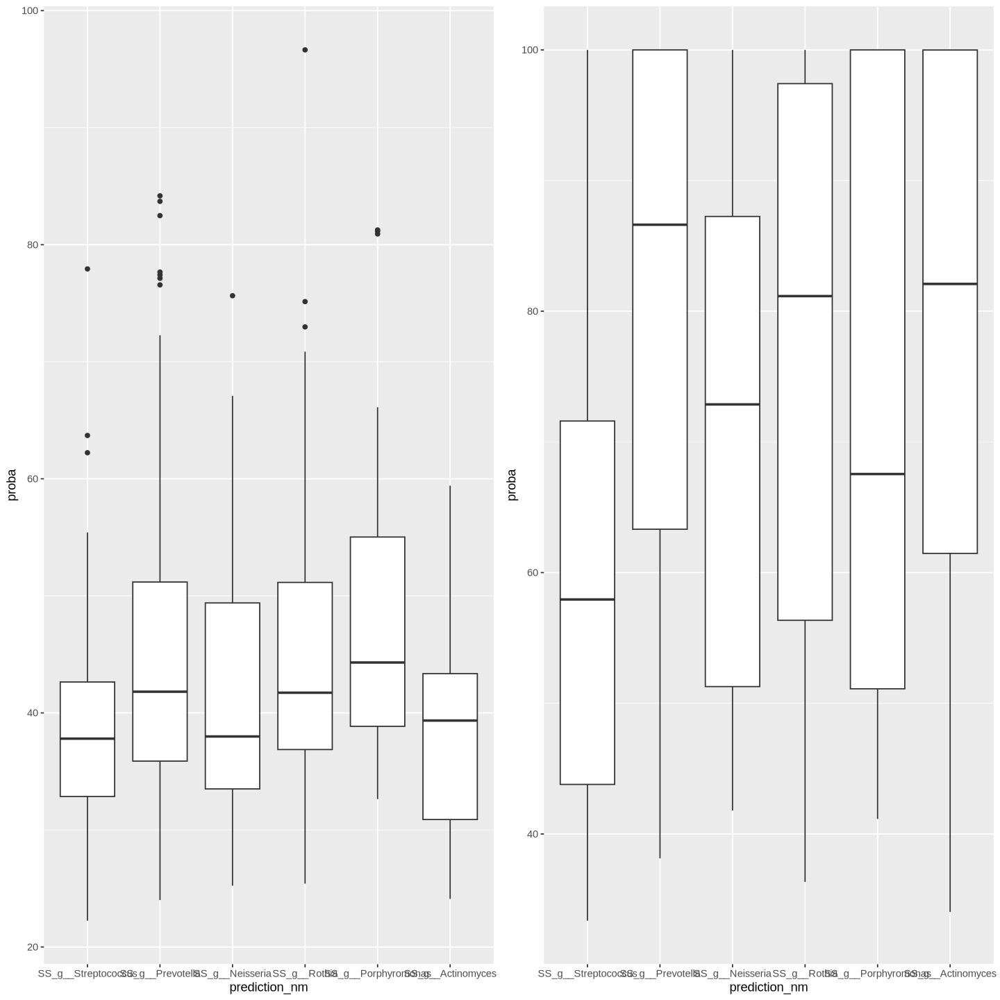

In [444]:
# Step 1. Plot each dimension's boxplot separately:
plot.x = ggplot(sample_assignments, aes(x=prediction_nm, y=proba)) + geom_boxplot()
plot.y = ggplot(assignments, aes(x=prediction_nm, y=proba)) + geom_boxplot()
grid.arrange(plot.x, plot.y, ncol=2)
# Step 2. Obtain the calculated boxplot values (including outliers) in 1 data frame:
plot.x <- layer_data(plot.x)[,1:6]
plot.y <- layer_data(plot.y)[,1:6]
colnames(plot.x) <- paste0("x.", gsub("y", "", colnames(plot.x)))
colnames(plot.y) <- paste0("y.", gsub("y", "", colnames(plot.y)))
df <- cbind(plot.x, plot.y); rm(plot.x, plot.y)
df$category <- sort(unique(assignments$prediction_nm))
# Step 3. Create a separate data frame for outliers:
library(dplyr)
df.outliers <- df %>%
dplyr::select(category, x.middle, x.outliers, y.middle, y.outliers) %>%
data.table::data.table()
df.outliers <- df.outliers[, list(x.outliers = unlist(x.outliers), y.outliers = unlist(y.outliers)), 
                        by = list(category, x.middle, y.middle)]

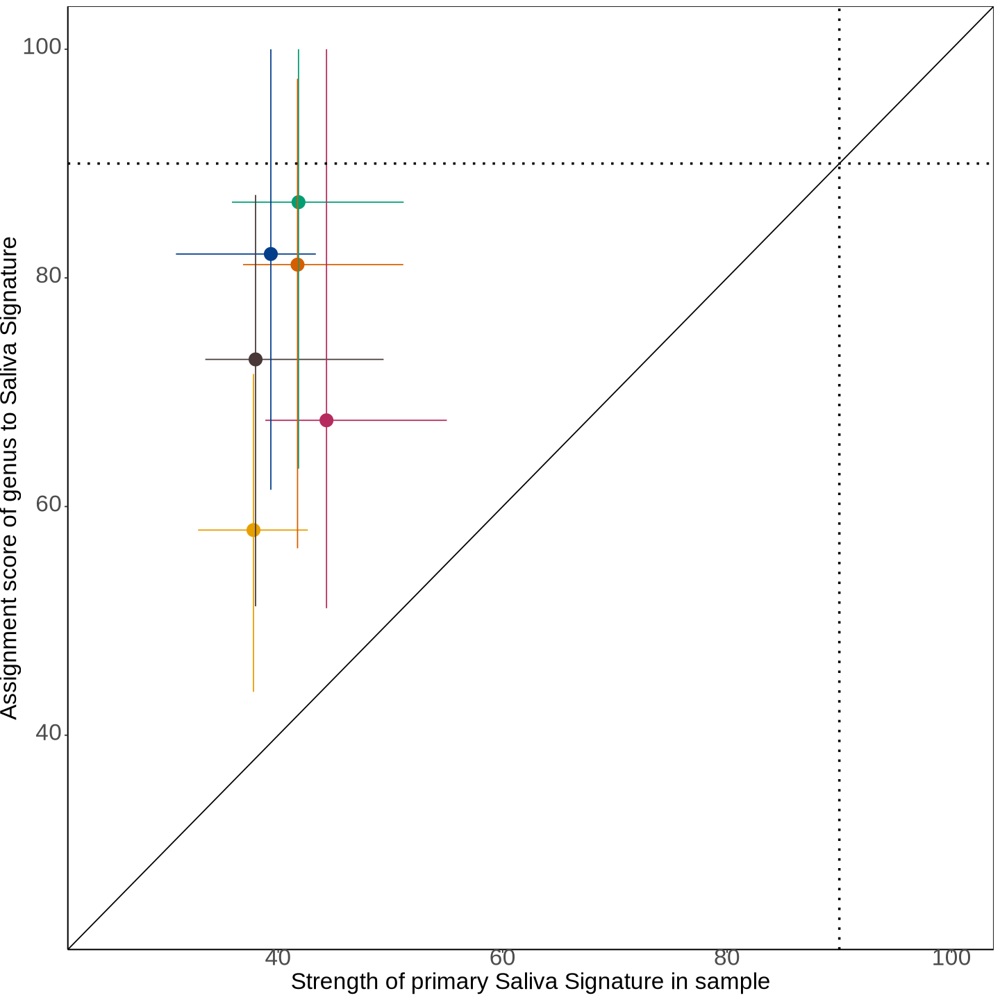

In [445]:
h <- ggplot(df) + geom_point(aes(x = x.middle, y = y.middle, color = category), size = 5) + 
        geom_segment(aes(x = x.lower, y = y.middle, xend = x.upper, yend = y.middle, color = category)) + #whiskers
        geom_segment(aes(x = x.middle, y = y.lower, xend = x.middle, yend = y.upper, color = category)) + #whiskers
            scale_color_manual(values=es2Col) + 
            coord_cartesian(xlim = c(25, 100), ylim = c(25, 100)) +
            xlab("Strength of primary Saliva Signature in sample") +
            ylab("Assignment score of genus to Saliva Signature") +
            theme_classic() +
            theme(panel.grid = element_blank(),
                legend.position = "none",
                panel.border = element_rect(colour = "black", fill=NA),
                axis.text=element_text(size=20),
                legend.text=element_text(size=20),
                legend.title=element_text(size=20),
                axis.title=element_text(size=20),
                strip.text.x=element_text(size=20)
                ) + 
                geom_vline(xintercept = 90, linetype="dotted", color = "black", size=1) + 
                geom_hline(yintercept = 90, linetype="dotted", color = "black", size=1) +
                geom_abline(intercept = 0, slope = 1)
h

In [330]:
pdf("sample-taxa-350_alter.pdf", width = 10, height = 8)
print(h)
dev.off()

png 
  2

In [446]:
all_assign$proba_taxa <- NA  # Initialize the new column with NA values
all_assign$proba_sample <- NA
head(all_assign)

,prediction,prediction_nm,id,proba,type,proba_taxa,proba_sample
,<int>,<fct>,<chr>,<dbl>,<chr>,<lgl>,<lgl>
g__Actinobaculum,4,SS_g__Actinomyces,g__Actinobaculum,34.03322,taxa,NA,NA
g__Actinomyces,6,SS_g__Porphyromonas,g__Actinomyces,80.44003,taxa,NA,NA
g__GGB9835,2,SS_g__Prevotella,g__GGB9835,100.00000,taxa,NA,NA
g__Pauljensenia,6,SS_g__Porphyromonas,g__Pauljensenia,42.19913,taxa,NA,NA
g__Peptidiphaga,3,SS_g__Neisseria,g__Peptidiphaga,44.67984,taxa,NA,NA
g__Schaalia,5,SS_g__Rothia,g__Schaalia,41.97195,taxa,NA,NA


In [447]:
summary(all_assign$proba) 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  22.25   38.06   49.35   56.24   73.37  100.00 

In [448]:
all_assign$proba_taxa <- ifelse(all_assign$type == "taxa", all_assign$proba, NA)
all_assign$proba_sample <- ifelse(all_assign$type == "sample", all_assign$proba, NA)

In [449]:
head(all_assign)
tail(all_assign)

,prediction,prediction_nm,id,proba,type,proba_taxa,proba_sample
,<int>,<fct>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
g__Actinobaculum,4,SS_g__Actinomyces,g__Actinobaculum,34.03322,taxa,34.03322,NA
g__Actinomyces,6,SS_g__Porphyromonas,g__Actinomyces,80.44003,taxa,80.44003,NA
g__GGB9835,2,SS_g__Prevotella,g__GGB9835,100.00000,taxa,100.00000,NA
g__Pauljensenia,6,SS_g__Porphyromonas,g__Pauljensenia,42.19913,taxa,42.19913,NA
g__Peptidiphaga,3,SS_g__Neisseria,g__Peptidiphaga,44.67984,taxa,44.67984,NA
g__Schaalia,5,SS_g__Rothia,g__Schaalia,41.97195,taxa,41.97195,NA


,prediction,prediction_nm,id,proba,type,proba_taxa,proba_sample
,<int>,<fct>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
SRR19117626,3,SS_g__Neisseria,SRR19117626,64.31395,sample,NA,64.31395
SRR19117625,3,SS_g__Neisseria,SRR19117625,31.53645,sample,NA,31.53645
SRR19117624,5,SS_g__Rothia,SRR19117624,63.17051,sample,NA,63.17051
SRR19117623,4,SS_g__Actinomyces,SRR19117623,34.38133,sample,NA,34.38133
SRR19117621,1,SS_g__Streptococcus,SRR19117621,26.31779,sample,NA,26.31779
SRR19117620,1,SS_g__Streptococcus,SRR19117620,55.41569,sample,NA,55.41569


In [450]:
summary(all_assign$proba_sample)
summary(all_assign$proba_taxa)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  22.25   33.52   40.32   43.02   49.42   96.65     222 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  33.37   59.03   80.09   77.09  100.00  100.00     350 

In [262]:
tax_assign_summary <- as.data.frame(all_assign %>%
                    group_by(type, prediction_nm) %>%
                    dplyr::summarise(n = dplyr::n(), Mean=mean(proba), Max=max(proba), Min=min(proba), Median=median(proba), Std=sd(proba)) %>%
                    mutate(freq = n / sum(n)))

tax_assign_summary

`summarise()` has grouped output by 'type'. You can override using the `.groups` argument.


type,prediction_nm,n,Mean,Max,Min,Median,Std,freq
<chr>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
sample,SS_g__Streptococcus,66,39.20210,77.93132,22.24983,37.79863,9.807153,0.18857143
sample,SS_g__Prevotella,69,45.80601,84.17770,24.00946,41.81039,15.219471,0.19714286
sample,SS_g__Neisseria,53,42.09113,75.64256,25.23490,37.98439,12.537292,0.15142857
sample,SS_g__Rothia,63,45.09896,96.64581,25.41177,41.72350,13.892447,0.18000000
sample,SS_g__Porphyromonas,38,48.64819,81.26002,32.63473,44.30483,13.801383,0.10857143
sample,SS_g__Actinomyces,61,39.15468,59.41298,24.10945,39.34441,9.104872,0.17428571
taxa,SS_g__Streptococcus,16,61.32530,100.00000,33.36609,57.94362,23.452535,0.07207207
taxa,SS_g__Prevotella,88,81.58286,100.00000,38.13478,86.62137,18.642955,0.39639640
taxa,SS_g__Neisseria,22,71.66022,100.00000,41.80082,72.87032,20.460376,0.09909910


In [266]:
# colors
assigned_sample_color = es2Col[as.character(sample_assignments$prediction_nm)]
names(assigned_sample_color) = sample_assignments$id
es_pointshape=c(0,1,17,3,4,18,6,8,13,9,2, 26)
names(es_pointshape) = all_es_names
sample_shape = es_pointshape[as.character(sample_assignments$prediction_nm)] 
names(sample_shape) = sample_assignments$id 


In [267]:
head(sample_assignments)
head(assignments)

,prediction,prediction_nm,id,proba,type
,<int>,<fct>,<chr>,<dbl>,<chr>
ERR2764793,2,SS_g__Prevotella,ERR2764793,51.40306,sample
ERR2764795,2,SS_g__Prevotella,ERR2764795,52.05703,sample
ERR2764796,2,SS_g__Prevotella,ERR2764796,51.32742,sample
ERR2764794,2,SS_g__Prevotella,ERR2764794,51.18028,sample
ERR2764803,2,SS_g__Prevotella,ERR2764803,42.12482,sample
ERR2764801,2,SS_g__Prevotella,ERR2764801,42.59236,sample


,prediction,prediction_nm,id,proba,type
,<int>,<fct>,<chr>,<dbl>,<chr>
g__Actinobaculum,4,SS_g__Actinomyces,g__Actinobaculum,34.03322,taxa
g__Actinomyces,6,SS_g__Porphyromonas,g__Actinomyces,80.44003,taxa
g__GGB9835,2,SS_g__Prevotella,g__GGB9835,100.00000,taxa
g__Pauljensenia,6,SS_g__Porphyromonas,g__Pauljensenia,42.19913,taxa
g__Peptidiphaga,3,SS_g__Neisseria,g__Peptidiphaga,44.67984,taxa
g__Schaalia,5,SS_g__Rothia,g__Schaalia,41.97195,taxa


In [ ]:
unique(mdmx$disease_status)

In [268]:
agecat2col = c("#E69F00", "#483838", "#009E73")#, "#56B4E9", "#023e8a", "#B0437F", "#D55E00", "#D8EEFD", "#615C99", "#6C6F7F")#, "#FF9E51", "#FCACD8")

names(agecat2col) = unique(mdmx$sex) #c("pre-eclampsia", "pre-term delivery", "full-term delivery") #, "adult", "elder")

In [269]:
agecat2col

M         F         0 
"#E69F00" "#483838" "#009E73"

In [270]:
mdmx$AgeCat3 <- as.factor(mdmx$sex)
head(mdmx)

,accession,SmplID,age,disease_status,sex,race.country,BMI,AgeCat3
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<fct>
9,SAMEA4873293,ERR2764793,NA,Control,M,Germany,NA,M
11,SAMEA4873294,ERR2764795,NA,Control,M,Germany,NA,M
12,SAMEA4873294,ERR2764796,NA,Control,M,Germany,NA,M
13,SAMEA4873294,ERR2764794,NA,Control,M,Germany,NA,M
18,SAMEA4873296,ERR2764803,NA,Control,M,Germany,NA,M
19,SAMEA4873296,ERR2764801,NA,Control,M,Germany,NA,M


In [271]:
dim(mdmx)

[1] 350   8

In [272]:
pce <- data.frame(SmplID=rownames(t(H_norm)), ageCat=mdmx[mdmx$SmplID %in% rownames(t(H_norm)),"AgeCat3"])
head(pce)

,SmplID,ageCat
,<chr>,<fct>
1,ERR2764793,M
2,ERR2764795,M
3,ERR2764796,M
4,ERR2764794,M
5,ERR2764803,M
6,ERR2764801,M


In [273]:
pce$variance = apply(t(H_norm),1, function(x) sum(sort(x, decreasing = TRUE)))
                     head(pce)
                     tail(pce)

,SmplID,ageCat,variance
,<chr>,<fct>,<dbl>
1,ERR2764793,M,100
2,ERR2764795,M,100
3,ERR2764796,M,100
4,ERR2764794,M,100
5,ERR2764803,M,100
6,ERR2764801,M,100


,SmplID,ageCat,variance
,<chr>,<fct>,<dbl>
345,SRR19117626,M,100
346,SRR19117625,M,100
347,SRR19117624,M,100
348,SRR19117623,M,100
349,SRR19117621,F,100
350,SRR19117620,M,100


In [274]:
es_nb

[1] 6

In [275]:
datalist = list()
for (nbsig in c(1:es_nb)){
    pcexplained_sample <- data.frame(SmplID=rownames(t(H_norm)), ageCat=mdmx[mdmx$SmplID %in% rownames(t(H_norm)),"AgeCat3"], nb_es = nbsig)
    pcexplained_sample$variance = apply(t(H_norm),1, function(x) sum(sort(x, decreasing = TRUE)[1:nbsig]))
    datalist[[nbsig]] <- pcexplained_sample
}

In [276]:
final_df = do.call(rbind, datalist)
head(final_df)
tail(final_df)

,SmplID,ageCat,nb_es,variance
,<chr>,<fct>,<int>,<dbl>
1,ERR2764793,M,1,51.40306
2,ERR2764795,M,1,52.05703
3,ERR2764796,M,1,51.32742
4,ERR2764794,M,1,51.18028
5,ERR2764803,M,1,42.12482
6,ERR2764801,M,1,42.59236


,SmplID,ageCat,nb_es,variance
,<chr>,<fct>,<int>,<dbl>
2095,SRR19117626,M,6,100
2096,SRR19117625,M,6,100
2097,SRR19117624,M,6,100
2098,SRR19117623,M,6,100
2099,SRR19117621,F,6,100
2100,SRR19117620,M,6,100


In [277]:
# calculate descriptive statistics by group
data_summary <- function(data, varname, groupnames){
    summary_func <- function(x, col){
        c(mean = mean(x[[col]], na.rm=TRUE),
        sd = sd(x[[col]], na.rm=TRUE))
    }
    data_sum<-ddply(data, groupnames, .fun=summary_func,
                    varname)
    data_sum <- plyr::rename(data_sum, c("mean" = varname))
    return(data_sum)
}


In [280]:
df_summary <- data_summary(final_df, varname="variance", 
                    groupnames=c("nb_es", "ageCat"))
(df_summary)

nb_es,ageCat,variance,sd
<int>,<fct>,<dbl>,<dbl>
1,0,39.57539,7.760926e+00
1,F,43.17162,1.332338e+01
1,M,43.10134,1.282735e+01
2,0,64.64248,9.590135e+00
2,F,69.32646,1.181080e+01
2,M,68.99846,1.239369e+01
3,0,82.42050,9.327998e+00
3,F,85.71405,7.865291e+00
3,M,85.35279,8.820671e+00


In [282]:
df_summary <- data_summary(final_df, varname="variance", 
                    groupnames=c("nb_es"))
(df_summary)

nb_es,variance,sd
<int>,<dbl>,<dbl>
1,43.02024,1.290194e+01
2,69.00025,1.206890e+01
3,85.41339,8.439803e+00
4,95.07873,4.643691e+00
5,99.22550,1.703797e+00
6,100.00000,8.157487e-15


In [283]:
head(final_df)
dim(final_df)
tail(final_df)

,SmplID,ageCat,nb_es,variance
,<chr>,<fct>,<int>,<dbl>
1,ERR2764793,M,1,51.40306
2,ERR2764795,M,1,52.05703
3,ERR2764796,M,1,51.32742
4,ERR2764794,M,1,51.18028
5,ERR2764803,M,1,42.12482
6,ERR2764801,M,1,42.59236


[1] 2100    4

,SmplID,ageCat,nb_es,variance
,<chr>,<fct>,<int>,<dbl>
2095,SRR19117626,M,6,100
2096,SRR19117625,M,6,100
2097,SRR19117624,M,6,100
2098,SRR19117623,M,6,100
2099,SRR19117621,F,6,100
2100,SRR19117620,M,6,100


In [284]:
# Convertir nb_es et agecat en facteur
df_summary$nb_es=as.factor(df_summary$nb_es)


In [ ]:
head(df_summary)


In [316]:
# find the min nb ES enabling to explain more than 90% of the sample
# get rid of rows <90% variance
min_es_nb = final_df[final_df$variance >= 90,]
head(min_es_nb)
dim(min_es_nb)

,SmplID,ageCat,nb_es,variance
,<chr>,<fct>,<int>,<dbl>
126,SRR19117463,F,1,96.64581
367,ERR2764817,M,2,91.72613
368,ERR2764818,M,2,92.34959
369,ERR2764816,M,2,92.02681
373,ERR2764834,F,2,96.37116
374,ERR2764832,F,2,96.32065


[1] 1127    4

In [286]:
# keep the min ES for each sample
library(dplyr)
min_es_nb_min <- min_es_nb %>% group_by(SmplID) %>% slice(which.min(nb_es))
head(min_es_nb_min)
dim(min_es_nb_min)

SmplID,ageCat,nb_es,variance
<chr>,<fct>,<int>,<dbl>
ERR2764793,M,4,93.66419
ERR2764794,M,4,96.62399
ERR2764795,M,4,96.61556
ERR2764796,M,4,96.18949
ERR2764801,M,3,91.61591
ERR2764802,M,3,91.61158


[1] 350   4

In [287]:
min_es_nb_min$nb_es = as.factor(min_es_nb_min$nb_es)

In [288]:
head(min_es_nb_min)

SmplID,ageCat,nb_es,variance
<chr>,<fct>,<fct>,<dbl>
ERR2764793,M,4,93.66419
ERR2764794,M,4,96.62399
ERR2764795,M,4,96.61556
ERR2764796,M,4,96.18949
ERR2764801,M,3,91.61591
ERR2764802,M,3,91.61158


In [317]:
# get the proportion of samples in each nb_es
min_es_summary <- as.data.frame(min_es_nb_min %>%
                    group_by(ageCat, nb_es) %>%
                    dplyr::summarise(n = n()) %>%
                    mutate(freq = n / sum(n)))
min_es_summary

`summarise()` has grouped output by 'ageCat'. You can override using the `.groups` argument.


ageCat,nb_es,n,freq
<fct>,<fct>,<int>,<dbl>
0,3,4,0.363636364
0,4,4,0.363636364
0,5,3,0.272727273
F,1,1,0.006756757
F,2,7,0.047297297
F,3,39,0.263513514
F,4,78,0.527027027
F,5,23,0.155405405
M,2,9,0.047120419


In [290]:
min_es_summary_all <- as.data.frame(min_es_nb_min %>%
                    group_by(nb_es) %>%
                    dplyr::summarise(n = n()) %>%
                    mutate(freq = n / sum(n)))

In [291]:
min_es_summary_all

nb_es,n,freq
<fct>,<int>,<dbl>
1,1,0.002857143
2,16,0.045714286
3,95,0.271428571
4,186,0.531428571
5,51,0.145714286
6,1,0.002857143


In [292]:
# calculate the frequency out of the total nb of sample by ageCat
min_es_summary$freq_ac = 100 * ave(min_es_summary$n, min_es_summary$ageCat, FUN=function(x)x/sum(x))
head(min_es_summary)

,ageCat,nb_es,n,freq,freq_ac
,<fct>,<fct>,<int>,<dbl>,<dbl>
1,0,3,4,0.363636364,36.3636364
2,0,4,4,0.363636364,36.3636364
3,0,5,3,0.272727273,27.2727273
4,F,1,1,0.006756757,0.6756757
5,F,2,7,0.047297297,4.7297297
6,F,3,39,0.263513514,26.3513514


In [293]:
sp_assignments <- sample_assignments
dim(sp_assignments)
head(sp_assignments)

[1] 350   5

,prediction,prediction_nm,id,proba,type
,<int>,<fct>,<chr>,<dbl>,<chr>
ERR2764793,2,SS_g__Prevotella,ERR2764793,51.40306,sample
ERR2764795,2,SS_g__Prevotella,ERR2764795,52.05703,sample
ERR2764796,2,SS_g__Prevotella,ERR2764796,51.32742,sample
ERR2764794,2,SS_g__Prevotella,ERR2764794,51.18028,sample
ERR2764803,2,SS_g__Prevotella,ERR2764803,42.12482,sample
ERR2764801,2,SS_g__Prevotella,ERR2764801,42.59236,sample


In [294]:
sp_assignments$"agecat" <- mdmx[match(rownames(sp_assignments), mdmx$SmplID), "AgeCat3"]

In [295]:
head(sp_assignments)

,prediction,prediction_nm,id,proba,type,agecat
,<int>,<fct>,<chr>,<dbl>,<chr>,<fct>
ERR2764793,2,SS_g__Prevotella,ERR2764793,51.40306,sample,M
ERR2764795,2,SS_g__Prevotella,ERR2764795,52.05703,sample,M
ERR2764796,2,SS_g__Prevotella,ERR2764796,51.32742,sample,M
ERR2764794,2,SS_g__Prevotella,ERR2764794,51.18028,sample,M
ERR2764803,2,SS_g__Prevotella,ERR2764803,42.12482,sample,M
ERR2764801,2,SS_g__Prevotella,ERR2764801,42.59236,sample,M


In [347]:
main_es_summary <- as.data.frame(sp_assignments %>%
                    group_by(agecat, prediction_nm) %>%
                    dplyr::summarise(n = n()) %>%
                    mutate(freq = n / sum(n)))
main_es_summary

`summarise()` has grouped output by 'agecat'. You can override using the `.groups` argument.


agecat,prediction_nm,n,freq
<fct>,<fct>,<int>,<dbl>
0,SS_g__Streptococcus,1,0.09090909
0,SS_g__Prevotella,3,0.27272727
0,SS_g__Neisseria,2,0.18181818
0,SS_g__Rothia,3,0.27272727
0,SS_g__Porphyromonas,2,0.18181818
F,SS_g__Streptococcus,28,0.18918919
F,SS_g__Prevotella,30,0.20270270
F,SS_g__Neisseria,22,0.14864865
F,SS_g__Rothia,26,0.17567568


In [348]:
main_es_summary1 <- as.data.frame(sp_assignments %>%
                    group_by(prediction_nm) %>%
                    dplyr::summarise(n = n()) %>%
                    mutate(freq = n / sum(n)))
main_es_summary1

prediction_nm,n,freq
<fct>,<int>,<dbl>
SS_g__Streptococcus,66,0.1885714
SS_g__Prevotella,69,0.1971429
SS_g__Neisseria,53,0.1514286
SS_g__Rothia,63,0.1800000
SS_g__Porphyromonas,38,0.1085714
SS_g__Actinomyces,61,0.1742857


In [349]:
main_es_summary

agecat,prediction_nm,n,freq
<fct>,<fct>,<int>,<dbl>
0,SS_g__Streptococcus,1,0.09090909
0,SS_g__Prevotella,3,0.27272727
0,SS_g__Neisseria,2,0.18181818
0,SS_g__Rothia,3,0.27272727
0,SS_g__Porphyromonas,2,0.18181818
F,SS_g__Streptococcus,28,0.18918919
F,SS_g__Prevotella,30,0.20270270
F,SS_g__Neisseria,22,0.14864865
F,SS_g__Rothia,26,0.17567568


In [350]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [297]:
head(min_es_nb_min)

SmplID,ageCat,nb_es,variance
<chr>,<fct>,<fct>,<dbl>
ERR2764793,M,4,93.66419
ERR2764794,M,4,96.62399
ERR2764795,M,4,96.61556
ERR2764796,M,4,96.18949
ERR2764801,M,3,91.61591
ERR2764802,M,3,91.61158


In [320]:
unique(min_es_nb_min$nb_es)
table(min_es_nb_min$nb_es)

[1] 4 3 2 5 1 6
Levels: 1 2 3 4 5 6


  1   2   3   4   5   6 
  1  16  95 186  51   1 

In [ ]:
min_es_nb_min$disease_status <- mdmx[match(min_es_nb_min$SmplID, mdmx$SmplID), "disease_status"]
tail(min_es_nb_min,10)

In [299]:
summary(min_es_nb_min$nb_es)

1   2   3   4   5   6 
  1  16  95 186  51   1

In [300]:
head(min_es_nb_min)

SmplID,ageCat,nb_es,variance
<chr>,<fct>,<fct>,<dbl>
ERR2764793,M,4,93.66419
ERR2764794,M,4,96.62399
ERR2764795,M,4,96.61556
ERR2764796,M,4,96.18949
ERR2764801,M,3,91.61591
ERR2764802,M,3,91.61158


In [ ]:
options(repr.plot.width=8, repr.plot.height= 8)
ggplot(data = min_es_nb_min, aes(x = Age, y = nb_es, fill = nb_es, col = nb_es, shape = ageCat)) +
  #geom_boxplot(outlier.shape = 16, alpha = 0.5) + 
  geom_jitter(position = position_jitter(0.2), alpha = 1, size = 3 ) +
  scale_color_brewer(palette = "Dark2") +
  scale_fill_brewer(palette = "Dark2") +
  #scale_shape_manual(values = c("pre-eclampsia" = 13, "pre-term delivery" = 20 , "full-term delivery"= 4)) +
  theme_minimal()

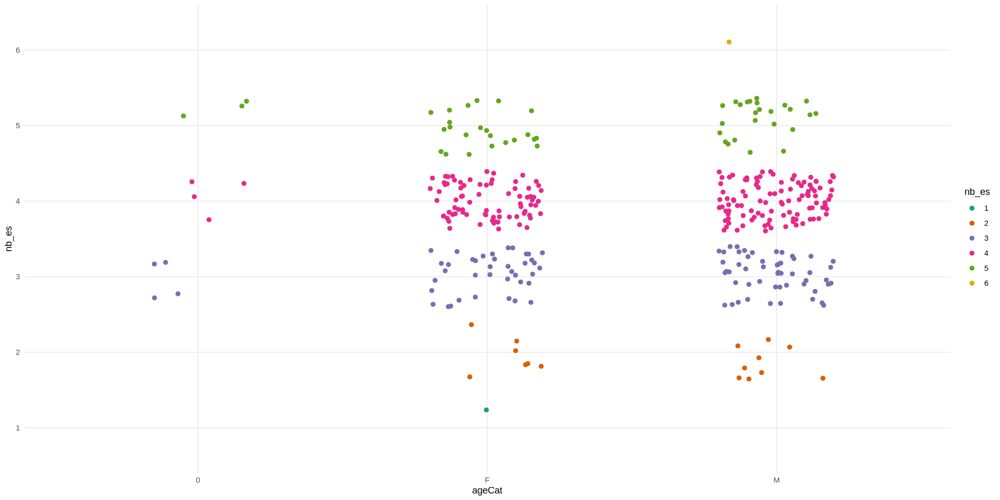

In [301]:
options(repr.plot.width=16, repr.plot.height= 8)
ggplot(data = min_es_nb_min, aes(x = ageCat, y = nb_es, fill = nb_es, col = nb_es )) +
  #geom_boxplot(outlier.shape = 16, alpha = 0.5) + 
  geom_jitter(position = position_jitter(0.2), alpha = 1, size = 2 ) +
  scale_color_brewer(palette = "Dark2") +
  #scale_shape_manual(values = c("19" = 13, "early20s" = 20, "late20s" = 18 , "early30s" = 0 ,"late30s"= 2)) +
  theme_minimal()


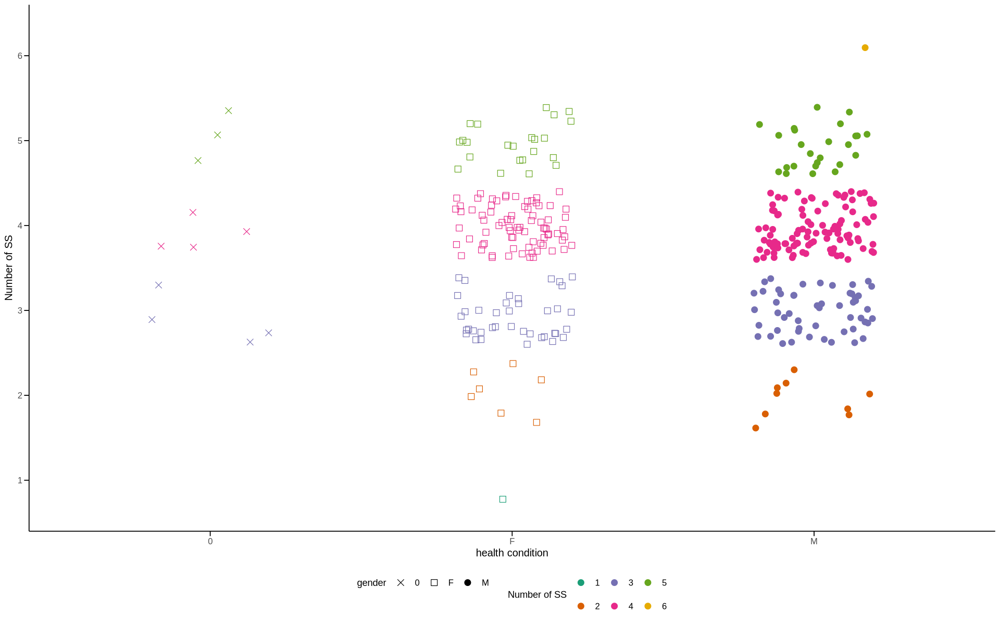

In [318]:
options(repr.plot.width=16, repr.plot.height= 10)

xy<- ggplot(data = min_es_nb_min, aes(x = ageCat, y = nb_es, fill = nb_es, col = nb_es , shape = ageCat)) +
  geom_jitter(position = position_jitter(0.2), alpha = 1, size = 3 ) +
  scale_color_brewer(palette = "Dark2", name = "Number of SS") + # Modify legend title for color scale
  scale_fill_brewer(palette = "Dark2", name = "Number of SS") + # Modify legend title for fill scale
  scale_shape_manual(values = c("F" = 0, "M" = 19 ,"0"=4 ), name = "gender") + # Modify legend title for shape scale
  theme_minimal() +
  theme(
    legend.position = "bottom", # Change legend position to bottom
    legend.box = "horizontal", # Display legend items horizontally
    legend.direction = "horizontal", # Align legend items horizontally
    legend.key.size = unit(1.5, "lines"), # Adjust the size of legend key
    legend.text = element_text(size = 10), # Modify legend text size
    axis.title = element_text(size = 12), # Modify axis title size
    axis.text = element_text(size = 10), # Modify axis text size
    axis.line = element_line(color = "black"), # Modify axis line color
    axis.ticks = element_line(color = "black"), # Modify axis tick color
    axis.ticks.length = unit(0.2, "cm"), # Adjust the length of axis ticks
    axis.ticks.margin = unit(0.1, "cm"), # Adjust the margin of axis ticks
    panel.grid.major = element_blank(), # Remove major gridlines
    panel.grid.minor = element_blank() # Remove minor gridlines
  ) +
  labs(
    x = "health condition", # Modify x-axis label
    y = "Number of SS" # Modify y-axis label
  )
xy

In [306]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

In [ ]:
pdf("xy_health_sex_plot.pdf", width = 14, height = 12)
print(xy)
dev.off()

In [307]:
# PcoA plot coloured by the number of needed ES by sample to reach 90% of variance
es_nb_col = c("#233d4d","#fe7f2d","#fcca46","#a1c181","#d1b3c4","#39a9db","#881b48","#48a9a6","#2d1012","#fe72a3")
names(es_nb_col) = c(1:10)
min_es_by_sp = min_es_nb_min$nb_es
names(min_es_by_sp) = min_es_nb_min$SmplID
min_es_by_sp_col = es_nb_col[min_es_by_sp]
names(min_es_by_sp_col) = names(min_es_by_sp)

In [309]:
getwd()

[1] "/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls"

In [ ]:
setwd("/crex/proj/naiss2023-23-521/private/delaramb/r_notebooks/enterosignature-paper/NMF_outputs_all/all_controls/")

In [312]:
# PCoA plot coloured by main ES. Show only the samples accurately explained by n ES.
if (es_nb >= 6){
    pdf("pcoa_ab_samples_subset_lg_6k_meta_350.pdf", width = 18, height = 18 ) 
    par(mfrow=c(2,2),mar = c(4,4,4,4))
    # title('PCoA (bray-curtis distance)', outer = TRUE)
    for (i in c(1:6)){
        # all colors gray
        new_colors_sp = assigned_sample_color
        new_colors_sp[names(assigned_sample_color)] = "#A9A9A9"
        # put colors to the samples we want to keep
        selected_samples = as.data.frame(subset(min_es_nb_min, nb_es==i))[,"SmplID"]
        new_colors_sp[names(new_colors_sp) %in% selected_samples] = assigned_sample_color[names(new_colors_sp) %in% selected_samples]
        ordiplot(scores(mx_norm.b.pcoa, choices=c(1,2)), type="none", main=paste0(i,"-SS samples")) #paste0("Samples described by ", i, " ES")
        points(scores(mx_norm.b.pcoa, choices=c(1,2)), col = new_colors_sp[rownames(scores(mx_norm.b.pcoa, choices=c(1,2)))], pch=sample_shape, cex=1)
        abline(h=0, lty=3)
        abline(v=0, lty=3)
        legend("bottomleft", legend=ordered_es_names, pch=es_pointshape[ordered_es_names], col=es2Col[ordered_es_names])
    }
    
    dev.off()
}

species scores not available

species scores not available

species scores not available

species scores not available

species scores not available

species scores not available



png 
  2

In [319]:
if (es_nb >= 6){
    pdf("pcoa_ab_samples_subset_lg_percent_6k_trial_350_meta.pdf", width = 18, height = 18 ) 
    par(mfrow=c(2,2),mar = c(4,4,4,4))
    
    for (i in c(1:6)){
        new_colors_sp <- assigned_sample_color
        new_colors_sp[names(assigned_sample_color)] <- "#A9A9A9"
        
        selected_samples <- as.data.frame(subset(min_es_nb_min, nb_es==i))[,"SmplID"]
        new_colors_sp[names(new_colors_sp) %in% selected_samples] <- assigned_sample_color[names(new_colors_sp) %in% selected_samples]
        
        ordiplot(scores(mx_norm.b.pcoa, choices=c(1,2)), type="none", main=paste0(i,"-SS samples")) 
        points(scores(mx_norm.b.pcoa, choices=c(1,2)), col = new_colors_sp[rownames(scores(mx_norm.b.pcoa, choices=c(1,2)))], pch=sample_shape, cex=1.8)
        abline(h=0, lty=3)
        abline(v=0, lty=3)
        
        # Calculate the percentage of selected points
        percentage_selected <- round(length(selected_samples) / nrow(min_es_nb_min) * 100, 2)
        
        # Add legend with cluster names
        legend("bottomleft", legend=ordered_es_names, pch=es_pointshape[ordered_es_names], col=es2Col[ordered_es_names], cex= 1.5)
        
        # Add text annotation for percentage of selected points
        text(x = max(mx_norm.b.pcoa$points[, 1]), y = max(mx_norm.b.pcoa$points[, 2]), labels = paste("Selected samples explainedby either 1-6 clusters:", percentage_selected, "%"), pos = 2 , cex= 1.3)
    }
    
    dev.off()
}

species scores not available

species scores not available

species scores not available

species scores not available

species scores not available

species scores not available



png 
  2